In [1707]:
from defillama2 import DefiLlama
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.ticker import PercentFormatter, FuncFormatter

pd.set_option('display.max_columns', 15)
pd.set_option('display.max_rows', 50)
pd.options.display.float_format = '{:,.4f}'.format

%matplotlib inline
plt.rcParams['figure.figsize'] = (10, 6)
plt.style.use("fivethirtyeight")

# Makes graphs crisp. Only use if you don't have a lot of points/lines on your graph.
%config InlineBackend.figure_formats = ['svg', 'retina'] # use svg, then retina if svg is not supported

In [1708]:
def human_format_dollar_or_num(dollar=False, decimals=0):
    """ 
    Return a function for formatting matplot axis numbers human friendly. 

    Parameters
    ----------
    dollar: logical
        If True, will add $ in front of the numbers.
    decimals: int
        Number of decimals to display.
    """

    base_fmt = '%.{}f%s'.format(decimals)
    if dollar:
        base_fmt = '$' + base_fmt

    def human_format(num, pos): # pos is necessary as it'll be used by matplotlib
        magnitude = 0
        while abs(num) >= 1000:
            magnitude += 1
            num /= 1000.0
        return base_fmt % (num, ['', 'K', 'M', 'B', 'T', 'P'][magnitude])
    return human_format

## Create a DefiLlama instance

In [1709]:
obj = DefiLlama()

## Get latest yields for all pools, along with other info

In [1710]:
df = obj.get_pools_yields() # See https://defillama.com/yields for the meaning of columns.
df['apy'] = df['apy'].astype(str) + '%'
print(df.shape)
df.head()

(12060, 30)


,chain,project,symbol,tvlUsd,apyBase,apyReward,apy,...,apyMean30d,volumeUsd1d,volumeUsd7d,apyBaseInception,predictedClass,predictedProbability,binnedConfidence
0,Ethereum,lido,STETH,14304322831,3.9000,NaN,3.9%,...,3.8868,NaN,NaN,NaN,Stable/Up,56.0000,1.0000
1,Tron,justlend,BTC,3056821519,0.0003,0.0239,0.02414%,...,0.0241,NaN,NaN,NaN,Stable/Up,78.0000,3.0000
2,Arbitrum,camelot-v2,BRUH-USDC,3055925878,0.0000,NaN,0.0%,...,0.0000,NaN,NaN,NaN,None,NaN,NaN
3,Arbitrum,camelot-v2,RDO-USDC,2995936715,0.0000,NaN,0.0%,...,"1,525.4129",NaN,NaN,NaN,None,NaN,NaN
4,Ethereum,coinbase-wrapped-staked-eth,CBETH,2131198921,3.3967,NaN,3.39667%,...,3.5325,NaN,NaN,NaN,Stable/Up,68.0000,2.0000


In [1711]:
df.columns

Index(['chain', 'project', 'symbol', 'tvlUsd', 'apyBase', 'apyReward', 'apy',
       'rewardTokens', 'pool', 'apyPct1D', 'apyPct7D', 'apyPct30D',
       'stablecoin', 'ilRisk', 'exposure', 'poolMeta', 'mu', 'sigma', 'count',
       'outlier', 'underlyingTokens', 'il7d', 'apyBase7d', 'apyMean30d',
       'volumeUsd1d', 'volumeUsd7d', 'apyBaseInception', 'predictedClass',
       'predictedProbability', 'binnedConfidence'],
      dtype='object')

In [1712]:
from pandas import ExcelWriter
writer = ExcelWriter('output1.xlsx')

## Dai Saving Rate

In [1713]:
#ETH_Aave_USDC
is_true = ((df.project == 'aave-v3') &
          (df.exposure == 'single')&
           df.symbol.isin(['USDC']) &
           df.chain.isin(['Ethereum']))
cols = ['chain', 'project', 'symbol', 'pool', 'tvlUsd', 'apyBase', 'apy', 'apyPct7D', 'apyPct30D', 'apyBase7d', 'apyMean30d', 'volumeUsd7d',
        'mu', 'sigma']
df.loc[is_true, cols].sort_values('apy', ascending=False)

,chain,project,symbol,pool,tvlUsd,apyBase,apy,apyPct7D,apyPct30D,apyBase7d,apyMean30d,volumeUsd7d,mu,sigma
190,Ethereum,aave-v3,USDC,aa70268e-4b52-42bf-a116-608b370f9501,36476555,2.5389,2.53886%,-0.1373,0.6101,NaN,2.4397,NaN,2.1119,0.0268


In [1714]:
#get historical data
ETH_Aave_USDC=obj.get_pool_hist_apy('aa70268e-4b52-42bf-a116-608b370f9501')
ETH_Aave_USDC.reset_index(inplace=True)
ETH_Aave_USDC['date'] = pd.to_datetime(ETH_Aave_USDC['date']).dt.strftime('%Y-%m-%d')
ETH_Aave_USDC.to_excel(writer, sheet_name='ETH_Aave_USDC', index=False)

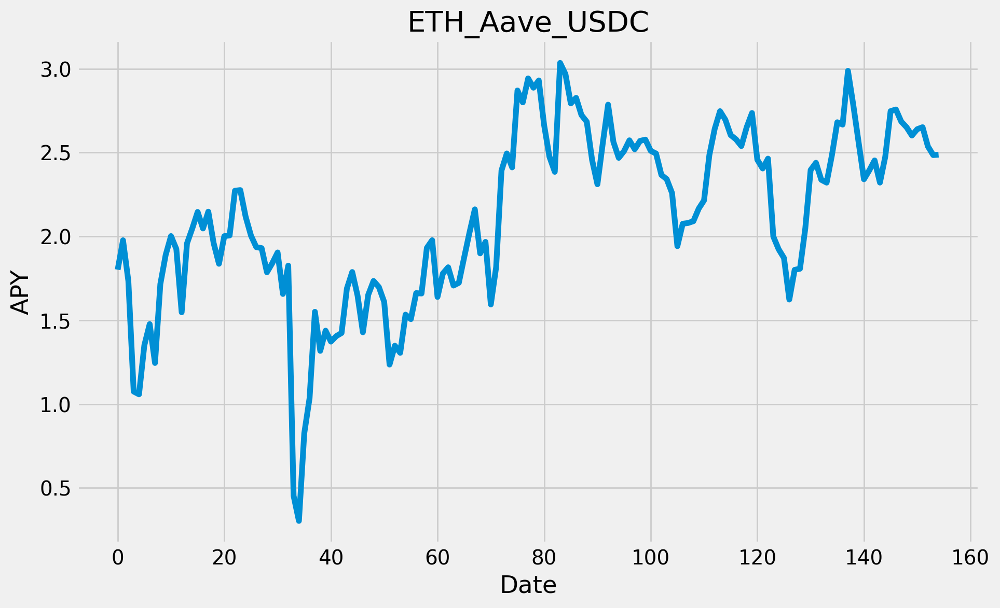

In [1715]:
# Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(ETH_Aave_USDC['apy'])

# Customize the chart
plt.title('ETH_Aave_USDC')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show()

In [1716]:
#ETH_Aave_DAI
is_true = ((df.project == 'aave-v3') &
          (df.exposure == 'single')&
           df.symbol.isin(['DAI']) &
           df.chain.isin(['Ethereum']))
cols = ['chain', 'project', 'symbol', 'pool', 'tvlUsd', 'apyBase', 'apy', 'apyPct7D', 'apyPct30D', 'apyBase7d', 'apyMean30d', 'volumeUsd7d',
        'mu', 'sigma']
df.loc[is_true, cols].sort_values('apy', ascending=False)

,chain,project,symbol,pool,tvlUsd,apyBase,apy,apyPct7D,apyPct30D,apyBase7d,apyMean30d,volumeUsd7d,mu,sigma
546,Ethereum,aave-v3,DAI,3665ee7e-6c5d-49d9-abb7-c47ab5d9d4ac,7078224,2.7711,2.77108%,0.8981,0.1564,NaN,2.7622,NaN,1.9305,0.0803


In [1717]:
#get historical data
ETH_Aave_DAI=obj.get_pool_hist_apy('3665ee7e-6c5d-49d9-abb7-c47ab5d9d4ac')
ETH_Aave_DAI.reset_index(inplace=True)
ETH_Aave_DAI['date'] = pd.to_datetime(ETH_Aave_DAI['date']).dt.strftime('%Y-%m-%d')
ETH_Aave_DAI.to_excel(writer, sheet_name='ETH_Aave_DAI', index=False)

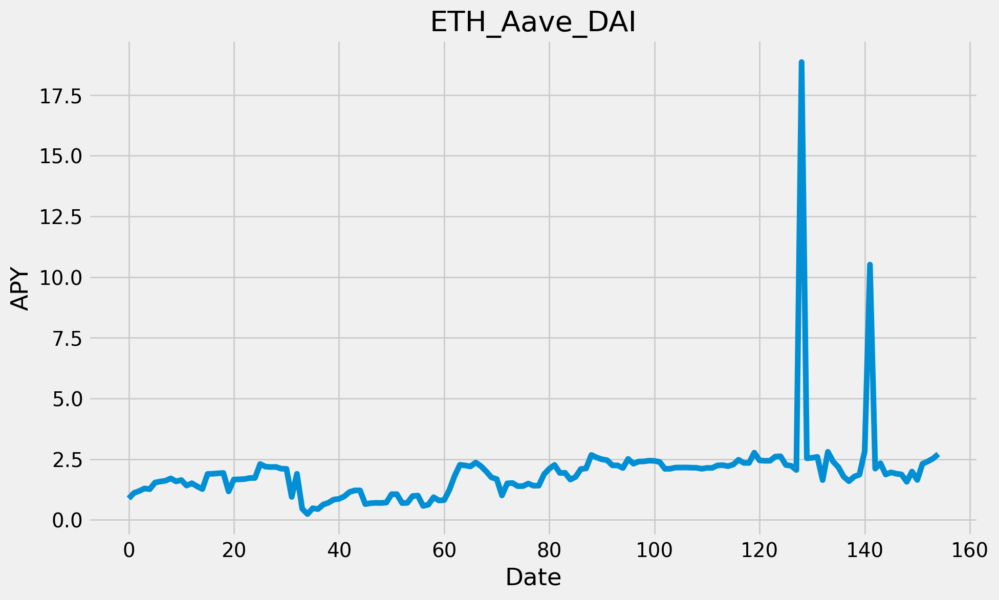

In [1718]:
# Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(ETH_Aave_DAI['apy'])

# Customize the chart
plt.title('ETH_Aave_DAI')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show()

In [1719]:
#ETH_Aave_USDT
is_true = ((df.project == 'aave-v3') &
          (df.exposure == 'single')&
           df.symbol.isin(['USDT']) &
           df.chain.isin(['Ethereum']))
cols = ['chain', 'project', 'symbol', 'pool', 'tvlUsd', 'apyBase', 'apy', 'apyPct7D', 'apyPct30D', 'apyBase7d', 'apyMean30d', 'volumeUsd7d',
        'mu', 'sigma']
df.loc[is_true, cols].sort_values('apy', ascending=False)

,chain,project,symbol,pool,tvlUsd,apyBase,apy,apyPct7D,apyPct30D,apyBase7d,apyMean30d,volumeUsd7d,mu,sigma
186,Ethereum,aave-v3,USDT,f981a304-bb6c-45b8-b0c5-fd2f515ad23a,37336981,2.4679,2.46786%,0.7248,-0.3349,NaN,2.2418,NaN,2.8881,0.2713


In [1720]:
#get historical data
ETH_Aave_USDT=obj.get_pool_hist_apy('f981a304-bb6c-45b8-b0c5-fd2f515ad23a')
ETH_Aave_USDT.reset_index(inplace=True)
ETH_Aave_USDT['date'] = pd.to_datetime(ETH_Aave_USDT['date']).dt.strftime('%Y-%m-%d')
ETH_Aave_USDT.to_excel(writer, sheet_name='ETH_Aave_USDT', index=False)

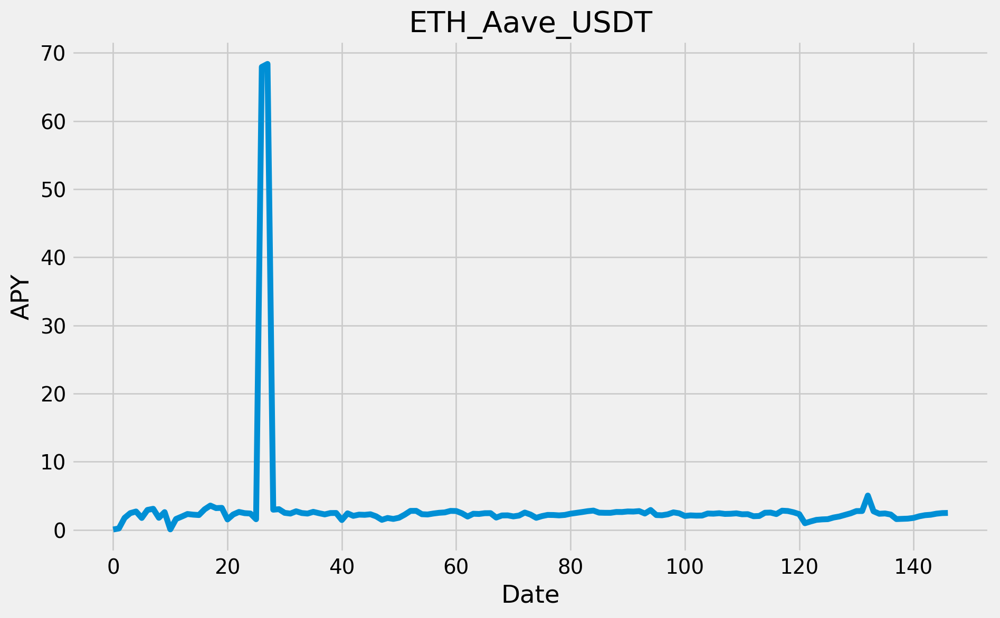

In [1721]:
# Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(ETH_Aave_USDT['apy'])

# Customize the chart
plt.title('ETH_Aave_USDT')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show()

In [1722]:
#ETH_Compound_USDC
is_true = ((df.project == 'compound')&
           df.symbol.isin(['USDC']) &
           df.chain.isin(['Ethereum']))
cols = ['chain', 'project', 'symbol', 'pool', 'tvlUsd', 'apyBase', 'apy', 'apyPct7D', 'apyPct30D', 'apyBase7d', 'apyMean30d', 'volumeUsd7d',
        'mu', 'sigma']
df.loc[is_true, cols].sort_values('apy', ascending=False)

,chain,project,symbol,pool,tvlUsd,apyBase,apy,apyPct7D,apyPct30D,apyBase7d,apyMean30d,volumeUsd7d,mu,sigma
53,Ethereum,compound,USDC,cefa9bb8-c230-459a-a855-3b94e96acd8c,150814432,2.4381,3.32101%,-0.0297,1.0977,NaN,2.7221,NaN,1.9295,0.0389


In [1723]:
#get historical data
ETH_Compound_USDC=obj.get_pool_hist_apy('cefa9bb8-c230-459a-a855-3b94e96acd8c')
ETH_Compound_USDC.reset_index(inplace=True)
ETH_Compound_USDC['date'] = pd.to_datetime(ETH_Compound_USDC['date']).dt.strftime('%Y-%m-%d')
ETH_Compound_USDC.to_excel(writer, sheet_name='ETH_Compound_USDC', index=False)

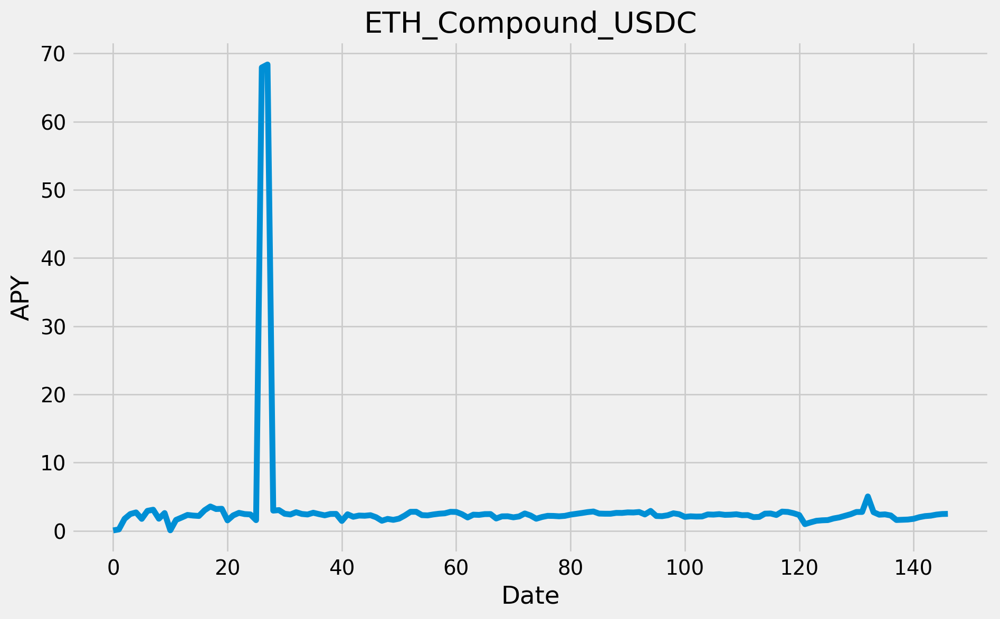

In [1724]:
# Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(ETH_Aave_USDT['apy'])

# Customize the chart
plt.title('ETH_Compound_USDC')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show()

In [1725]:
#ETH_Compound_DAI
is_true = ((df.project == 'compound')&
           df.symbol.isin(['DAI']) &
           df.chain.isin(['Ethereum']))
cols = ['chain', 'project', 'symbol', 'pool', 'tvlUsd', 'apyBase', 'apy', 'apyPct7D', 'apyPct30D', 'apyBase7d', 'apyMean30d', 'volumeUsd7d',
        'mu', 'sigma']
df.loc[is_true, cols].sort_values('apy', ascending=False)

,chain,project,symbol,pool,tvlUsd,apyBase,apy,apyPct7D,apyPct30D,apyBase7d,apyMean30d,volumeUsd7d,mu,sigma
75,Ethereum,compound,DAI,cc110152-36c2-4e10-9c12-c5b4eb662143,103806411,2.5234,3.77765%,0.1296,1.4485,NaN,2.6284,NaN,2.1751,0.0343


In [1726]:
#get historical data
ETH_Compound_DAI=obj.get_pool_hist_apy('cc110152-36c2-4e10-9c12-c5b4eb662143')
ETH_Compound_DAI.reset_index(inplace=True)
ETH_Compound_DAI['date'] = pd.to_datetime(ETH_Compound_DAI['date']).dt.strftime('%Y-%m-%d')
ETH_Compound_DAI.to_excel(writer, sheet_name='ETH_Compound_DAI', index=False)

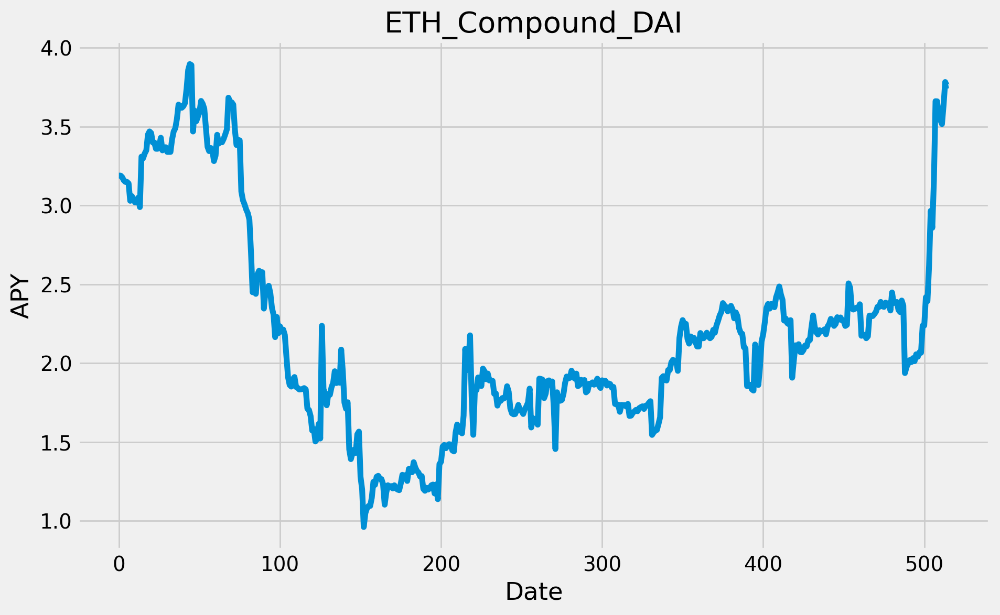

In [1727]:
# Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(ETH_Compound_DAI['apy'])

# Customize the chart
plt.title('ETH_Compound_DAI')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show()

In [1728]:
#ETH_Compound_USDT
is_true = ((df.project == 'compound')&
           df.symbol.isin(['USDT']) &
           df.chain.isin(['Ethereum']))
cols = ['chain', 'project', 'symbol', 'pool', 'tvlUsd', 'apyBase', 'apy', 'apyPct7D', 'apyPct30D', 'apyBase7d', 'apyMean30d', 'volumeUsd7d',
        'mu', 'sigma']
df.loc[is_true, cols].sort_values('apy', ascending=False)

,chain,project,symbol,pool,tvlUsd,apyBase,apy,apyPct7D,apyPct30D,apyBase7d,apyMean30d,volumeUsd7d,mu,sigma
118,Ethereum,compound,USDT,57647093-2868-4e65-97ab-9cae8ec74e7d,59133307,3.2391,3.23905%,-0.2841,0.5066,NaN,3.1945,NaN,2.5498,0.1071


In [1729]:
#get historical data
ETH_Compound_USDT=obj.get_pool_hist_apy('57647093-2868-4e65-97ab-9cae8ec74e7d')
ETH_Compound_USDT.reset_index(inplace=True)
ETH_Compound_USDT['date'] = pd.to_datetime(ETH_Compound_USDT['date']).dt.strftime('%Y-%m-%d')
ETH_Compound_USDT.to_excel(writer, sheet_name='ETH_Compound_USDT', index=False)

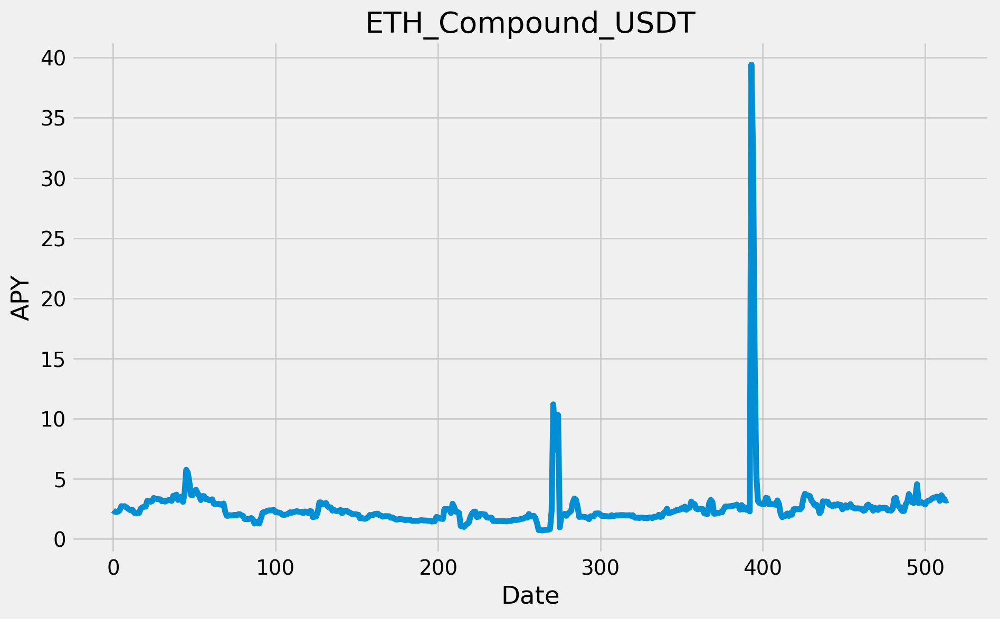

In [1730]:
# Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(ETH_Compound_USDT['apy'])

# Customize the chart
plt.title('ETH_Compound_USDT')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show()

In [1731]:
#ARB_Aave3_USDC
is_true = ((df.project == 'aave-v3') &
          (df.exposure == 'single')&
           df.symbol.isin(['USDC']) &
           df.chain.isin(['Arbitrum']))
cols = ['chain', 'project', 'symbol', 'pool', 'tvlUsd', 'apyBase', 'apy', 'apyPct7D', 'apyPct30D', 'apyBase7d', 'apyMean30d', 'volumeUsd7d',
        'mu', 'sigma']
df.loc[is_true, cols].sort_values('apy', ascending=False)


,chain,project,symbol,pool,tvlUsd,apyBase,apy,apyPct7D,apyPct30D,apyBase7d,apyMean30d,volumeUsd7d,mu,sigma
4121,Arbitrum,aave-v3,USDC,d9fa8e14-0447-4207-9ae8-7810199dfa1f,267902,2.7771,2.77711%,1.1444,NaN,NaN,4.2284,NaN,4.4127,0.2210
524,Arbitrum,aave-v3,USDC,7aab7b0f-01c1-4467-bc0d-77826d870f19,7462003,2.5644,2.5644%,0.1504,0.6010,NaN,2.2959,NaN,0.9673,0.0326


In [1732]:
#get historical data
ARB_Aave3_USDC_1=obj.get_pool_hist_apy('7aab7b0f-01c1-4467-bc0d-77826d870f19')
ARB_Aave3_USDC_1.reset_index(inplace=True)
ARB_Aave3_USDC_1['date'] = pd.to_datetime(ARB_Aave3_USDC_1['date']).dt.strftime('%Y-%m-%d')
ARB_Aave3_USDC_1.to_excel(writer, sheet_name='ARB_Aave3_USDC#1', index=False)

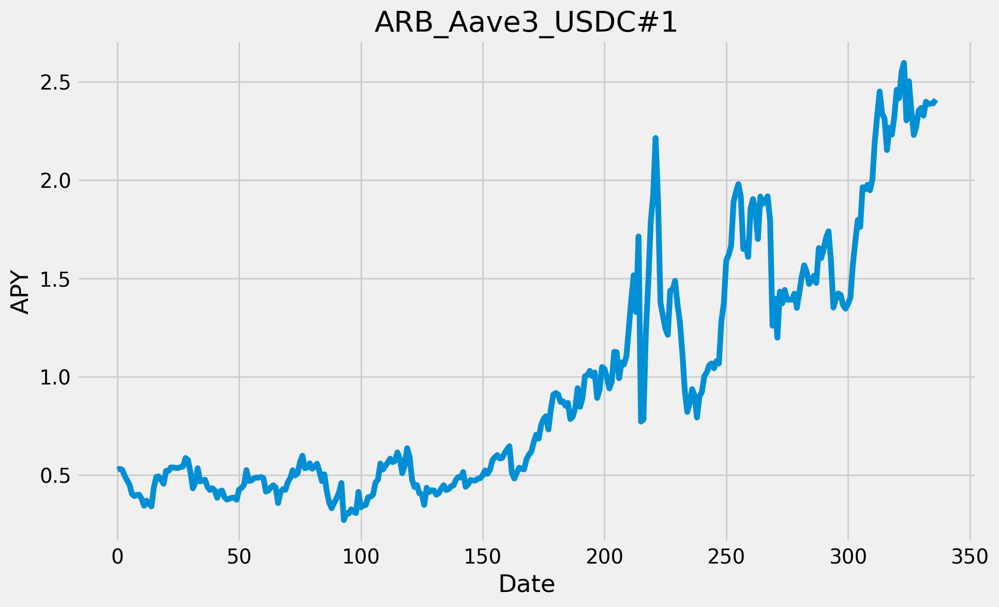

In [1733]:
# Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(ARB_Aave3_USDC_1['apy'])

# Customize the chart
plt.title('ARB_Aave3_USDC#1')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show()

In [1734]:
#get historical data
ARB_Aave3_USDC_2=obj.get_pool_hist_apy('d9fa8e14-0447-4207-9ae8-7810199dfa1f')
ARB_Aave3_USDC_2.reset_index(inplace=True)
ARB_Aave3_USDC_2['date'] = pd.to_datetime(ARB_Aave3_USDC_2['date']).dt.strftime('%Y-%m-%d')
ARB_Aave3_USDC_2.to_excel(writer, sheet_name='ARB_Aave3_USDC#2', index=False)

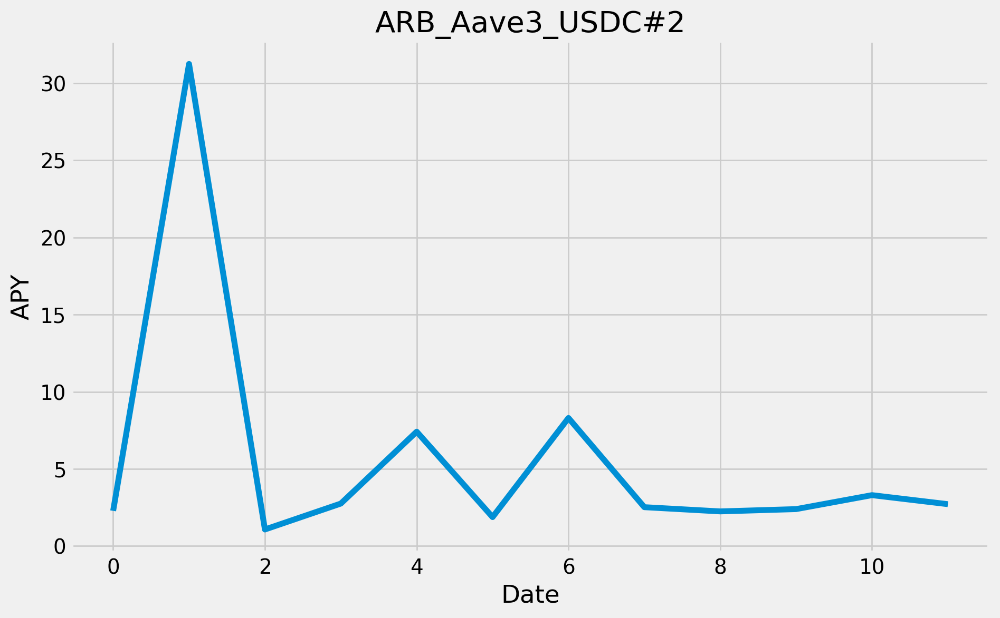

In [1735]:
# Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(ARB_Aave3_USDC_2['apy'])

# Customize the chart
plt.title('ARB_Aave3_USDC#2')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show()

In [1736]:
#ARB_Aave_DAI
is_true = ((df.project == 'aave-v3') &
          (df.exposure == 'single')&
           df.symbol.isin(['DAI']) &
           df.chain.isin(['Arbitrum']))
cols = ['chain', 'project', 'symbol', 'pool', 'tvlUsd', 'apyBase', 'apy', 'apyPct7D', 'apyPct30D', 'apyBase7d', 'apyMean30d', 'volumeUsd7d',
        'mu', 'sigma']
df.loc[is_true, cols].sort_values('apy', ascending=False)


,chain,project,symbol,pool,tvlUsd,apyBase,apy,apyPct7D,apyPct30D,apyBase7d,apyMean30d,volumeUsd7d,mu,sigma
962,Arbitrum,aave-v3,DAI,a8e3d841-2788-4647-ad54-5a36fac451b1,3234529,1.6823,1.68227%,-0.4102,0.1616,NaN,1.8124,NaN,1.2724,0.0432


In [1737]:
#get historical data
ARB_Aave_DAI=obj.get_pool_hist_apy('a8e3d841-2788-4647-ad54-5a36fac451b1')
ARB_Aave_DAI.reset_index(inplace=True)
ARB_Aave_DAI['date'] = pd.to_datetime(ARB_Aave_DAI['date']).dt.strftime('%Y-%m-%d')
ARB_Aave_DAI.to_excel(writer, sheet_name='ARB_Aave_DAI', index=False)

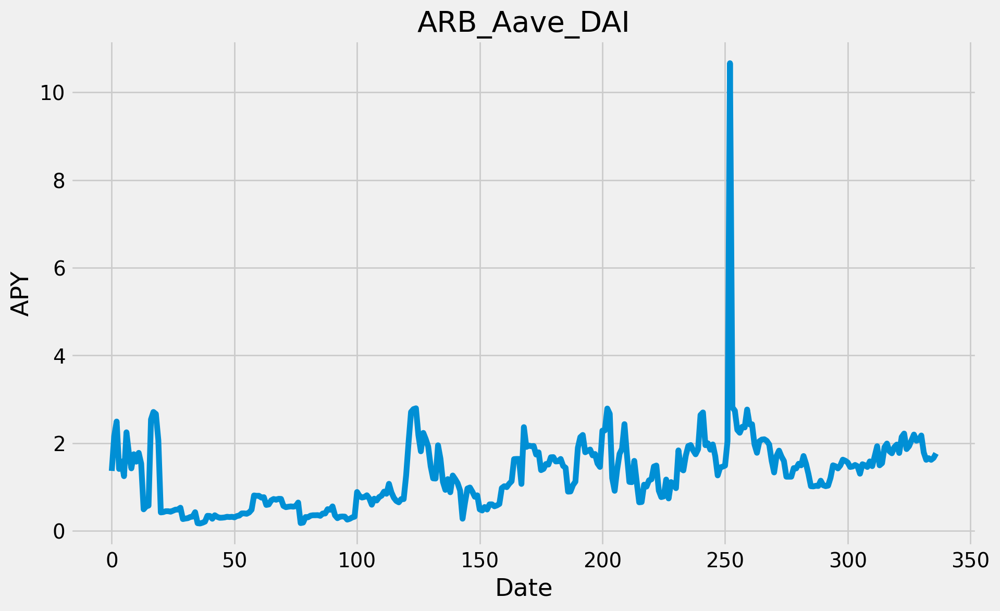

In [1738]:
# Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(ARB_Aave_DAI['apy'])

# Customize the chart
plt.title('ARB_Aave_DAI')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show()

In [1739]:
#ARB_Aave_USDT
is_true = ((df.project == 'aave-v3') &
          (df.exposure == 'single')&
           df.symbol.isin(['USDT']) &
           df.chain.isin(['Arbitrum']))
cols = ['chain', 'project', 'symbol', 'pool', 'tvlUsd', 'apyBase', 'apy', 'apyPct7D', 'apyPct30D', 'apyBase7d', 'apyMean30d', 'volumeUsd7d',
        'mu', 'sigma']
df.loc[is_true, cols].sort_values('apy', ascending=False)

,chain,project,symbol,pool,tvlUsd,apyBase,apy,apyPct7D,apyPct30D,apyBase7d,apyMean30d,volumeUsd7d,mu,sigma
819,Arbitrum,aave-v3,USDT,3a6cc030-738d-4e19-8a40-e63e9c4d5a6f,4013872,2.6093,2.60926%,-0.2649,-0.5319,NaN,3.3291,NaN,2.7047,0.1423


In [1740]:
#get historical data
ARB_Aave_USDT=obj.get_pool_hist_apy('3a6cc030-738d-4e19-8a40-e63e9c4d5a6f')
ARB_Aave_USDT.reset_index(inplace=True)
ARB_Aave_USDT['date'] = pd.to_datetime(ARB_Aave_USDT['date']).dt.strftime('%Y-%m-%d')
ARB_Aave_USDT.to_excel(writer, sheet_name='ARB_Aave_USDT', index=False)

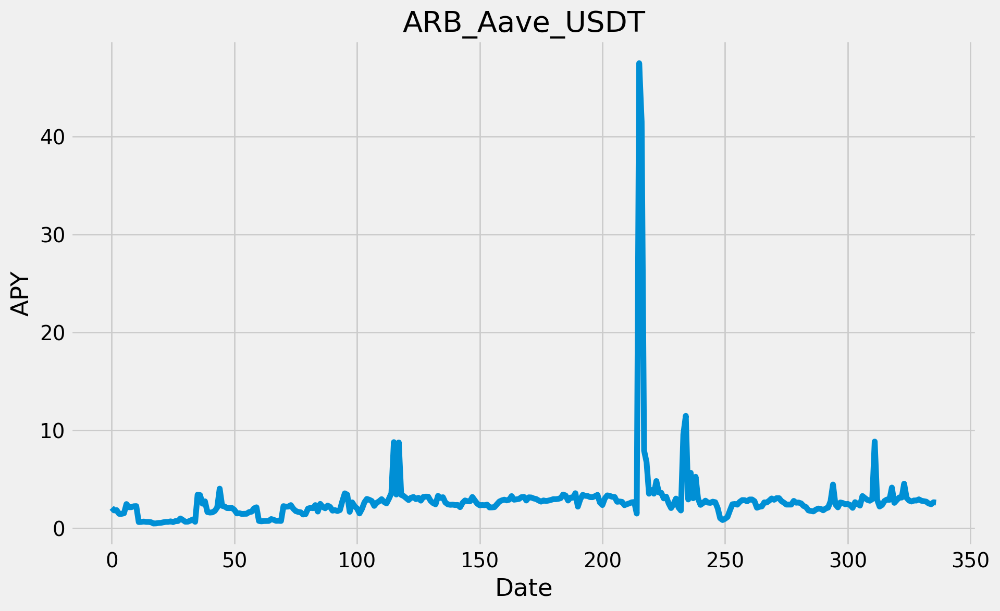

In [1741]:
# Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(ARB_Aave_USDT['apy'])

# Customize the chart
plt.title('ARB_Aave_USDT')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show()

In [1742]:
#ARB_Radiant_USDC
is_true = ((df.project == 'radiant-v2') &
           df.symbol.isin(['USDC']) &
           df.chain.isin(['Arbitrum']))
cols = ['chain', 'project', 'symbol', 'pool', 'tvlUsd', 'apyBase', 'apy', 'apyPct7D', 'apyPct30D', 'apyBase7d', 'apyMean30d', 'volumeUsd7d',
        'mu', 'sigma']
df.loc[is_true, cols].sort_values('apy', ascending=False)

,chain,project,symbol,pool,tvlUsd,apyBase,apy,apyPct7D,apyPct30D,apyBase7d,apyMean30d,volumeUsd7d,mu,sigma
174,Arbitrum,radiant-v2,USDC,777f1c71-a9a4-4559-9768-ce932d3bc02c,39317773,2.1021,2.10214%,-0.1457,NaN,NaN,2.1227,NaN,2.0958,0.0185


In [1743]:
#get historical data
ARB_Radiant_USDC=obj.get_pool_hist_apy('777f1c71-a9a4-4559-9768-ce932d3bc02c')
ARB_Radiant_USDC.reset_index(inplace=True)
ARB_Radiant_USDC['date'] = pd.to_datetime(ARB_Radiant_USDC['date']).dt.strftime('%Y-%m-%d')
ARB_Radiant_USDC.to_excel(writer, sheet_name='ARB_Radiant_USDC', index=False)

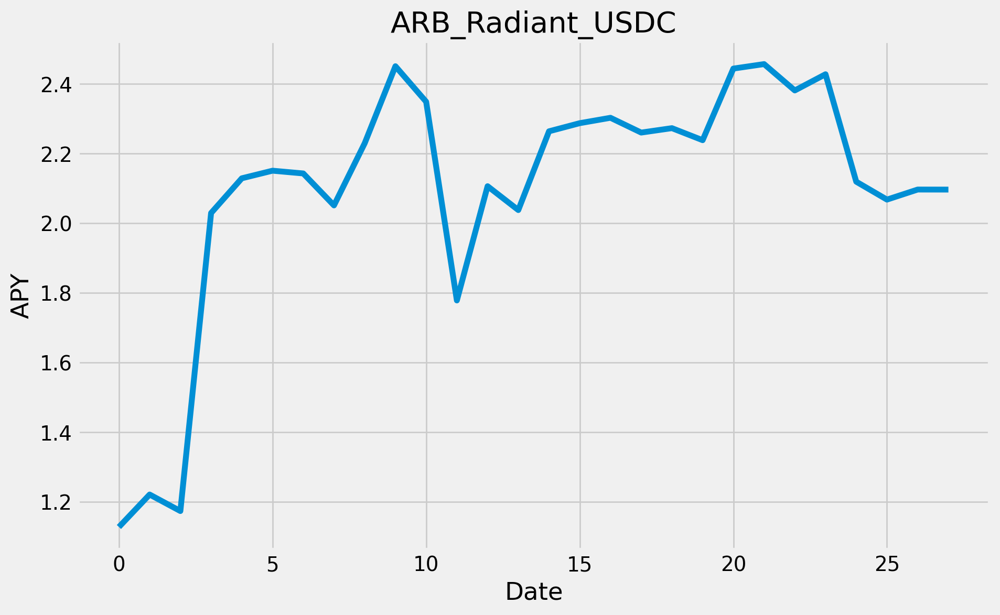

In [1744]:
# Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(ARB_Radiant_USDC['apy'])

# Customize the chart
plt.title('ARB_Radiant_USDC')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show()

In [1745]:
#ARB_Radiant_DAI
is_true = ((df.project == 'radiant-v2') &
           df.symbol.isin(['DAI']) &
           df.chain.isin(['Arbitrum']))
cols = ['chain', 'project', 'symbol', 'pool', 'tvlUsd', 'apyBase', 'apy', 'apyPct7D', 'apyPct30D', 'apyBase7d', 'apyMean30d', 'volumeUsd7d',
        'mu', 'sigma']
df.loc[is_true, cols].sort_values('apy', ascending=False)

,chain,project,symbol,pool,tvlUsd,apyBase,apy,apyPct7D,apyPct30D,apyBase7d,apyMean30d,volumeUsd7d,mu,sigma
762,Arbitrum,radiant-v2,DAI,6739fa8b-2d56-45d5-9278-6fe19e314af7,4493922,2.3064,2.30643%,0.0971,NaN,NaN,2.0309,NaN,2.0541,0.0221


In [1746]:
#get historical data
ARB_Radiant_DAI=obj.get_pool_hist_apy('6739fa8b-2d56-45d5-9278-6fe19e314af7')
ARB_Radiant_DAI.reset_index(inplace=True)
ARB_Radiant_DAI['date'] = pd.to_datetime(ARB_Radiant_DAI['date']).dt.strftime('%Y-%m-%d')
ARB_Radiant_DAI.to_excel(writer, sheet_name='ARB_Radiant_DAI', index=False)

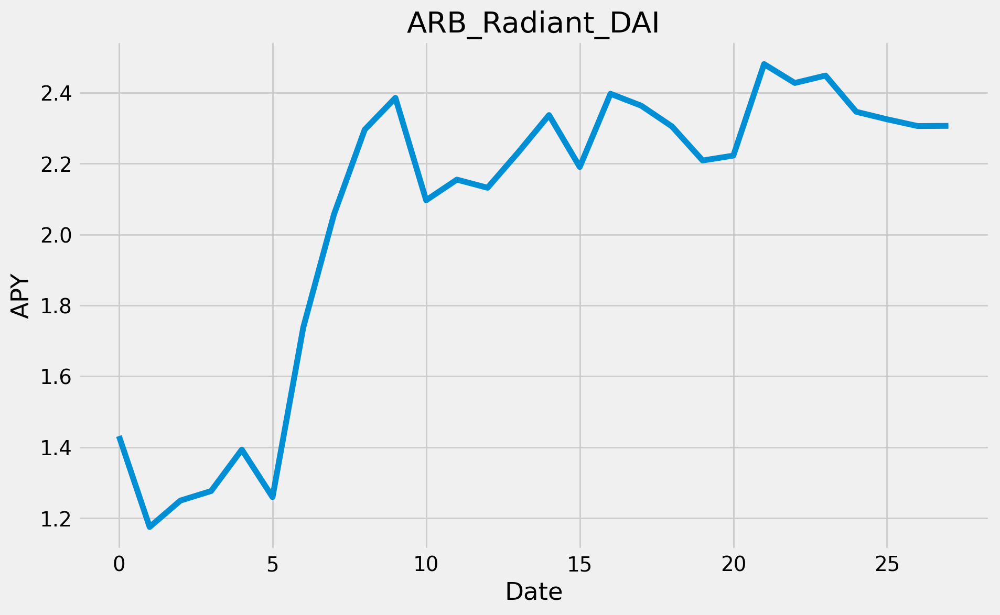

In [1747]:
# Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(ARB_Radiant_DAI['apy'])

# Customize the chart
plt.title('ARB_Radiant_DAI')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show()

In [1748]:
#ARB_Radiant_USDT
is_true = ((df.project == 'radiant-v2') &
           df.symbol.isin(['USDT']) &
           df.chain.isin(['Arbitrum']))
cols = ['chain', 'project', 'symbol', 'pool', 'tvlUsd', 'apyBase', 'apy', 'apyPct7D', 'apyPct30D', 'apyBase7d', 'apyMean30d', 'volumeUsd7d',
        'mu', 'sigma']
df.loc[is_true, cols].sort_values('apy', ascending=False)

,chain,project,symbol,pool,tvlUsd,apyBase,apy,apyPct7D,apyPct30D,apyBase7d,apyMean30d,volumeUsd7d,mu,sigma
435,Arbitrum,radiant-v2,USDT,f7baa2ca-b904-4c7c-a0ee-beba2540d15b,10010263,2.0453,2.0453%,-0.5667,NaN,NaN,2.1383,NaN,2.1522,0.0226


In [1749]:
#get historical data
ARB_Radiant_USDT=obj.get_pool_hist_apy('f7baa2ca-b904-4c7c-a0ee-beba2540d15b')
ARB_Radiant_USDT.reset_index(inplace=True)
ARB_Radiant_USDT['date'] = pd.to_datetime(ARB_Radiant_USDT['date']).dt.strftime('%Y-%m-%d')
ARB_Radiant_USDT.to_excel(writer, sheet_name='ARB_Radiant_USDT', index=False)

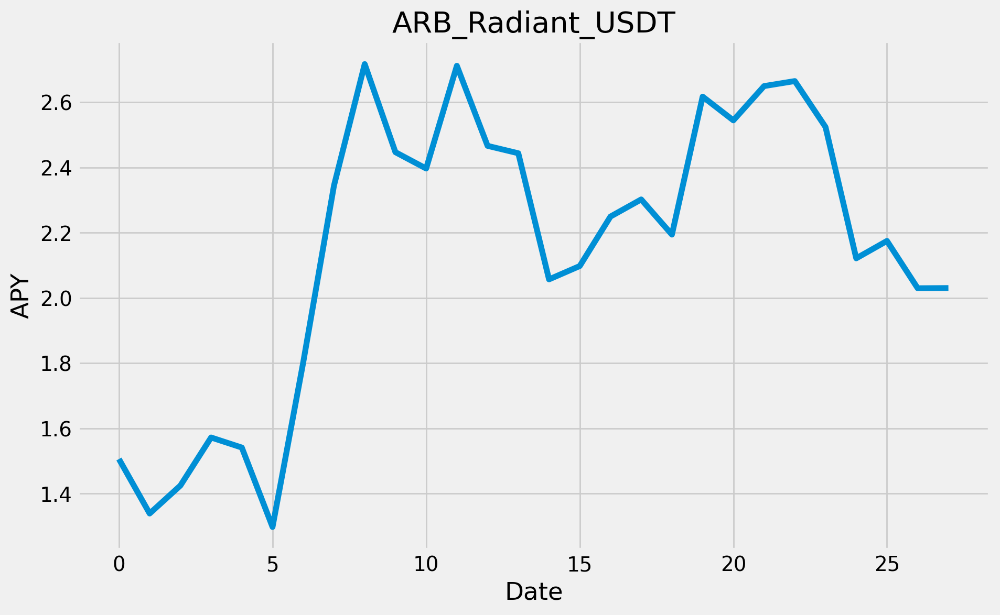

In [1750]:
# Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(ARB_Radiant_USDT['apy'])

# Customize the chart
plt.title('ARB_Radiant_USDT')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show()

In [1751]:
#Opt_Aave_USDC
is_true = ((df.project == 'aave-v3') &
          (df.exposure == 'single')&
           df.symbol.isin(['USDC']) &
           df.chain.isin(['Optimism']))
cols = ['chain', 'project', 'symbol', 'pool', 'tvlUsd', 'apyBase', 'apy', 'apyPct7D', 'apyPct30D', 'apyBase7d', 'apyMean30d', 'volumeUsd7d',
        'mu', 'sigma']
df.loc[is_true, cols].sort_values('apy', ascending=False)

,chain,project,symbol,pool,tvlUsd,apyBase,apy,apyPct7D,apyPct30D,apyBase7d,apyMean30d,volumeUsd7d,mu,sigma
391,Optimism,aave-v3,USDC,24762515-822a-46af-927c-77a1dc449bd0,11880292,1.3523,1.35228%,-1.2384,-0.7485,NaN,2.2679,NaN,1.4416,0.0601


In [1752]:
#get historical data
Opt_Aave_USDC=obj.get_pool_hist_apy('24762515-822a-46af-927c-77a1dc449bd0')
Opt_Aave_USDC.reset_index(inplace=True)
Opt_Aave_USDC['date'] = pd.to_datetime(Opt_Aave_USDC['date']).dt.strftime('%Y-%m-%d')
Opt_Aave_USDC.to_excel(writer, sheet_name='Opt_Aave_USDC', index=False)

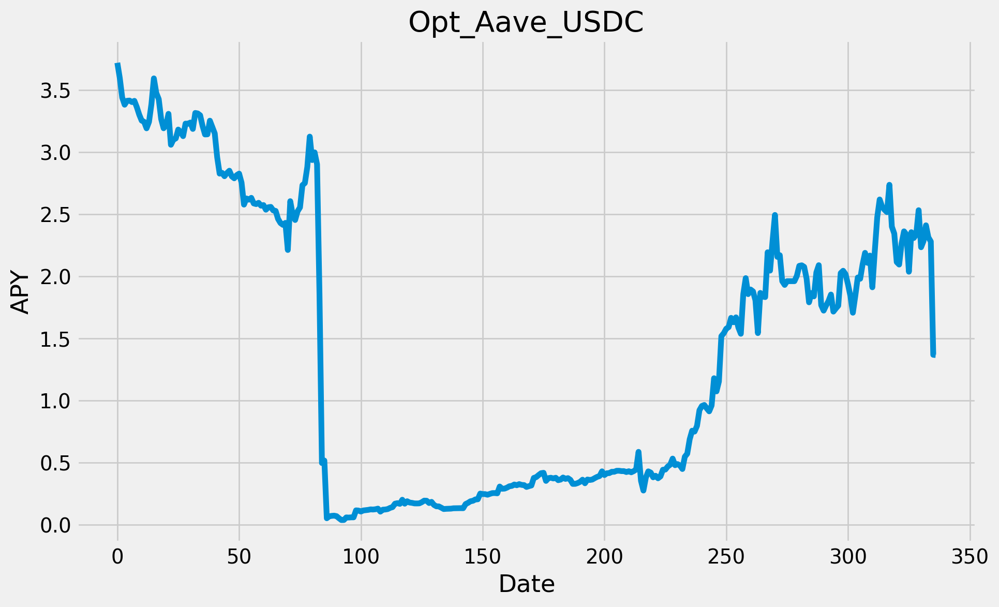

In [1753]:
# Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(Opt_Aave_USDC['apy'])

# Customize the chart
plt.title('Opt_Aave_USDC')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show()

In [1754]:
#Opt_Aave_DAI
is_true = ((df.project == 'aave-v3') &
          (df.exposure == 'single')&
           df.symbol.isin(['DAI']) &
           df.chain.isin(['Optimism']))
cols = ['chain', 'project', 'symbol', 'pool', 'tvlUsd', 'apyBase', 'apy', 'apyPct7D', 'apyPct30D', 'apyBase7d', 'apyMean30d', 'volumeUsd7d',
        'mu', 'sigma']
df.loc[is_true, cols].sort_values('apy', ascending=False)

,chain,project,symbol,pool,tvlUsd,apyBase,apy,apyPct7D,apyPct30D,apyBase7d,apyMean30d,volumeUsd7d,mu,sigma
1359,Optimism,aave-v3,DAI,363e5586-cfee-402c-9b0b-be70366052e8,1929463,1.6993,1.69928%,-0.7363,0.4210,NaN,1.8292,NaN,1.5707,0.0672


In [1755]:
#get historical data
Opt_Aave_DAI=obj.get_pool_hist_apy('363e5586-cfee-402c-9b0b-be70366052e8')
Opt_Aave_DAI.reset_index(inplace=True)
Opt_Aave_DAI['date'] = pd.to_datetime(Opt_Aave_DAI['date']).dt.strftime('%Y-%m-%d')
Opt_Aave_DAI.to_excel(writer, sheet_name='Opt_Aave_DAI', index=False)

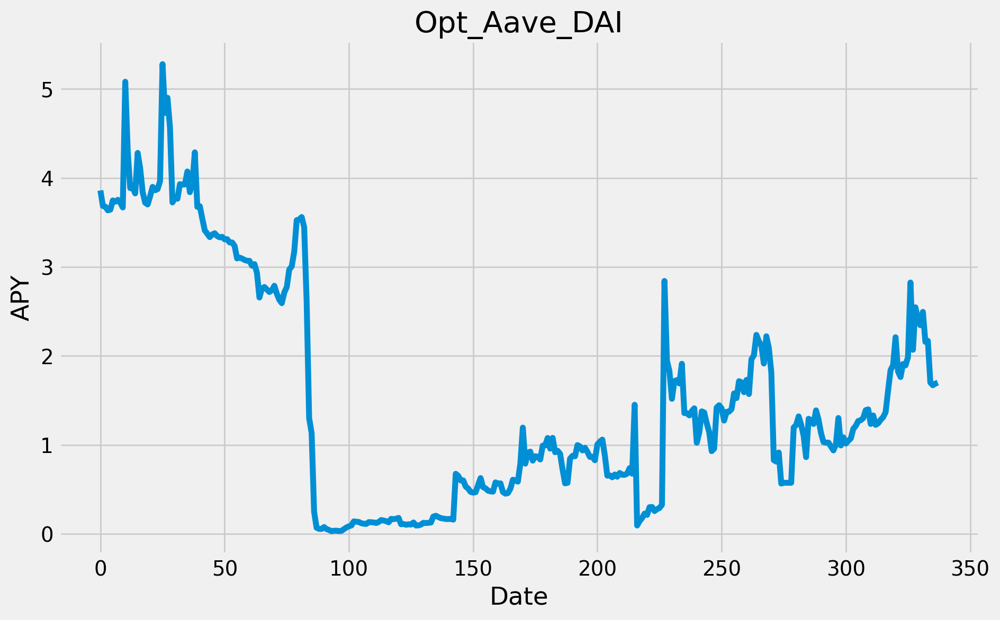

In [1756]:
# Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(Opt_Aave_DAI['apy'])

# Customize the chart
plt.title('Opt_Aave_DAI')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show()

In [1757]:
#Opt_Aave_USDT
is_true = ((df.project == 'aave-v3') &
          (df.exposure == 'single')&
           df.symbol.isin(['USDT']) &
           df.chain.isin(['Optimism']))
cols = ['chain', 'project', 'symbol', 'pool', 'tvlUsd', 'apyBase', 'apy', 'apyPct7D', 'apyPct30D', 'apyBase7d', 'apyMean30d', 'volumeUsd7d',
        'mu', 'sigma']
df.loc[is_true, cols].sort_values('apy', ascending=False)

,chain,project,symbol,pool,tvlUsd,apyBase,apy,apyPct7D,apyPct30D,apyBase7d,apyMean30d,volumeUsd7d,mu,sigma
1141,Optimism,aave-v3,USDT,bde08c85-41c5-4d80-9bb1-0835a4352efa,2530965,1.9376,1.93756%,-0.5562,-0.4817,NaN,2.7409,NaN,3.5486,0.1795


In [1758]:
#get historical data
Opt_Aave_USDT=obj.get_pool_hist_apy('bde08c85-41c5-4d80-9bb1-0835a4352efa')
Opt_Aave_USDT.reset_index(inplace=True)
Opt_Aave_USDT['date'] = pd.to_datetime(Opt_Aave_USDT['date']).dt.strftime('%Y-%m-%d')
Opt_Aave_USDT.to_excel(writer, sheet_name='Opt_Aave_USDT', index=False)

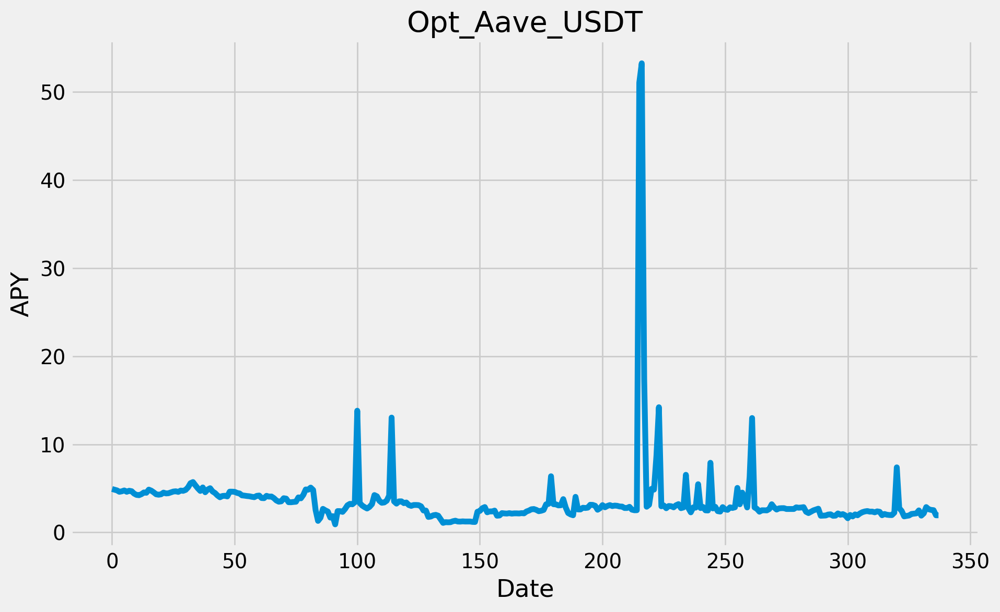

In [1759]:
# Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(Opt_Aave_USDT['apy'])

# Customize the chart
plt.title('Opt_Aave_USDT')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show()

In [1760]:
#Opt_Sonne_USDC
is_true = ((df.project == 'sonne-finance') &
           df.symbol.isin(['USDC']) &
           df.chain.isin(['Optimism']))
cols = ['chain', 'project', 'symbol', 'pool', 'tvlUsd', 'apyBase', 'apy', 'apyPct7D', 'apyPct30D', 'apyBase7d', 'apyMean30d', 'volumeUsd7d',
        'mu', 'sigma']
df.loc[is_true, cols].sort_values('apy', ascending=False)

,chain,project,symbol,pool,tvlUsd,apyBase,apy,apyPct7D,apyPct30D,apyBase7d,apyMean30d,volumeUsd7d,mu,sigma
772,Optimism,sonne-finance,USDC,c34ed51f-3a16-4124-9501-94b36c1bad9d,4430652,4.7249,4.97053%,1.0556,1.1686,NaN,4.3568,NaN,3.9501,0.0528


In [1761]:
#get historical data
Opt_Sonne_USDC=obj.get_pool_hist_apy('c34ed51f-3a16-4124-9501-94b36c1bad9d')
Opt_Sonne_USDC.reset_index(inplace=True)
Opt_Sonne_USDC['date'] = pd.to_datetime(Opt_Sonne_USDC['date']).dt.strftime('%Y-%m-%d')
Opt_Sonne_USDC.to_excel(writer, sheet_name='Opt_Sonne_USDC', index=False)

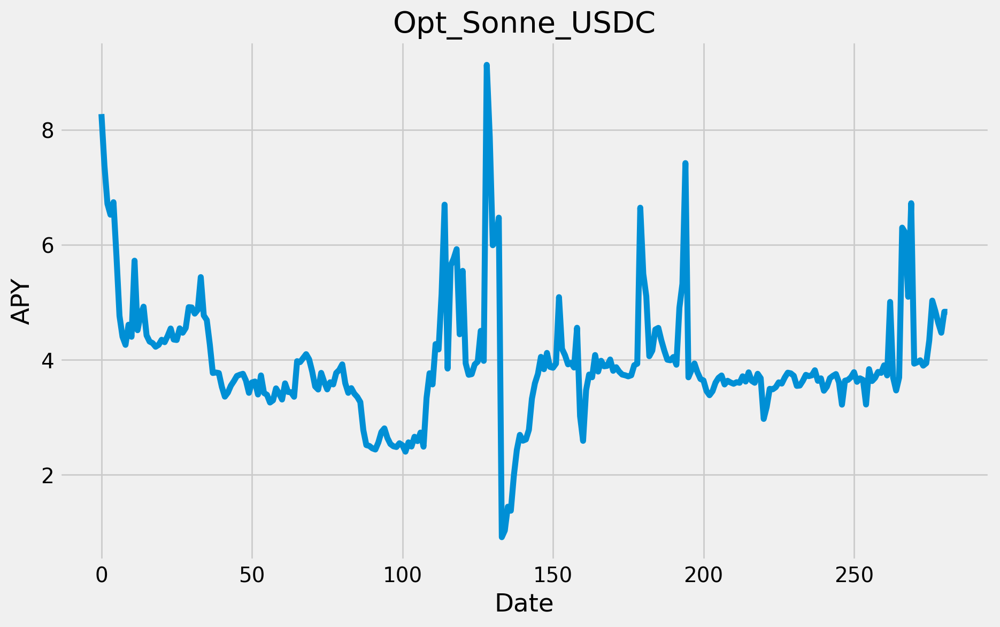

In [1762]:
# Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(Opt_Sonne_USDC['apy'])

# Customize the chart
plt.title('Opt_Sonne_USDC')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show()

In [1763]:
#Opt_Sonne_DAI
is_true = ((df.project == 'sonne-finance') &
           df.symbol.isin(['DAI']) &
           df.chain.isin(['Optimism']))
cols = ['chain', 'project', 'symbol', 'pool', 'tvlUsd', 'apyBase', 'apy', 'apyPct7D', 'apyPct30D', 'apyBase7d', 'apyMean30d', 'volumeUsd7d',
        'mu', 'sigma']
df.loc[is_true, cols].sort_values('apy', ascending=False)

,chain,project,symbol,pool,tvlUsd,apyBase,apy,apyPct7D,apyPct30D,apyBase7d,apyMean30d,volumeUsd7d,mu,sigma
748,Optimism,sonne-finance,DAI,4e2bef65-8fcc-4b7a-a48e-db16770981a1,4603850,3.8748,4.12091%,-0.1862,0.3584,NaN,4.3159,NaN,4.7874,0.0755


In [1764]:
#get historical data
Opt_Sonne_DAI=obj.get_pool_hist_apy('4e2bef65-8fcc-4b7a-a48e-db16770981a1')
Opt_Sonne_DAI.reset_index(inplace=True)
Opt_Sonne_DAI['date'] = pd.to_datetime(Opt_Sonne_DAI['date']).dt.strftime('%Y-%m-%d')
Opt_Sonne_DAI.to_excel(writer, sheet_name='Opt_Sonne_DAI', index=False)

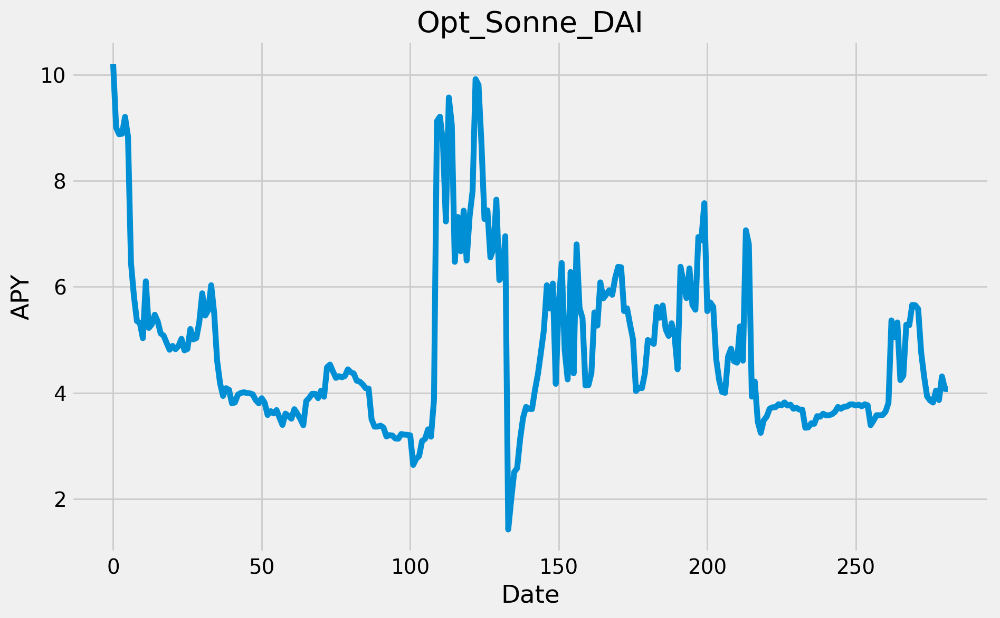

In [1765]:
# Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(Opt_Sonne_DAI['apy'])

# Customize the chart
plt.title('Opt_Sonne_DAI')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show()

In [1766]:
#Opt_Sonne_USDT
is_true = ((df.project == 'sonne-finance') &
           df.symbol.isin(['USDT']) &
           df.chain.isin(['Optimism']))
cols = ['chain', 'project', 'symbol', 'pool', 'tvlUsd', 'apyBase', 'apy', 'apyPct7D', 'apyPct30D', 'apyBase7d', 'apyMean30d', 'volumeUsd7d',
        'mu', 'sigma']
df.loc[is_true, cols].sort_values('apy', ascending=False)

,chain,project,symbol,pool,tvlUsd,apyBase,apy,apyPct7D,apyPct30D,apyBase7d,apyMean30d,volumeUsd7d,mu,sigma
992,Optimism,sonne-finance,USDT,0196f69f-f690-41c4-aa09-1001ef2f3145,3129452,4.6947,5.04305%,-0.4293,1.2331,NaN,5.1437,NaN,5.0846,0.1319


In [1767]:
#get historical data
Opt_Sonne_USDT=obj.get_pool_hist_apy('0196f69f-f690-41c4-aa09-1001ef2f3145')
Opt_Sonne_USDT.reset_index(inplace=True)
Opt_Sonne_USDT['date'] = pd.to_datetime(Opt_Sonne_USDT['date']).dt.strftime('%Y-%m-%d')
Opt_Sonne_USDT.to_excel(writer, sheet_name='Opt_Sonne_USDT', index=False)

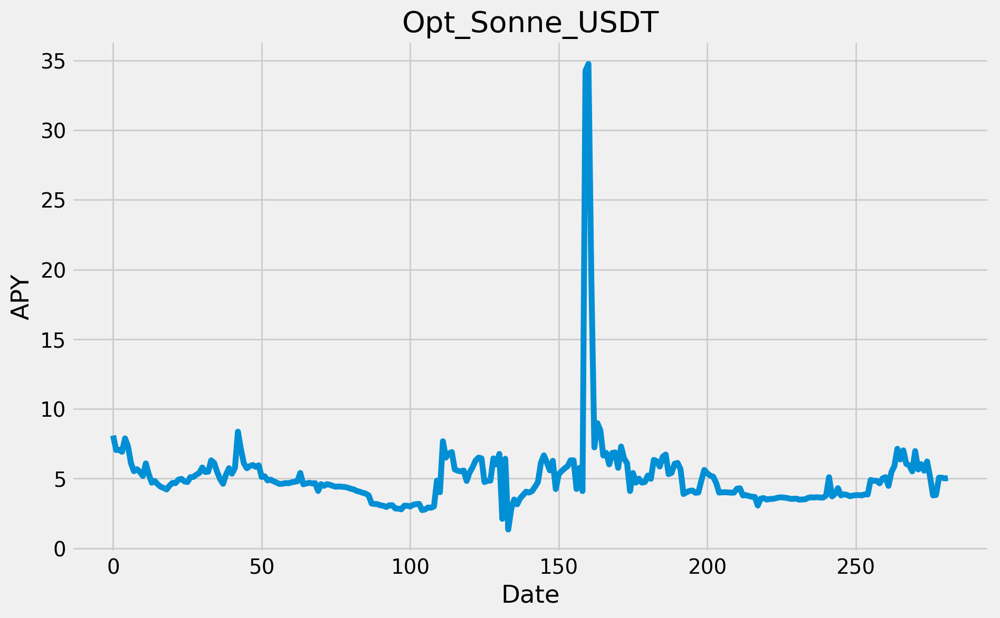

In [1768]:
# Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(Opt_Sonne_USDT['apy'])

# Customize the chart
plt.title('Opt_Sonne_USDT')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show()

## $ LP Rates

In [1769]:
#LP_Curve_crvUSD/USDC
is_true = ((df.project == 'curve-dex') &
           df.symbol.isin(['USDC-CRVUSD']))
cols = ['chain', 'project', 'symbol', 'pool', 'tvlUsd', 'apyBase', 'apy', 'apyPct7D', 'apyPct30D', 'apyBase7d', 'apyMean30d', 'volumeUsd7d',
        'mu', 'sigma']
df.loc[is_true, cols].sort_values('apy', ascending=False)


,chain,project,symbol,pool,tvlUsd,apyBase,apy,apyPct7D,apyPct30D,apyBase7d,apyMean30d,volumeUsd7d,mu,sigma
111,Ethereum,curve-dex,USDC-CRVUSD,5faf730e-2c79-45a2-9459-fbcd185abf18,61413286,0.8556,5.09592%,-1.3389,NaN,NaN,6.2795,NaN,6.0774,0.0715


In [1770]:
#get historical data
LP_Curve_crvUSD_USDC=obj.get_pool_hist_apy('5faf730e-2c79-45a2-9459-fbcd185abf18')
LP_Curve_crvUSD_USDC.reset_index(inplace=True)
LP_Curve_crvUSD_USDC['date'] = pd.to_datetime(LP_Curve_crvUSD_USDC['date']).dt.strftime('%Y-%m-%d')
LP_Curve_crvUSD_USDC.to_excel(writer, sheet_name='LP_Curve_crvUSD_USDC', index=False)

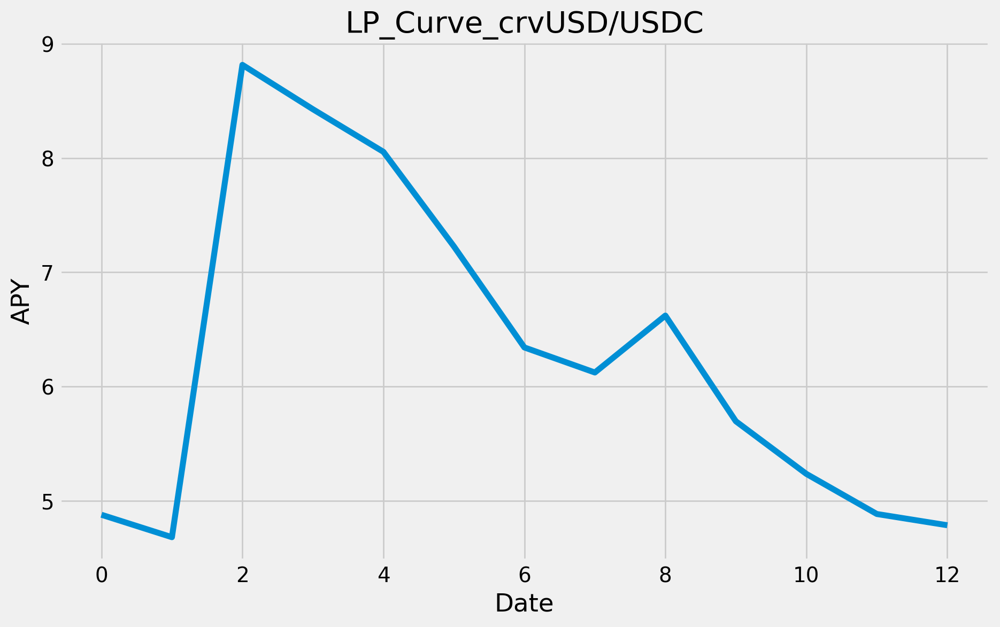

In [1771]:
# Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(LP_Curve_crvUSD_USDC['apy'])

# Customize the chart
plt.title('LP_Curve_crvUSD/USDC')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show()

In [1772]:
#LP_Curve_crvUSD/USDT
is_true = ((df.project == 'curve-dex') &
           df.symbol.isin(['USDT-CRVUSD']))
cols = ['chain', 'project', 'symbol', 'pool', 'tvlUsd', 'apyBase', 'apy', 'apyPct7D', 'apyPct30D', 'apyBase7d', 'apyMean30d', 'volumeUsd7d',
        'mu', 'sigma']
df.loc[is_true, cols].sort_values('apy', ascending=False)

,chain,project,symbol,pool,tvlUsd,apyBase,apy,apyPct7D,apyPct30D,apyBase7d,apyMean30d,volumeUsd7d,mu,sigma
165,Ethereum,curve-dex,USDT-CRVUSD,90a3e412-e3be-47e1-a233-fd3760f4a794,44821067,0.4429,4.6401%,-1.1812,NaN,NaN,5.5948,NaN,5.4922,0.0388


In [1773]:
#get historical data
LP_Curve_crvUSD_USDT=obj.get_pool_hist_apy('90a3e412-e3be-47e1-a233-fd3760f4a794')
LP_Curve_crvUSD_USDT.reset_index(inplace=True)
LP_Curve_crvUSD_USDT['date'] = pd.to_datetime(LP_Curve_crvUSD_USDT['date']).dt.strftime('%Y-%m-%d')
LP_Curve_crvUSD_USDT.to_excel(writer, sheet_name='LP_Curve_crvUSD_USDT', index=False)

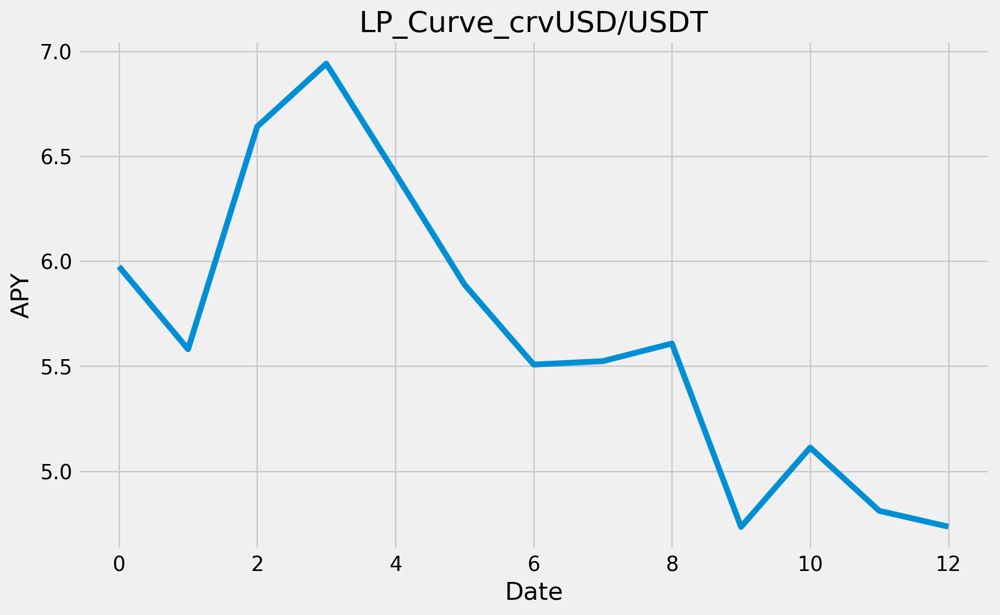

In [1774]:
# Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(LP_Curve_crvUSD_USDT['apy'])

# Customize the chart
plt.title('LP_Curve_crvUSD/USDT')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show()

In [1775]:
#LP_Curve_crvUSD/Frax
is_true = ((df.project == 'curve-dex') &
           df.symbol.isin(['FRAX-CRVUSD']))
cols = ['chain', 'project', 'symbol', 'pool', 'tvlUsd', 'apyBase', 'apy', 'apyPct7D', 'apyPct30D', 'apyBase7d', 'apyMean30d', 'volumeUsd7d',
        'mu', 'sigma']
df.loc[is_true, cols].sort_values('apy', ascending=False)

,chain,project,symbol,pool,tvlUsd,apyBase,apy,apyPct7D,apyPct30D,apyBase7d,apyMean30d,volumeUsd7d,mu,sigma
280,Ethereum,curve-dex,FRAX-CRVUSD,849e0897-1d5c-4cbb-afc9-289e0659e483,20193762,0.1906,2.13912%,-1.3577,NaN,NaN,3.2015,NaN,3.1048,0.0612


In [1776]:
#get historical data
LP_Curve_crvUSD_Frax=obj.get_pool_hist_apy('849e0897-1d5c-4cbb-afc9-289e0659e483')
LP_Curve_crvUSD_Frax.reset_index(inplace=True)
LP_Curve_crvUSD_Frax['date'] = pd.to_datetime(LP_Curve_crvUSD_Frax['date']).dt.strftime('%Y-%m-%d')
LP_Curve_crvUSD_Frax.to_excel(writer, sheet_name='LP_Curve_crvUSD_Frax', index=False)

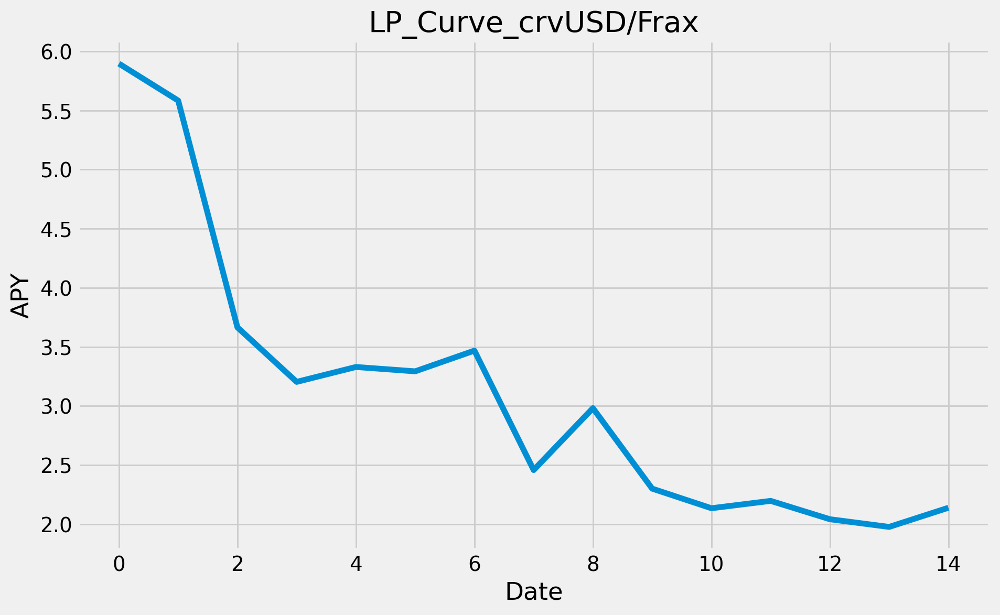

In [1777]:
# Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(LP_Curve_crvUSD_Frax['apy'])

# Customize the chart
plt.title('LP_Curve_crvUSD/Frax')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show()

In [1778]:
## Mainnet_UniswapV3_DAI/USDC_0.01%
is_true = ((df.project == 'uniswap-v3') &
           df.symbol.isin(['DAI-USDC']) &
           df.chain.isin(['Ethereum']))
cols = ['chain', 'project', 'symbol', 'pool', 'tvlUsd', 'apyBase', 'apy', 'apyPct7D', 'apyPct30D', 'apyBase7d', 'apyMean30d', 'volumeUsd7d',
        'mu', 'sigma']
df.loc[is_true, cols].sort_values('apy', ascending=False)
#df.loc[68,cols]

,chain,project,symbol,pool,tvlUsd,apyBase,apy,apyPct7D,apyPct30D,apyBase7d,apyMean30d,volumeUsd7d,mu,sigma
72,Ethereum,uniswap-v3,DAI-USDC,1193ef25-862b-43c1-a545-91bbb9678d30,106949009,0.2747,0.27469%,-0.4299,-0.2196,0.0564,0.4097,"57,907,936.5413",0.2986,0.0274
108,Ethereum,uniswap-v3,DAI-USDC,26298be5-691a-42e6-817b-07f72e70cd4f,62254434,0.2674,0.26736%,-0.0324,0.0664,0.1512,0.2545,"3,609,419.2712",0.3609,0.0898


In [1779]:
#get historical data
Mainnet_UniswapV3_DAI_USDC_001=obj.get_pool_hist_apy('1193ef25-862b-43c1-a545-91bbb9678d30')
Mainnet_UniswapV3_DAI_USDC_001.reset_index(inplace=True)
Mainnet_UniswapV3_DAI_USDC_001['date'] = pd.to_datetime(Mainnet_UniswapV3_DAI_USDC_001['date']).dt.strftime('%Y-%m-%d')
Mainnet_UniswapV3_DAI_USDC_001.to_excel(writer, sheet_name='Main_UniswapV3_DAI_USDC_0.01%', index=False)

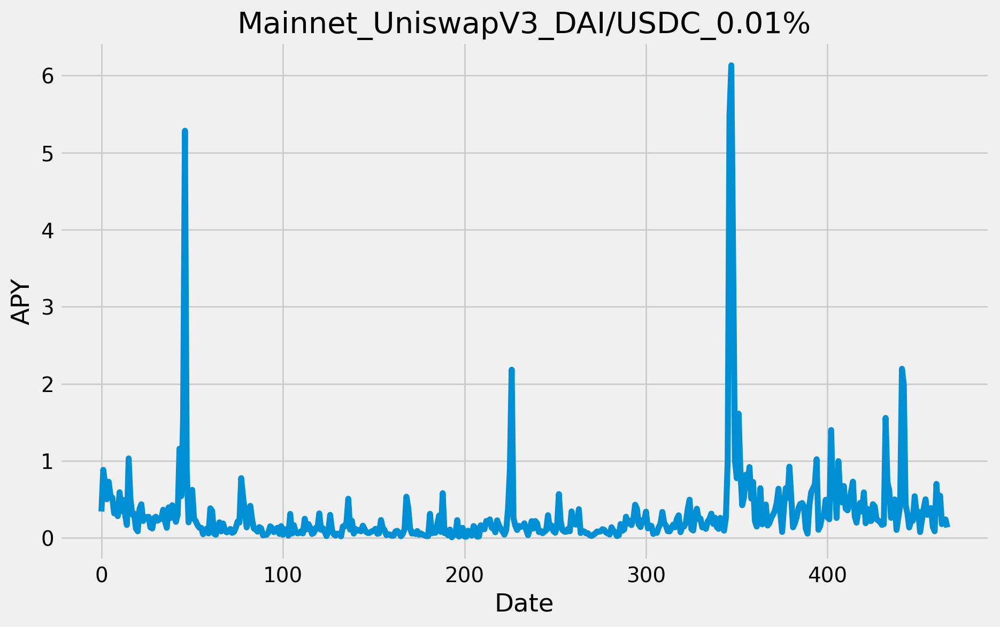

In [1780]:
# Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(Mainnet_UniswapV3_DAI_USDC_001['apy'])

# Customize the chart
plt.title('Mainnet_UniswapV3_DAI/USDC_0.01%')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show()

In [1781]:
## Mainnet_UniswapV3_USDC/USDT_0.01%
is_true = ((df.project == 'uniswap-v3') &
           df.symbol.isin(['USDC-USDT']) &
           df.chain.isin(['Ethereum']))
cols = ['chain', 'project', 'symbol', 'pool', 'tvlUsd', 'apyBase', 'apy', 'apyPct7D', 'apyPct30D', 'apyBase7d', 'apyMean30d', 'volumeUsd7d',
        'mu', 'sigma']
df.loc[is_true, cols].sort_values('apy', ascending=False)
#df.loc[91,cols]

,chain,project,symbol,pool,tvlUsd,apyBase,apy,apyPct7D,apyPct30D,apyBase7d,apyMean30d,volumeUsd7d,mu,sigma
66,Ethereum,uniswap-v3,USDC-USDT,e737d721-f45c-40f0-9793-9f56261862b9,115139514,2.7191,2.71914%,-0.0544,-5.8989,0.6005,3.9815,"352,401,165.9982",4.2372,0.3384
447,Ethereum,uniswap-v3,USDC-USDT,40e2054c-779d-4499-845f-95b4a31277f7,9475233,1.8270,1.82697%,1.3525,-2.6503,0.9266,4.2699,"3,752,565.2356",5.8110,0.9532


In [1782]:
#get historical data
Mainnet_UniswapV3_USDC_USDT_001=obj.get_pool_hist_apy('e737d721-f45c-40f0-9793-9f56261862b9')
Mainnet_UniswapV3_USDC_USDT_001.reset_index(inplace=True)
Mainnet_UniswapV3_USDC_USDT_001['date'] = pd.to_datetime(Mainnet_UniswapV3_USDC_USDT_001['date']).dt.strftime('%Y-%m-%d')
Mainnet_UniswapV3_USDC_USDT_001.to_excel(writer, sheet_name='Main_UniswapV3_USDC_USDT_0.01%', index=False)

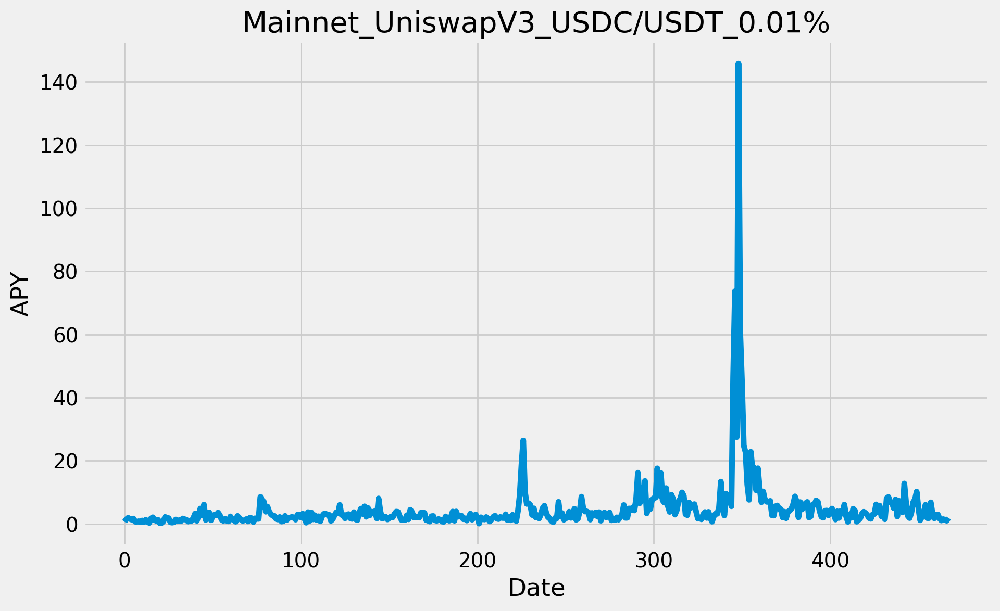

In [1783]:
# Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(Mainnet_UniswapV3_USDC_USDT_001['apy'])

# Customize the chart
plt.title('Mainnet_UniswapV3_USDC/USDT_0.01%')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show()

In [1784]:
## Mainnet_UniswapV2_USDC/DAI
is_true = ((df.project == 'uniswap-v2') &
           df.symbol.isin(['DAI-USDC']) &
           df.chain.isin(['Ethereum']))
cols = ['chain', 'project', 'symbol', 'pool', 'tvlUsd', 'apyBase', 'apy', 'apyPct7D', 'apyPct30D', 'apyBase7d', 'apyMean30d', 'volumeUsd7d',
        'mu', 'sigma']
df.loc[is_true, cols].sort_values('apy', ascending=False)

,chain,project,symbol,pool,tvlUsd,apyBase,apy,apyPct7D,apyPct30D,apyBase7d,apyMean30d,volumeUsd7d,mu,sigma
262,Ethereum,uniswap-v2,DAI-USDC,a86ee795-54d9-4812-9148-b312967cefe5,21706414,0.0431,0.04314%,-0.0047,NaN,0.0556,0.0546,"77,365.9402",0.2421,0.0599


In [1785]:
#get historical data
Mainnet_UniswapV2_USDC_DAI=obj.get_pool_hist_apy('a86ee795-54d9-4812-9148-b312967cefe5')
Mainnet_UniswapV2_USDC_DAI.reset_index(inplace=True)
Mainnet_UniswapV2_USDC_DAI['date'] = pd.to_datetime(Mainnet_UniswapV2_USDC_DAI['date']).dt.strftime('%Y-%m-%d')
Mainnet_UniswapV2_USDC_DAI.to_excel(writer, sheet_name='Main_UniswapV2_USDC_DAI', index=False)

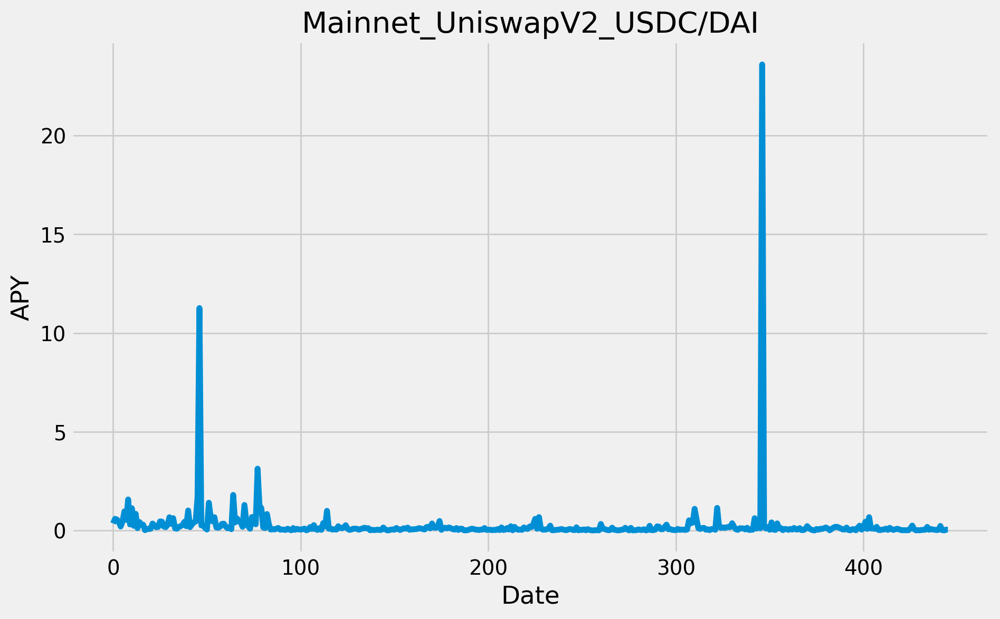

In [1786]:
# Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(Mainnet_UniswapV2_USDC_DAI['apy'])

# Customize the chart
plt.title('Mainnet_UniswapV2_USDC/DAI')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show()

In [1787]:
## Mainnet_UniswapV2_USDC/USDT
is_true = ((df.project == 'uniswap-v2') &
           df.symbol.isin(['USDC-USDT']) &
           df.chain.isin(['Ethereum']))
cols = ['chain', 'project', 'symbol', 'pool', 'tvlUsd', 'apyBase', 'apy', 'apyPct7D', 'apyPct30D', 'apyBase7d', 'apyMean30d', 'volumeUsd7d',
        'mu', 'sigma']
df.loc[is_true, cols].sort_values('apy', ascending=False)

,chain,project,symbol,pool,tvlUsd,apyBase,apy,apyPct7D,apyPct30D,apyBase7d,apyMean30d,volumeUsd7d,mu,sigma
261,Ethereum,uniswap-v2,USDC-USDT,e2c09021-0aa8-42b6-a596-5422c2e35399,21805369,0.6761,0.67609%,-0.2893,NaN,0.3029,0.3054,"423,406.5236",3.2927,0.4314


In [1788]:
#get historical data
Mainnet_UniswapV2_USDC_USDT=obj.get_pool_hist_apy('e2c09021-0aa8-42b6-a596-5422c2e35399')
Mainnet_UniswapV2_USDC_USDT.reset_index(inplace=True)
Mainnet_UniswapV2_USDC_USDT['date'] = pd.to_datetime(Mainnet_UniswapV2_USDC_USDT['date']).dt.strftime('%Y-%m-%d')
Mainnet_UniswapV2_USDC_USDT.to_excel(writer, sheet_name='Mainnet_UniswapV2_USDC_USDT', index=False)

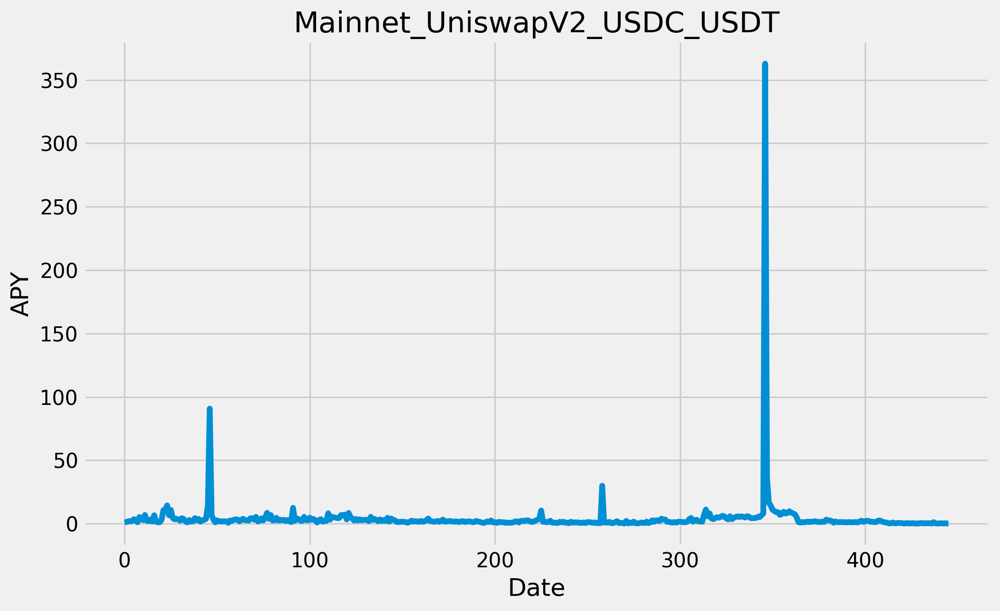

In [1789]:
# Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(Mainnet_UniswapV2_USDC_USDT['apy'])

# Customize the chart
plt.title('Mainnet_UniswapV2_USDC_USDT')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show()

In [1790]:
## ARB_UniswapV3_DAI/USDC_0.01%
is_true = ((df.project == 'uniswap-v3') &
           df.symbol.isin(['DAI-USDC']) &
           df.chain.isin(['Arbitrum']))
cols = ['chain', 'project', 'symbol', 'pool', 'tvlUsd', 'apyBase', 'apy', 'apyPct7D', 'apyPct30D', 'apyBase7d', 'apyMean30d', 'volumeUsd7d',
        'mu', 'sigma']
df.loc[is_true, cols].sort_values('apy', ascending=False)

,chain,project,symbol,pool,tvlUsd,apyBase,apy,apyPct7D,apyPct30D,apyBase7d,apyMean30d,volumeUsd7d,mu,sigma
876,Arbitrum,uniswap-v3,DAI-USDC,44213a47-ba05-4428-866a-f5d08378cbd4,3732403,0.9630,0.963%,0.3026,-1.8050,0.9162,1.7580,"6,576,400.2918",7.0883,0.4996
1706,Arbitrum,uniswap-v3,DAI-USDC,7cf9c463-7ab4-4bd8-a3ee-7bf11668209a,1331877,0.3777,0.37767%,0.3749,-0.0901,0.2367,0.4811,"121,234.6888",2.3356,0.3028


In [1791]:
#get historical data
ARB_UniswapV3_DAI_USDC_001=obj.get_pool_hist_apy('44213a47-ba05-4428-866a-f5d08378cbd4')
ARB_UniswapV3_DAI_USDC_001.reset_index(inplace=True)
ARB_UniswapV3_DAI_USDC_001['date'] = pd.to_datetime(ARB_UniswapV3_DAI_USDC_001['date']).dt.strftime('%Y-%m-%d')
ARB_UniswapV3_DAI_USDC_001.to_excel(writer, sheet_name='ARB_UniswapV3_DAI_USDC_0.01%', index=False)

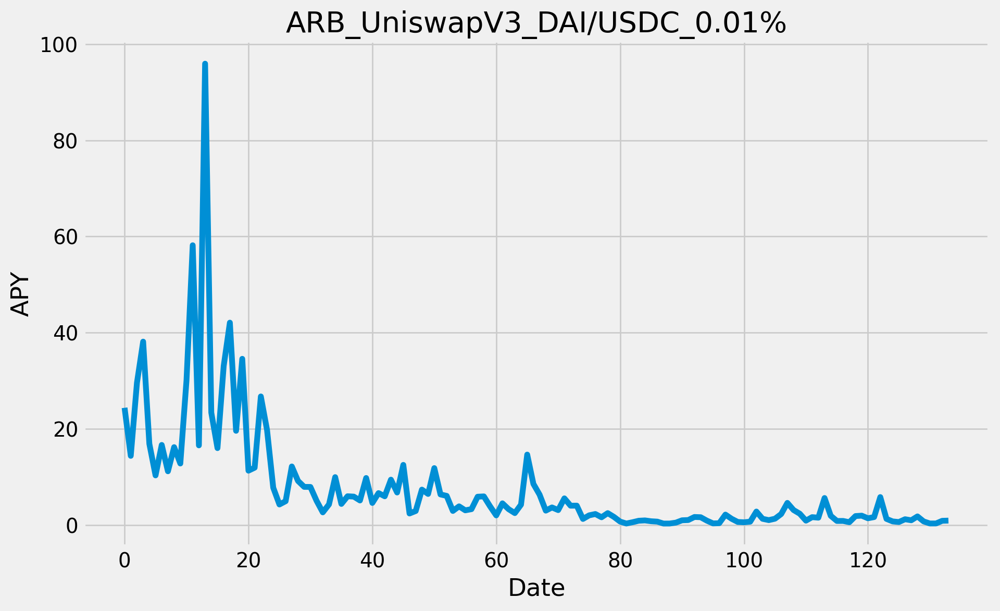

In [1792]:
# Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(ARB_UniswapV3_DAI_USDC_001['apy'])

# Customize the chart
plt.title('ARB_UniswapV3_DAI/USDC_0.01%')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show()

In [1793]:
## ARB_UniswapV3_USDC/USDT_0.01%
is_true = ((df.project == 'uniswap-v3') &
           df.symbol.isin(['USDC-USDT']) &
           df.chain.isin(['Arbitrum']))
cols = ['chain', 'project', 'symbol', 'pool', 'tvlUsd', 'apyBase', 'apy', 'apyPct7D', 'apyPct30D', 'apyBase7d', 'apyMean30d', 'volumeUsd7d',
        'mu', 'sigma']
df.loc[is_true, cols].sort_values('apy', ascending=False)

,chain,project,symbol,pool,tvlUsd,apyBase,apy,apyPct7D,apyPct30D,apyBase7d,apyMean30d,volumeUsd7d,mu,sigma
1396,Arbitrum,uniswap-v3,USDC-USDT,ba3fb5f5-684e-4834-afca-d58668395b02,1834010,4.9865,4.98647%,-0.5987,NaN,4.6809,9.4345,"16,509,158.0057",9.1429,0.4053
10439,Arbitrum,uniswap-v3,USDC-USDT,3f37fb6b-d693-4b7a-8f3e-c92eb92aadb7,17313,2.1586,2.15861%,NaN,NaN,0.3805,0.9735,"2,533.4903",0.5387,0.0558


In [1794]:
#get historical data
ARB_UniswapV3_USDC_USDT_001=obj.get_pool_hist_apy('ba3fb5f5-684e-4834-afca-d58668395b02')
ARB_UniswapV3_USDC_USDT_001.reset_index(inplace=True)
ARB_UniswapV3_USDC_USDT_001['date'] = pd.to_datetime(ARB_UniswapV3_USDC_USDT_001['date']).dt.strftime('%Y-%m-%d')
ARB_UniswapV3_USDC_USDT_001.to_excel(writer, sheet_name='ARB_UniswapV3_USDC_USDT_0.01%', index=False)

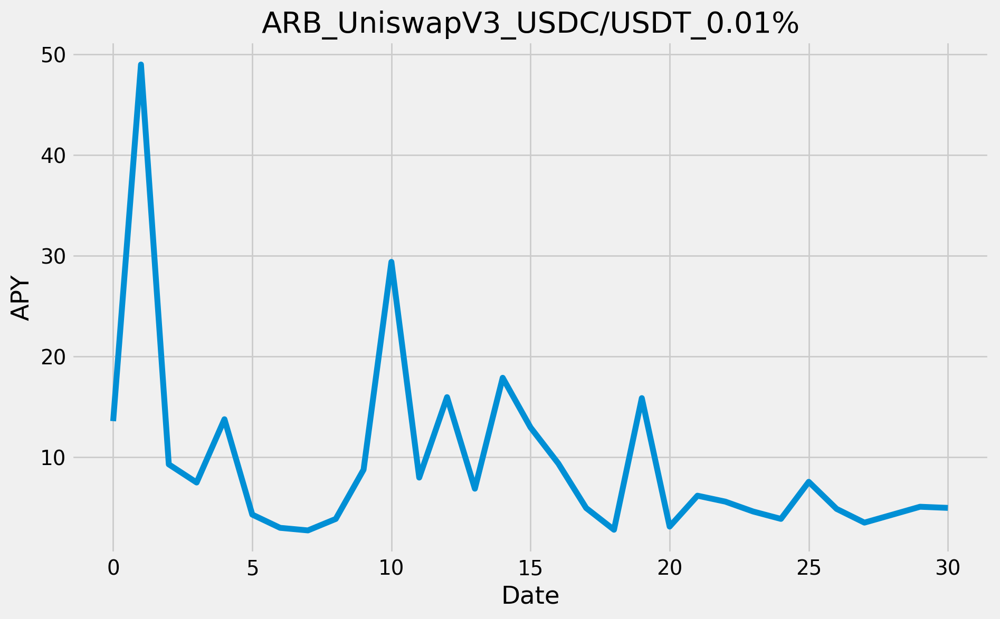

In [1795]:
# Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(ARB_UniswapV3_USDC_USDT_001['apy'])

# Customize the chart
plt.title('ARB_UniswapV3_USDC/USDT_0.01%')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show()

In [1796]:
## ARB_Camelot_USDC/DAI
is_true = ((df.project == 'camelot-v2') &
           df.symbol.isin(['DAI-USDC']) &
           df.chain.isin(['Arbitrum']))
cols = ['chain', 'project', 'symbol', 'pool', 'tvlUsd', 'apyBase', 'apy', 'apyPct7D', 'apyPct30D', 'apyBase7d', 'apyMean30d', 'volumeUsd7d',
        'mu', 'sigma']
df.loc[is_true, cols].sort_values('apy', ascending=False)

,chain,project,symbol,pool,tvlUsd,apyBase,apy,apyPct7D,apyPct30D,apyBase7d,apyMean30d,volumeUsd7d,mu,sigma
2785,Arbitrum,camelot-v2,DAI-USDC,b7398df9-be01-457d-a2c9-38b5dcfbf6e5,569675,0.2452,2.00842%,-0.4111,-1.0954,0.5029,2.1247,"137,726.4284",4.0150,0.3863


In [1797]:
#get historical data
ARB_Camelot_USDC_DAI=obj.get_pool_hist_apy('b7398df9-be01-457d-a2c9-38b5dcfbf6e5')
ARB_Camelot_USDC_DAI.reset_index(inplace=True)
ARB_Camelot_USDC_DAI['date'] = pd.to_datetime(ARB_Camelot_USDC_DAI['date']).dt.strftime('%Y-%m-%d')
ARB_Camelot_USDC_DAI.to_excel(writer, sheet_name='ARB_Camelot_USDC_DAI', index=False)

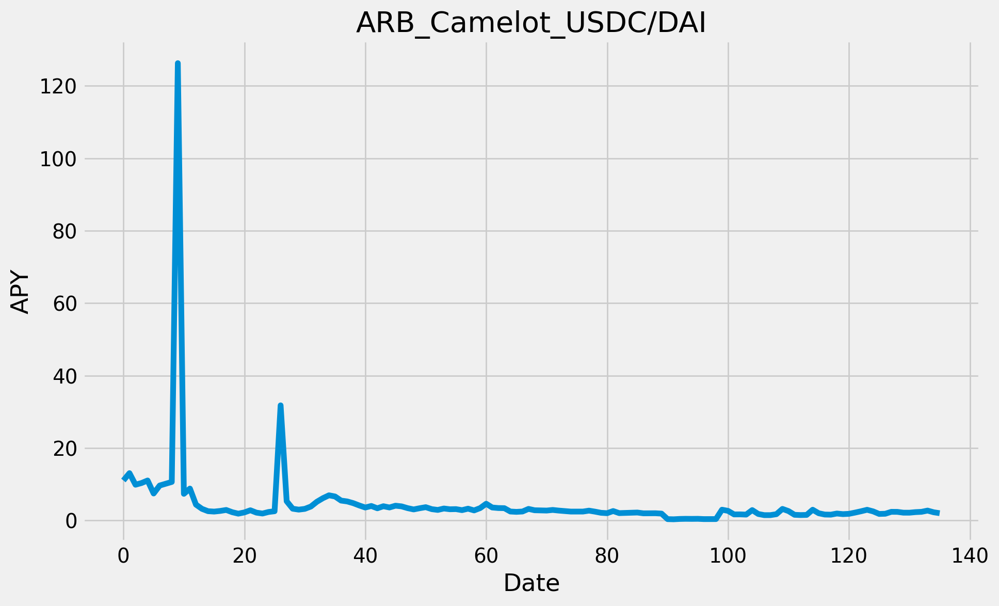

In [1798]:
# Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(ARB_Camelot_USDC_DAI['apy'])

# Customize the chart
plt.title('ARB_Camelot_USDC/DAI')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show()

In [1799]:
## ARB_Camelot_USDC/USDT
is_true = ((df.project == 'camelot-v2') &
           df.symbol.isin(['USDT-USDC']) &
           df.chain.isin(['Arbitrum']))
cols = ['chain', 'project', 'symbol', 'pool', 'tvlUsd', 'apyBase', 'apy', 'apyPct7D', 'apyPct30D', 'apyBase7d', 'apyMean30d', 'volumeUsd7d',
        'mu', 'sigma']
df.loc[is_true, cols].sort_values('apy', ascending=False)

,chain,project,symbol,pool,tvlUsd,apyBase,apy,apyPct7D,apyPct30D,apyBase7d,apyMean30d,volumeUsd7d,mu,sigma
1583,Arbitrum,camelot-v2,USDT-USDC,c6765b71-cb77-4328-b396-e278bdeb3bfc,1491074,0.7039,1.79603%,-0.7152,-7.1397,1.6450,2.8797,"1,179,272.8669",7.8572,0.3843


In [1800]:
#get historical data
ARB_Camelot_USDC_USDT=obj.get_pool_hist_apy('c6765b71-cb77-4328-b396-e278bdeb3bfc')
ARB_Camelot_USDC_USDT.reset_index(inplace=True)
ARB_Camelot_USDC_USDT['date'] = pd.to_datetime(ARB_Camelot_USDC_USDT['date']).dt.strftime('%Y-%m-%d')
ARB_Camelot_USDC_USDT.to_excel(writer, sheet_name='ARB_Camelot_USDC_USDT', index=False)

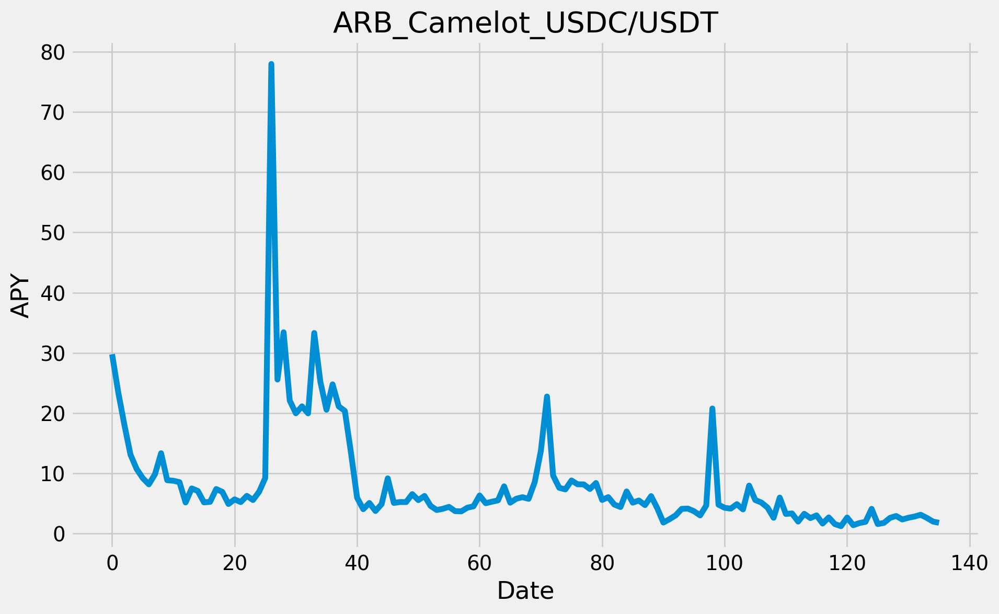

In [1801]:
# Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(ARB_Camelot_USDC_USDT['apy'])

# Customize the chart
plt.title('ARB_Camelot_USDC/USDT')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show()

In [1802]:
## OPT_UniswapV3_DAI/USDC_0.01%
is_true = ((df.project == 'uniswap-v3') &
           df.symbol.isin(['DAI-USDC']) &
           df.chain.isin(['Optimism']))
cols = ['chain', 'project', 'symbol', 'pool', 'tvlUsd', 'apyBase', 'apy', 'apyPct7D', 'apyPct30D', 'apyBase7d', 'apyMean30d', 'volumeUsd7d',
        'mu', 'sigma']
df.loc[is_true, cols].sort_values('apy', ascending=False)
#df.loc[950,cols]

,chain,project,symbol,pool,tvlUsd,apyBase,apy,apyPct7D,apyPct30D,apyBase7d,apyMean30d,volumeUsd7d,mu,sigma


In [1803]:
""" #get historical data
OPT_UniswapV3_DAI_USDC_001=obj.get_pool_hist_apy('')
OPT_UniswapV3_DAI_USDC_001 """

" #get historical data\nOPT_UniswapV3_DAI_USDC_001=obj.get_pool_hist_apy('')\nOPT_UniswapV3_DAI_USDC_001 "

In [1804]:
""" # Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(OPT_UniswapV3_DAI_USDC_001['apy'])

# Customize the chart
plt.title('OPT_UniswapV3_DAI/USDC_0.01%')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show() """

" # Create the time-series plot\nplt.figure(figsize=(10, 6))\nplt.plot(OPT_UniswapV3_DAI_USDC_001['apy'])\n\n# Customize the chart\nplt.title('OPT_UniswapV3_DAI/USDC_0.01%')\nplt.xlabel('Date')\nplt.ylabel('APY')\n\n# Display the chart\nplt.show() "

In [1805]:
## OPT_UniswapV3_USDC/USDT_0.01%
is_true = ((df.project == 'uniswap-v3') &
           df.symbol.isin(['USDC-USDT']) &
           df.chain.isin(['Optimism']))
cols = ['chain', 'project', 'symbol', 'pool', 'tvlUsd', 'apyBase', 'apy', 'apyPct7D', 'apyPct30D', 'apyBase7d', 'apyMean30d', 'volumeUsd7d',
        'mu', 'sigma']
df.loc[is_true, cols].sort_values('apy', ascending=False)
#df.loc[950,cols]

,chain,project,symbol,pool,tvlUsd,apyBase,apy,apyPct7D,apyPct30D,apyBase7d,apyMean30d,volumeUsd7d,mu,sigma


In [1806]:
#get historical data
""" OPT_UniswapV3_USDC_USDT_001=obj.get_pool_hist_apy('971f4de7-e307-460a-961f-59acf3ebfca7')
OPT_UniswapV3_USDC_USDT_001 """

" OPT_UniswapV3_USDC_USDT_001=obj.get_pool_hist_apy('971f4de7-e307-460a-961f-59acf3ebfca7')\nOPT_UniswapV3_USDC_USDT_001 "

In [1807]:
""" # Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(OPT_UniswapV3_USDC_USDT_001['apy'])

# Customize the chart
plt.title('OPT_UniswapV3_USDC/USDT_0.01%')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show() """

" # Create the time-series plot\nplt.figure(figsize=(10, 6))\nplt.plot(OPT_UniswapV3_USDC_USDT_001['apy'])\n\n# Customize the chart\nplt.title('OPT_UniswapV3_USDC/USDT_0.01%')\nplt.xlabel('Date')\nplt.ylabel('APY')\n\n# Display the chart\nplt.show() "

In [1808]:
## OPT_Velodrome_USDC/DAI
is_true = ((df.project == 'velodrome') &
           df.symbol.isin(['USDC-DAI']) &
           df.chain.isin(['Optimism']))
cols = ['chain', 'project', 'symbol', 'pool', 'tvlUsd', 'apyBase', 'apy', 'apyPct7D', 'apyPct30D', 'apyBase7d', 'apyMean30d', 'volumeUsd7d',
        'mu', 'sigma']
df.loc[is_true, cols].sort_values('apy', ascending=False)

,chain,project,symbol,pool,tvlUsd,apyBase,apy,apyPct7D,apyPct30D,apyBase7d,apyMean30d,volumeUsd7d,mu,sigma
10077,Optimism,velodrome,USDC-DAI,976e61c9-aed9-47a6-9c03-fbc0cbb11ee6,20124,NaN,3e-05%,-0.0000,-0.0000,NaN,0.0000,NaN,0.1216,0.0217
2833,Optimism,velodrome,USDC-DAI,97d60248-3896-4e52-a624-8ce02d2252e2,551853,NaN,1.39041%,-0.3440,-3.4338,NaN,3.9065,NaN,5.0528,0.1123


In [1809]:
#get historical data
OPT_Velodrome_USDC_DAI_1=obj.get_pool_hist_apy('97d60248-3896-4e52-a624-8ce02d2252e2')
OPT_Velodrome_USDC_DAI_1.reset_index(inplace=True)
OPT_Velodrome_USDC_DAI_1['date'] = pd.to_datetime(OPT_Velodrome_USDC_DAI_1['date']).dt.strftime('%Y-%m-%d')
OPT_Velodrome_USDC_DAI_1.to_excel(writer, sheet_name='OPT_Velodrome_USDC_DAI#1', index=False)

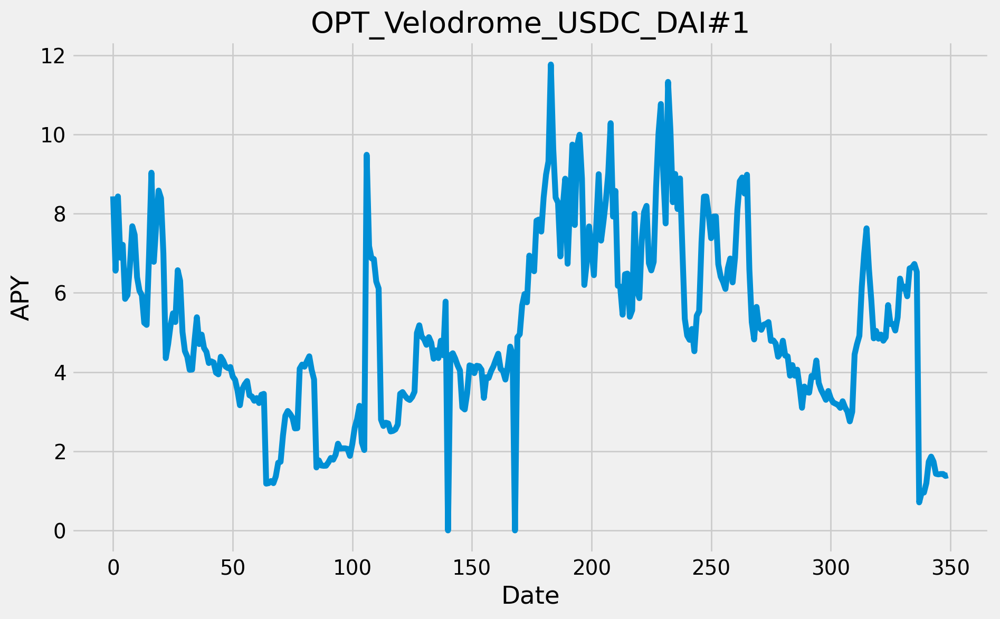

In [1810]:
# Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(OPT_Velodrome_USDC_DAI_1['apy'])

# Customize the chart
plt.title('OPT_Velodrome_USDC_DAI#1')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show()

In [1811]:
OPT_Velodrome_USDC_DAI_2=obj.get_pool_hist_apy('976e61c9-aed9-47a6-9c03-fbc0cbb11ee6')
OPT_Velodrome_USDC_DAI_2.reset_index(inplace=True)
OPT_Velodrome_USDC_DAI_2['date'] = pd.to_datetime(OPT_Velodrome_USDC_DAI_2['date']).dt.strftime('%Y-%m-%d')
OPT_Velodrome_USDC_DAI_2.to_excel(writer, sheet_name='OPT_Velodrome_USDC_DAI#2', index=False)

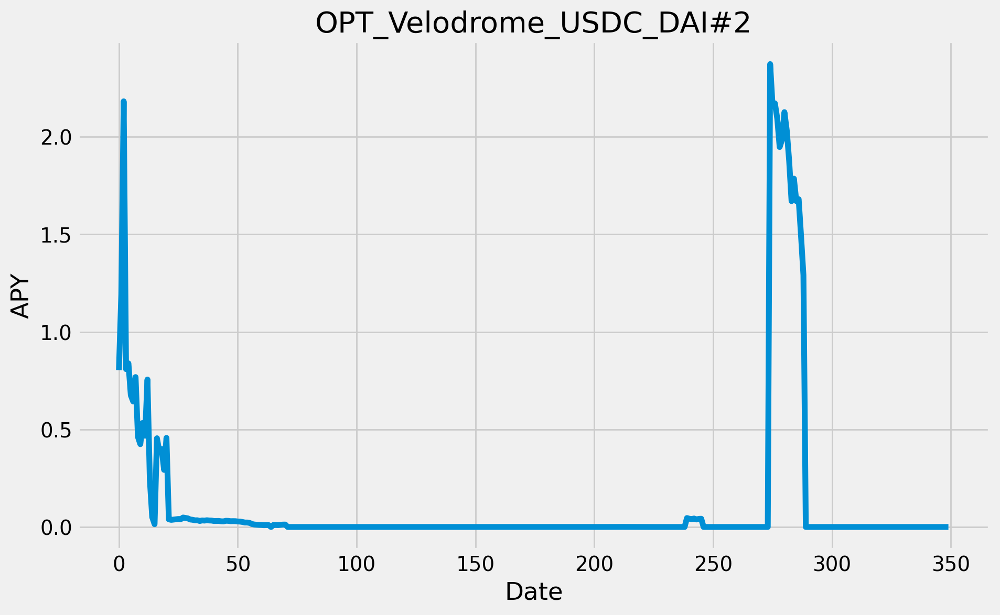

In [1812]:
# Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(OPT_Velodrome_USDC_DAI_2['apy'])

# Customize the chart
plt.title('OPT_Velodrome_USDC_DAI#2')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show()

In [1813]:
## OPT_Velodrome_USDC/USDT
is_true = ((df.project == 'velodrome') &
           df.symbol.isin(['USDC-USDT']) &
           df.chain.isin(['Optimism']))
cols = ['chain', 'project', 'symbol', 'pool', 'tvlUsd', 'apyBase', 'apy', 'apyPct7D', 'apyPct30D', 'apyBase7d', 'apyMean30d', 'volumeUsd7d',
        'mu', 'sigma']
df.loc[is_true, cols].sort_values('apy', ascending=False)

,chain,project,symbol,pool,tvlUsd,apyBase,apy,apyPct7D,apyPct30D,apyBase7d,apyMean30d,volumeUsd7d,mu,sigma
3713,Optimism,velodrome,USDC-USDT,95288faf-2b8d-4fa3-9073-2550af993b0d,328649,NaN,0.76588%,-3.8896,-3.9127,NaN,4.4224,NaN,5.9402,0.1744


In [1814]:
#get historical data
OPT_Velodrome_USDC_USDT=obj.get_pool_hist_apy('95288faf-2b8d-4fa3-9073-2550af993b0d')
OPT_Velodrome_USDC_USDT.reset_index(inplace=True)
OPT_Velodrome_USDC_USDT['date'] = pd.to_datetime(OPT_Velodrome_USDC_USDT['date']).dt.strftime('%Y-%m-%d')
OPT_Velodrome_USDC_USDT.to_excel(writer, sheet_name='OPT_Velodrome_USDC_USDT', index=False)

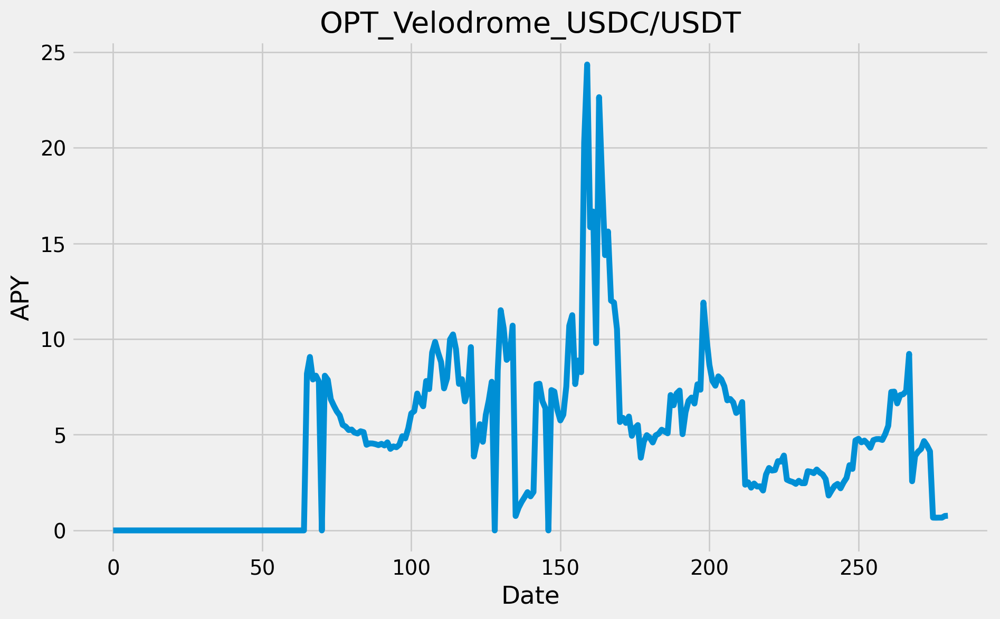

In [1815]:
# Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(OPT_Velodrome_USDC_USDT['apy'])

# Customize the chart
plt.title('OPT_Velodrome_USDC/USDT')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show()

In [1816]:
## OPT_Velodrome_USDC/sUSD
is_true = ((df.project == 'velodrome') &
           df.symbol.isin(['USDC-SUSD']) &
           df.chain.isin(['Optimism']))
cols = ['chain', 'project', 'symbol', 'pool', 'tvlUsd', 'apyBase', 'apy', 'apyPct7D', 'apyPct30D', 'apyBase7d', 'apyMean30d', 'volumeUsd7d',
        'mu', 'sigma']
df.loc[is_true, cols].sort_values('apy', ascending=False)

,chain,project,symbol,pool,tvlUsd,apyBase,apy,apyPct7D,apyPct30D,apyBase7d,apyMean30d,volumeUsd7d,mu,sigma
396,Optimism,velodrome,USDC-SUSD,79d5c9bd-b2a1-4f6d-96d1-42973be4dbd7,11496153,NaN,0.68691%,-1.0651,-4.1448,NaN,3.7527,NaN,7.7871,0.1671
11351,Optimism,velodrome,USDC-SUSD,dbf7dc94-b4ac-43a4-8f94-b4e417061bc4,12133,NaN,0.00158%,-0.0000,-0.0017,NaN,0.0027,NaN,0.0428,0.0071


In [1817]:
#get historical data
OPT_Velodrome_USDC_sUSD_1=obj.get_pool_hist_apy('79d5c9bd-b2a1-4f6d-96d1-42973be4dbd7')
OPT_Velodrome_USDC_sUSD_1.reset_index(inplace=True)
OPT_Velodrome_USDC_sUSD_1['date'] = pd.to_datetime(OPT_Velodrome_USDC_sUSD_1['date']).dt.strftime('%Y-%m-%d')
OPT_Velodrome_USDC_sUSD_1.to_excel(writer, sheet_name='OPT_Velodrome_USDC_sUSD#1', index=False)

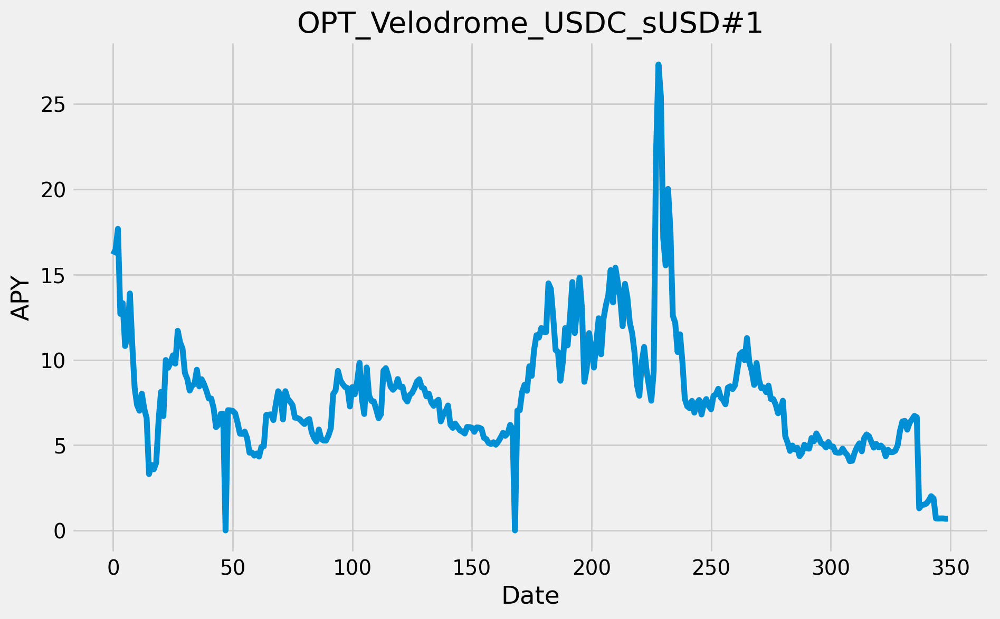

In [1818]:
# Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(OPT_Velodrome_USDC_sUSD_1['apy'])

# Customize the chart
plt.title('OPT_Velodrome_USDC_sUSD#1')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show()

In [1819]:
#get historical data
OPT_Velodrome_USDC_sUSD_2=obj.get_pool_hist_apy('dbf7dc94-b4ac-43a4-8f94-b4e417061bc4')
OPT_Velodrome_USDC_sUSD_2.reset_index(inplace=True)
OPT_Velodrome_USDC_sUSD_2['date'] = pd.to_datetime(OPT_Velodrome_USDC_sUSD_2['date']).dt.strftime('%Y-%m-%d')
OPT_Velodrome_USDC_sUSD_2.to_excel(writer, sheet_name='OPT_Velodrome_USDC_sUSD#2', index=False)

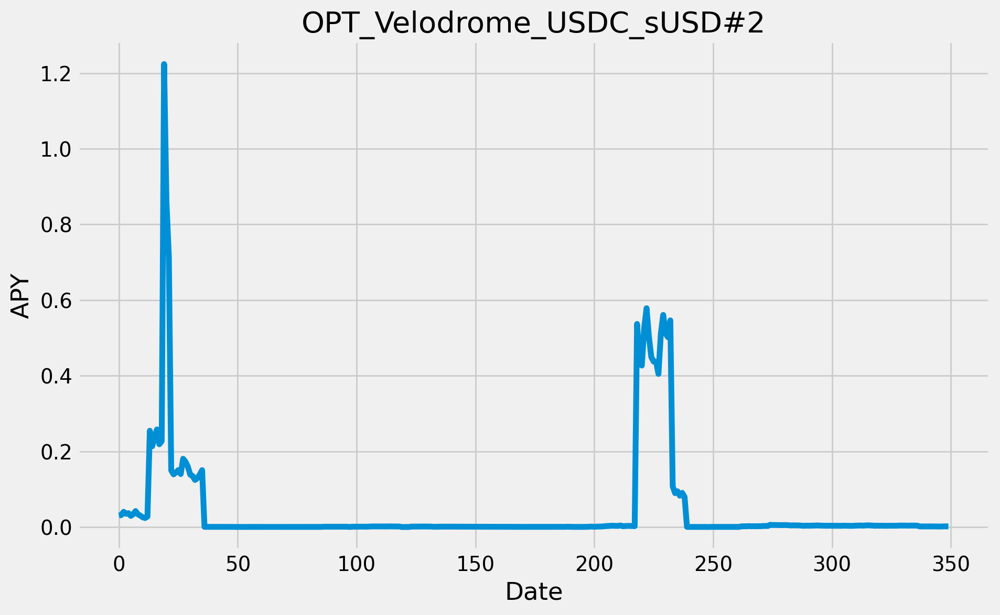

In [1820]:
# Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(OPT_Velodrome_USDC_sUSD_2['apy'])

# Customize the chart
plt.title('OPT_Velodrome_USDC_sUSD#2')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show()

## ETH/Stablecoin Pools

## Mainnet

In [1821]:
## Mainnet_Uniswap_USDC/WETH_0.05%
is_true = ((df.project == 'uniswap-v3') &
           df.symbol.isin(['USDC-WETH']) &
           df.chain.isin(['Ethereum']))
cols = ['chain', 'project', 'symbol', 'pool', 'tvlUsd', 'apyBase', 'apy', 'apyPct7D', 'apyPct30D', 'apyBase7d', 'apyMean30d', 'volumeUsd7d',
        'mu', 'sigma']
df.loc[is_true, cols].sort_values('apy', ascending=False)

,chain,project,symbol,pool,tvlUsd,apyBase,apy,apyPct7D,apyPct30D,apyBase7d,apyMean30d,volumeUsd7d,mu,sigma
87,Ethereum,uniswap-v3,USDC-WETH,49717ee2-9808-4288-b76d-e658195b7979,88398867,9.5665,9.56648%,2.1618,-22.1578,7.3790,12.5999,"44,666,981.0510",21.7965,0.8543
405,Ethereum,uniswap-v3,USDC-WETH,61d9b656-e4e8-4b6b-8659-06131995b499,10955497,7.1975,7.19751%,3.7640,-12.1562,10.0535,7.6265,"1,705,774.9159",13.9629,0.8668
36,Ethereum,uniswap-v3,USDC-WETH,665dc8bc-c79d-4800-97f7-304bf368e547,249573996,10.9159,10.91588%,-12.0372,-28.7765,9.3045,18.5712,"1,375,258,280.2262",37.0580,0.9785
9273,Ethereum,uniswap-v3,USDC-WETH,8b3ed515-5e6f-449a-9b64-25113cda7a29,28033,0.0015,0.00153%,-1.6347,-2.0535,0.1024,1.5807,"19,873.0681",18.6545,1.5771


In [1822]:
#get historical data
Mainnet_Uniswap_USDC_WETH_005=obj.get_pool_hist_apy('665dc8bc-c79d-4800-97f7-304bf368e547')
Mainnet_Uniswap_USDC_WETH_005.reset_index(inplace=True)
Mainnet_Uniswap_USDC_WETH_005['date'] = pd.to_datetime(Mainnet_Uniswap_USDC_WETH_005['date']).dt.strftime('%Y-%m-%d')
Mainnet_Uniswap_USDC_WETH_005.to_excel(writer, sheet_name='Mainnet_Uniswap_USDC_WETH_0.05%', index=False)

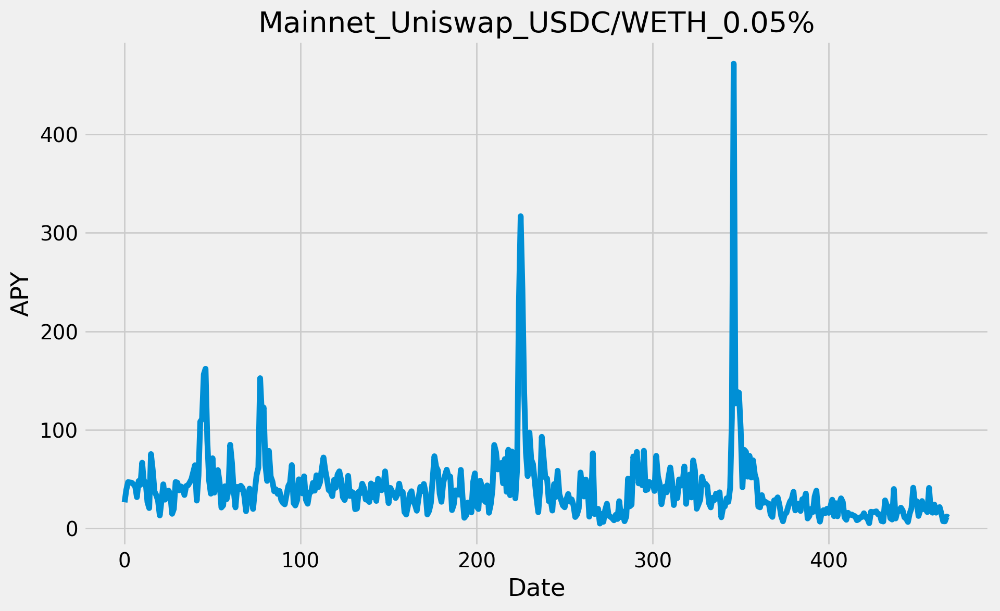

In [1823]:
# Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(Mainnet_Uniswap_USDC_WETH_005['apy'])

# Customize the chart
plt.title('Mainnet_Uniswap_USDC/WETH_0.05%')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show()

In [1824]:
## Mainnet_Uniswap_USDT/WETH_0.05%
is_true = ((df.project == 'uniswap-v3') &
           df.symbol.isin(['WETH-USDT']) &
           df.chain.isin(['Ethereum']))
cols = ['chain', 'project', 'symbol', 'pool', 'tvlUsd', 'apyBase', 'apy', 'apyPct7D', 'apyPct30D', 'apyBase7d', 'apyMean30d', 'volumeUsd7d',
        'mu', 'sigma']
df.loc[is_true, cols].sort_values('apy', ascending=False)


,chain,project,symbol,pool,tvlUsd,apyBase,apy,apyPct7D,apyPct30D,apyBase7d,apyMean30d,volumeUsd7d,mu,sigma
136,Ethereum,uniswap-v3,WETH-USDT,fc9f488e-8183-416f-a61e-4e5c571d4395,53145111,8.0583,8.05831%,1.6814,-19.1741,7.8138,11.4745,"24,199,965.7391",19.7885,0.8362
251,Ethereum,uniswap-v3,WETH-USDT,da0cfe35-c566-4956-8c11-f1b68a5d6676,23187728,6.0206,6.02063%,3.6552,-14.9028,9.1347,5.2465,"2,204,004.0781",11.2439,1.3758
89,Ethereum,uniswap-v3,WETH-USDT,f7dd8768-77be-4f91-96d6-dd563ac23dd5,81239021,17.5626,17.56259%,1.6872,-31.0456,7.4157,20.0304,"463,607,016.1866",30.7752,0.9403


In [1825]:
#get historical data
Mainnet_Uniswap_USDT_WETH_005=obj.get_pool_hist_apy('f7dd8768-77be-4f91-96d6-dd563ac23dd5')
Mainnet_Uniswap_USDT_WETH_005.reset_index(inplace=True)
Mainnet_Uniswap_USDT_WETH_005['date'] = pd.to_datetime(Mainnet_Uniswap_USDT_WETH_005['date']).dt.strftime('%Y-%m-%d')
Mainnet_Uniswap_USDT_WETH_005.to_excel(writer, sheet_name='Mainnet_Uniswap_USDT_WETH_0.05%', index=False)

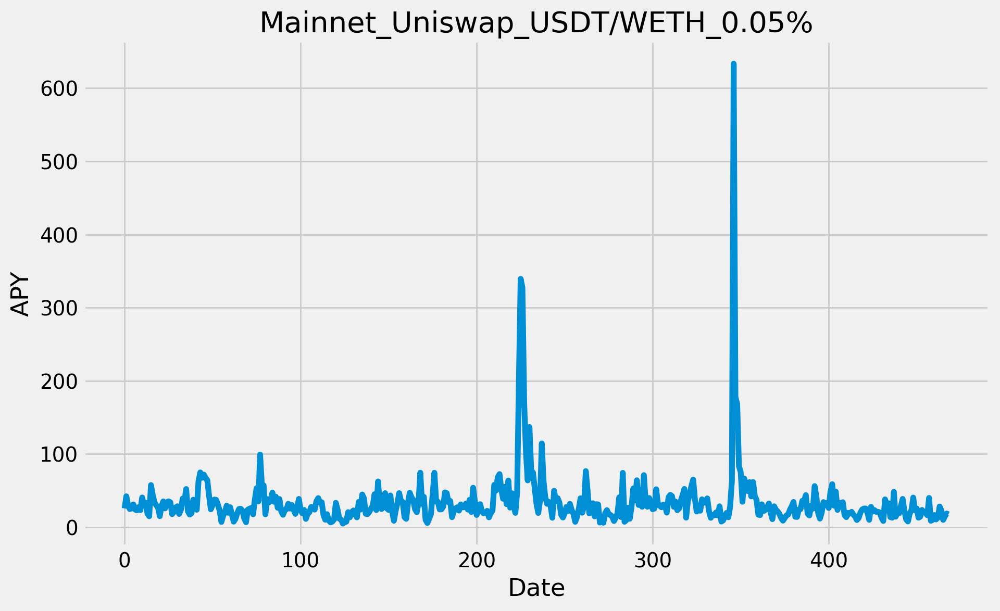

In [1826]:
# Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(Mainnet_Uniswap_USDT_WETH_005['apy'])

# Customize the chart
plt.title('Mainnet_Uniswap_USDT/WETH_0.05%')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show()

In [1827]:
## Mainnet_Uniswap_DAI/WETH_0.05%
is_true = ((df.project == 'uniswap-v3') &
           df.symbol.isin(['DAI-WETH']) &
           df.chain.isin(['Ethereum']))
cols = ['chain', 'project', 'symbol', 'pool', 'tvlUsd', 'apyBase', 'apy', 'apyPct7D', 'apyPct30D', 'apyBase7d', 'apyMean30d', 'volumeUsd7d',
        'mu', 'sigma']
df.loc[is_true, cols].sort_values('apy', ascending=False)

,chain,project,symbol,pool,tvlUsd,apyBase,apy,apyPct7D,apyPct30D,apyBase7d,apyMean30d,volumeUsd7d,mu,sigma
338,Ethereum,uniswap-v3,DAI-WETH,c7a4d490-cd63-49a2-a969-61854b80344e,15429297,9.0836,9.08355%,6.2407,-25.9955,6.8828,11.2499,"7,786,608.3581",19.8604,0.9395
2216,Ethereum,uniswap-v3,DAI-WETH,41668825-ae4d-4721-a3ff-652ee6e40f15,841316,4.2410,4.24099%,1.7838,-15.1648,7.4898,5.1102,"70,036.6443",10.5897,0.7681
476,Ethereum,uniswap-v3,DAI-WETH,5de03d0f-15c0-4bb5-9a18-26d03339c057,8627514,23.5857,23.58567%,16.4898,-30.0749,8.4354,23.4798,"69,541,898.6180",26.2804,1.0606


In [1828]:
#get historical data
Mainnet_Uniswap_DAI_WETH_005=obj.get_pool_hist_apy('5de03d0f-15c0-4bb5-9a18-26d03339c057')
Mainnet_Uniswap_DAI_WETH_005.reset_index(inplace=True)
Mainnet_Uniswap_DAI_WETH_005['date'] = pd.to_datetime(Mainnet_Uniswap_DAI_WETH_005['date']).dt.strftime('%Y-%m-%d')
Mainnet_Uniswap_DAI_WETH_005.to_excel(writer, sheet_name='Mainnet_Uniswap_DAI_WETH_0.05%', index=False)

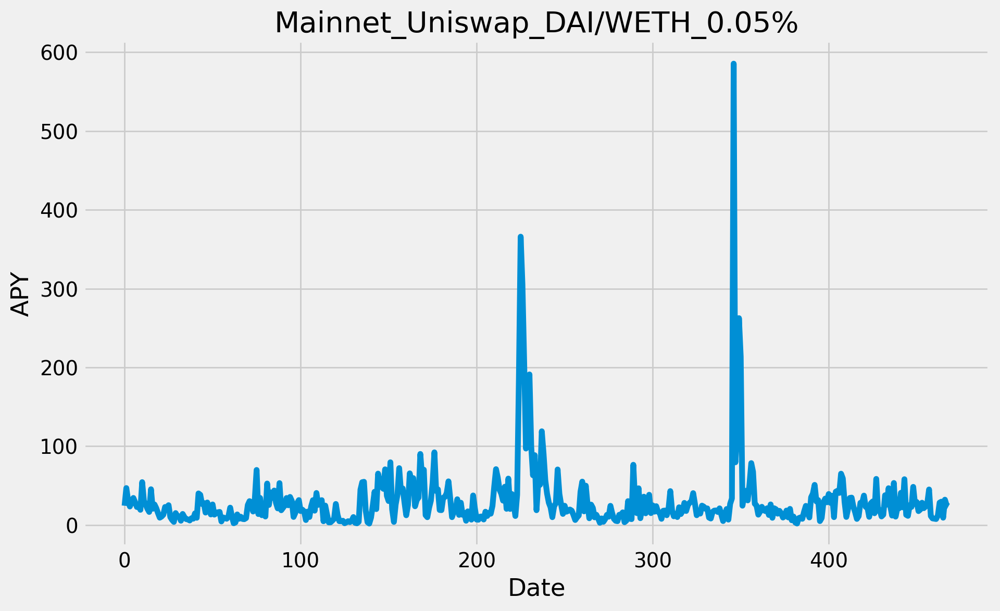

In [1829]:
# Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(Mainnet_Uniswap_DAI_WETH_005['apy'])

# Customize the chart
plt.title('Mainnet_Uniswap_DAI/WETH_0.05%')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show()

In [1830]:
## Mainnet_Uniswap_USDC/WETH_0.3%
is_true = ((df.project == 'uniswap-v3') &
           df.symbol.isin(['USDC-WETH']) &
           df.chain.isin(['Ethereum']))
cols = ['chain', 'project', 'symbol', 'pool', 'tvlUsd', 'apyBase', 'apy', 'apyPct7D', 'apyPct30D', 'apyBase7d', 'apyMean30d', 'volumeUsd7d',
        'mu', 'sigma']
df.loc[is_true, cols].sort_values('apy', ascending=False)

,chain,project,symbol,pool,tvlUsd,apyBase,apy,apyPct7D,apyPct30D,apyBase7d,apyMean30d,volumeUsd7d,mu,sigma
87,Ethereum,uniswap-v3,USDC-WETH,49717ee2-9808-4288-b76d-e658195b7979,88398867,9.5665,9.56648%,2.1618,-22.1578,7.3790,12.5999,"44,666,981.0510",21.7965,0.8543
405,Ethereum,uniswap-v3,USDC-WETH,61d9b656-e4e8-4b6b-8659-06131995b499,10955497,7.1975,7.19751%,3.7640,-12.1562,10.0535,7.6265,"1,705,774.9159",13.9629,0.8668
36,Ethereum,uniswap-v3,USDC-WETH,665dc8bc-c79d-4800-97f7-304bf368e547,249573996,10.9159,10.91588%,-12.0372,-28.7765,9.3045,18.5712,"1,375,258,280.2262",37.0580,0.9785
9273,Ethereum,uniswap-v3,USDC-WETH,8b3ed515-5e6f-449a-9b64-25113cda7a29,28033,0.0015,0.00153%,-1.6347,-2.0535,0.1024,1.5807,"19,873.0681",18.6545,1.5771


In [1831]:
#get historical data
Mainnet_Uniswap_USDC_WETH_03=obj.get_pool_hist_apy('49717ee2-9808-4288-b76d-e658195b7979')
Mainnet_Uniswap_USDC_WETH_03.reset_index(inplace=True)
Mainnet_Uniswap_USDC_WETH_03['date'] = pd.to_datetime(Mainnet_Uniswap_USDC_WETH_03['date']).dt.strftime('%Y-%m-%d')
Mainnet_Uniswap_USDC_WETH_03.to_excel(writer, sheet_name='Mainnet_Uniswap_USDC_WETH_0.3%', index=False)

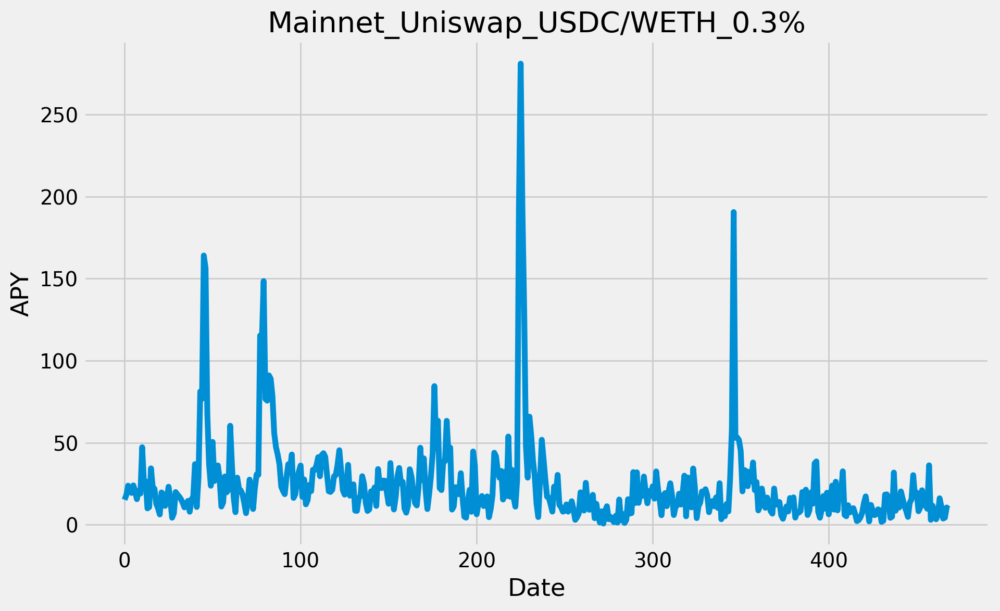

In [1832]:
# Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(Mainnet_Uniswap_USDC_WETH_03['apy'])

# Customize the chart
plt.title('Mainnet_Uniswap_USDC/WETH_0.3%')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show()

In [1833]:
## Mainnet_Uniswap_USDT/WETH_0.3%
is_true = ((df.project == 'uniswap-v3') &
           df.symbol.isin(['WETH-USDT']) &
           df.chain.isin(['Ethereum']))
cols = ['chain', 'project', 'symbol', 'pool', 'tvlUsd', 'apyBase', 'apy', 'apyPct7D', 'apyPct30D', 'apyBase7d', 'apyMean30d', 'volumeUsd7d',
        'mu', 'sigma']
df.loc[is_true, cols].sort_values('apy', ascending=False)

,chain,project,symbol,pool,tvlUsd,apyBase,apy,apyPct7D,apyPct30D,apyBase7d,apyMean30d,volumeUsd7d,mu,sigma
136,Ethereum,uniswap-v3,WETH-USDT,fc9f488e-8183-416f-a61e-4e5c571d4395,53145111,8.0583,8.05831%,1.6814,-19.1741,7.8138,11.4745,"24,199,965.7391",19.7885,0.8362
251,Ethereum,uniswap-v3,WETH-USDT,da0cfe35-c566-4956-8c11-f1b68a5d6676,23187728,6.0206,6.02063%,3.6552,-14.9028,9.1347,5.2465,"2,204,004.0781",11.2439,1.3758
89,Ethereum,uniswap-v3,WETH-USDT,f7dd8768-77be-4f91-96d6-dd563ac23dd5,81239021,17.5626,17.56259%,1.6872,-31.0456,7.4157,20.0304,"463,607,016.1866",30.7752,0.9403


In [1834]:
#get historical data
Mainnet_Uniswap_USDT_WETH_03=obj.get_pool_hist_apy('fc9f488e-8183-416f-a61e-4e5c571d4395')
Mainnet_Uniswap_USDT_WETH_03.reset_index(inplace=True)
Mainnet_Uniswap_USDT_WETH_03['date'] = pd.to_datetime(Mainnet_Uniswap_USDT_WETH_03['date']).dt.strftime('%Y-%m-%d')
Mainnet_Uniswap_USDT_WETH_03.to_excel(writer, sheet_name='Mainnet_Uniswap_USDT_WETH_0.3%', index=False)

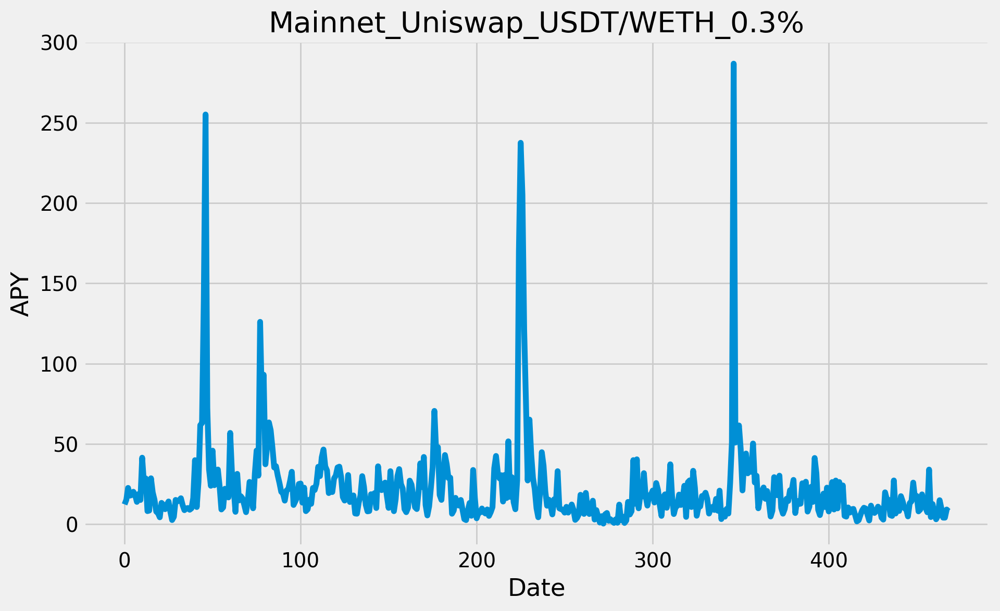

In [1835]:
# Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(Mainnet_Uniswap_USDT_WETH_03['apy'])

# Customize the chart
plt.title('Mainnet_Uniswap_USDT/WETH_0.3%')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show()

In [1836]:
## Mainnet_Uniswap_DAI/WETH_0.3%
is_true = ((df.project == 'uniswap-v3') &
           df.symbol.isin(['DAI-WETH']) &
           df.chain.isin(['Ethereum']))
cols = ['chain', 'project', 'symbol', 'pool', 'tvlUsd', 'apyBase', 'apy', 'apyPct7D', 'apyPct30D', 'apyBase7d', 'apyMean30d', 'volumeUsd7d',
        'mu', 'sigma']
df.loc[is_true, cols].sort_values('apy', ascending=False)

,chain,project,symbol,pool,tvlUsd,apyBase,apy,apyPct7D,apyPct30D,apyBase7d,apyMean30d,volumeUsd7d,mu,sigma
338,Ethereum,uniswap-v3,DAI-WETH,c7a4d490-cd63-49a2-a969-61854b80344e,15429297,9.0836,9.08355%,6.2407,-25.9955,6.8828,11.2499,"7,786,608.3581",19.8604,0.9395
2216,Ethereum,uniswap-v3,DAI-WETH,41668825-ae4d-4721-a3ff-652ee6e40f15,841316,4.2410,4.24099%,1.7838,-15.1648,7.4898,5.1102,"70,036.6443",10.5897,0.7681
476,Ethereum,uniswap-v3,DAI-WETH,5de03d0f-15c0-4bb5-9a18-26d03339c057,8627514,23.5857,23.58567%,16.4898,-30.0749,8.4354,23.4798,"69,541,898.6180",26.2804,1.0606


In [1837]:
#get historical data
Mainnet_Uniswap_DAI_WETH_03=obj.get_pool_hist_apy('c7a4d490-cd63-49a2-a969-61854b80344e')
Mainnet_Uniswap_DAI_WETH_03.reset_index(inplace=True)
Mainnet_Uniswap_DAI_WETH_03['date'] = pd.to_datetime(Mainnet_Uniswap_DAI_WETH_03['date']).dt.strftime('%Y-%m-%d')
Mainnet_Uniswap_DAI_WETH_03.to_excel(writer, sheet_name='Mainnet_Uniswap_DAI_WETH_0.3%', index=False)

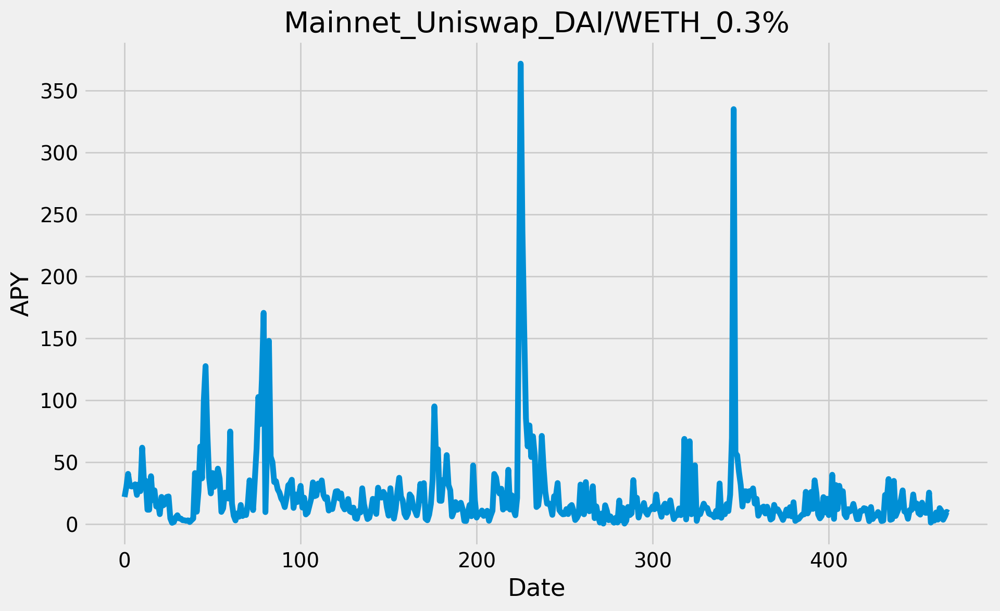

In [1838]:
# Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(Mainnet_Uniswap_DAI_WETH_03['apy'])

# Customize the chart
plt.title('Mainnet_Uniswap_DAI/WETH_0.3%')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show()

## Arbitrum

In [1839]:
## ARB_Uniswap_USDC/WETH_0.05%
is_true = ((df.project == 'uniswap-v3') &
           df.symbol.isin(['WETH-USDC']) &
           df.chain.isin(['Arbitrum']))
cols = ['chain', 'project', 'symbol', 'pool', 'tvlUsd', 'apyBase', 'apy', 'apyPct7D', 'apyPct30D', 'apyBase7d', 'apyMean30d', 'volumeUsd7d',
        'mu', 'sigma']
df.loc[is_true, cols].sort_values('apy', ascending=False)

,chain,project,symbol,pool,tvlUsd,apyBase,apy,apyPct7D,apyPct30D,apyBase7d,apyMean30d,volumeUsd7d,mu,sigma
11209,Arbitrum,uniswap-v3,WETH-USDC,eeb99068-f0aa-498b-940b-039cd01eaa66,12821,8.1850,8.18504%,3.7751,-26.4163,18.7646,16.2498,"4,626.5562",23.9344,1.6923
4539,Arbitrum,uniswap-v3,WETH-USDC,94594b8f-fd0c-48c3-b760-87c8e56b64fa,222541,28.7241,28.72412%,12.9962,NaN,22.4447,27.9229,"320,184.9415",26.7974,0.5834
386,Arbitrum,uniswap-v3,WETH-USDC,a14bd201-764c-40a5-86b8-2928b2461232,12333351,27.8437,27.84372%,-11.4863,-18.5900,28.3916,39.2069,"134,678,556.0037",38.3386,0.6101
148,Arbitrum,uniswap-v3,WETH-USDC,9fb44210-2b23-4b7d-8f2f-aba82b93843e,47389574,27.4620,27.46201%,-14.1055,-26.5988,26.9575,36.5040,"491,347,626.9246",47.6833,1.1341
6223,Arbitrum,uniswap-v3,WETH-USDC,0e9cb3d6-ebc7-4a87-8a47-1f3b5c109701,113074,22.7400,22.74002%,-17.5084,18.6521,25.3634,12.0960,"5,515,255.8749",13.7791,0.9322
624,Arbitrum,uniswap-v3,WETH-USDC,d8f13b99-3eb8-436f-97d6-882ea1eff8f4,5899097,21.3624,21.36243%,14.4465,-39.0895,14.1124,24.9745,"5,336,567.1134",32.1907,1.0187
7952,Arbitrum,uniswap-v3,WETH-USDC,2d4ca6f7-b980-49df-b32e-91f613ae9e09,51274,2.4676,2.46764%,-0.7590,NaN,2.1843,11.7212,"215,382.6299",5.9071,0.4361
11233,Arbitrum,uniswap-v3,WETH-USDC,73abd456-ad4d-45df-9a47-86758ab5a8ef,12674,13.2839,13.28394%,10.1852,NaN,16.5069,4.1148,"4,023.1177",5.6224,0.2797


In [1840]:
#get historical data
ARB_Uniswap_USDC_WETH_005=obj.get_pool_hist_apy('9fb44210-2b23-4b7d-8f2f-aba82b93843e')
ARB_Uniswap_USDC_WETH_005.reset_index(inplace=True)
ARB_Uniswap_USDC_WETH_005['date'] = pd.to_datetime(ARB_Uniswap_USDC_WETH_005['date']).dt.strftime('%Y-%m-%d')
ARB_Uniswap_USDC_WETH_005.to_excel(writer, sheet_name='ARB_Uniswap_USDC_WETH_0.05%', index=False)

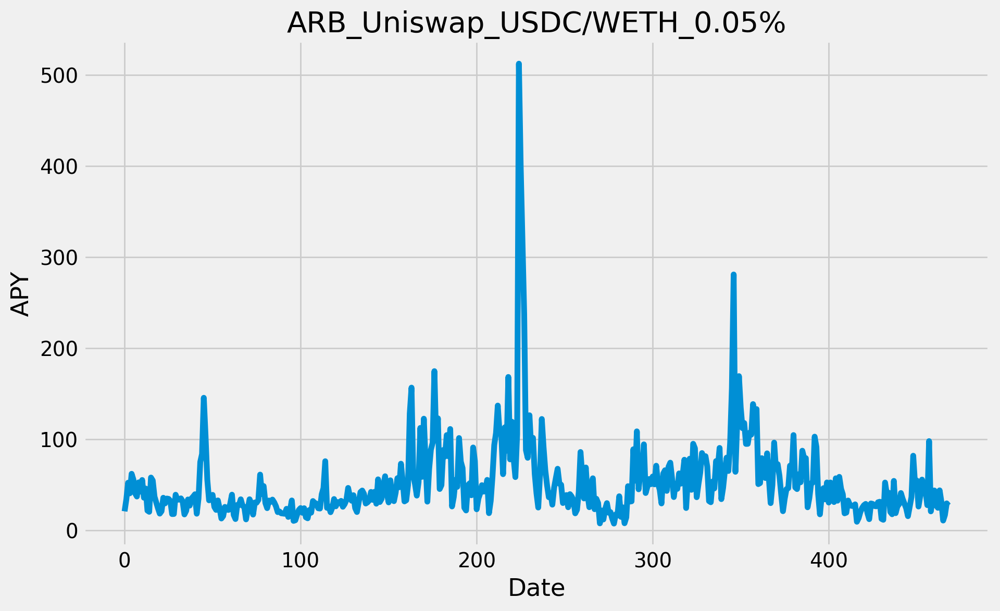

In [1841]:
# Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(ARB_Uniswap_USDC_WETH_005['apy'])

# Customize the chart
plt.title('ARB_Uniswap_USDC/WETH_0.05%')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show()

In [1842]:
## ARB_Uniswap_USDT/WETH_0.05%
is_true = ((df.project == 'uniswap-v3') &
           df.symbol.isin(['WETH-USDT']) &
           df.chain.isin(['Arbitrum']))
cols = ['chain', 'project', 'symbol', 'pool', 'tvlUsd', 'apyBase', 'apy', 'apyPct7D', 'apyPct30D', 'apyBase7d', 'apyMean30d', 'volumeUsd7d',
        'mu', 'sigma']
df.loc[is_true, cols].sort_values('apy', ascending=False)


,chain,project,symbol,pool,tvlUsd,apyBase,apy,apyPct7D,apyPct30D,apyBase7d,apyMean30d,volumeUsd7d,mu,sigma
855,Arbitrum,uniswap-v3,WETH-USDT,b8582b33-80e3-4250-a496-02936860669f,3843247,7.9589,7.95886%,2.8829,-19.8961,5.5365,8.1876,"1,363,982.0712",14.4198,1.0422
9511,Arbitrum,uniswap-v3,WETH-USDT,b644954f-a623-4804-948c-18f6bfc86de0,25145,35.6969,35.69691%,23.2634,19.2498,32.6896,24.0934,"1,580,723.3847",17.0780,0.8470
330,Arbitrum,uniswap-v3,WETH-USDT,49bdce2c-65d0-4bb7-bdc0-dc0d642317e6,16264794,32.8416,32.84156%,-13.6367,-35.6085,35.0562,43.6088,"219,300,930.4045",46.9591,1.3096
8891,Arbitrum,uniswap-v3,WETH-USDT,a6fc6500-e3cb-4d2e-a18e-12bcdf5aa22c,33119,12.5699,12.56989%,7.7805,-15.2088,9.8819,10.4475,"6,293.7290",10.3035,0.8050


In [1843]:
#get historical data
ARB_Uniswap_USDT_WETH_005=obj.get_pool_hist_apy('49bdce2c-65d0-4bb7-bdc0-dc0d642317e6')
ARB_Uniswap_USDT_WETH_005.reset_index(inplace=True)
ARB_Uniswap_USDT_WETH_005['date'] = pd.to_datetime(ARB_Uniswap_USDT_WETH_005['date']).dt.strftime('%Y-%m-%d')
ARB_Uniswap_USDT_WETH_005.to_excel(writer, sheet_name='ARB_Uniswap_USDT_WETH_0.05%', index=False)

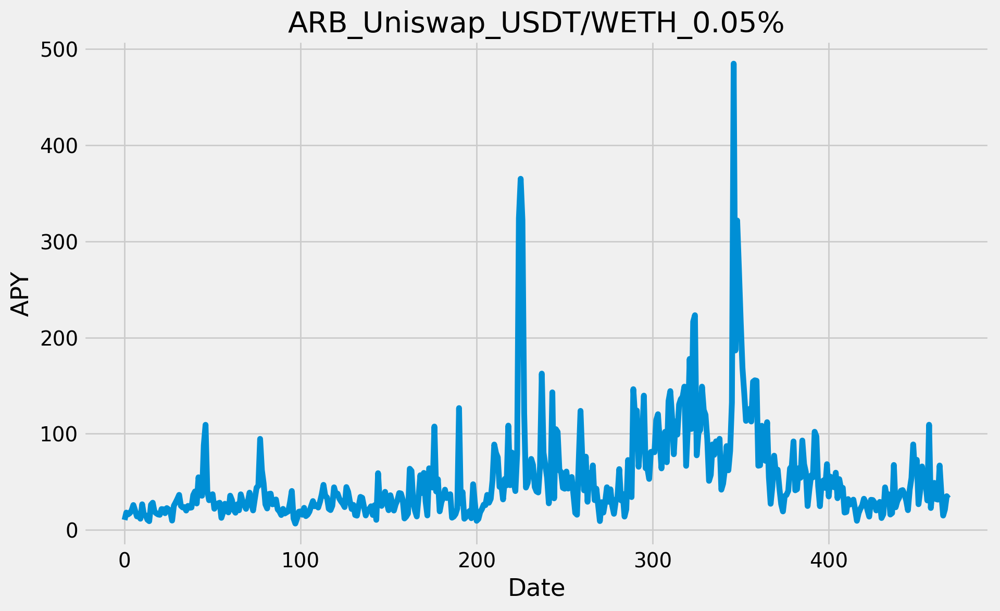

In [1844]:
# Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(ARB_Uniswap_USDT_WETH_005['apy'])

# Customize the chart
plt.title('ARB_Uniswap_USDT/WETH_0.05%')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show()

In [1845]:
## ARB_Uniswap_DAI/WETH_0.05%
is_true = ((df.project == 'uniswap-v3') &
           df.symbol.isin(['WETH-DAI']) &
           df.chain.isin(['Arbitrum']))
cols = ['chain', 'project', 'symbol', 'pool', 'tvlUsd', 'apyBase', 'apy', 'apyPct7D', 'apyPct30D', 'apyBase7d', 'apyMean30d', 'volumeUsd7d',
        'mu', 'sigma']
df.loc[is_true, cols].sort_values('apy', ascending=False)

,chain,project,symbol,pool,tvlUsd,apyBase,apy,apyPct7D,apyPct30D,apyBase7d,apyMean30d,volumeUsd7d,mu,sigma
7678,Arbitrum,uniswap-v3,WETH-DAI,60ae45a2-bd8f-497c-a073-eb9ea1d39788,58038,3.6736,3.67355%,-6.0710,-5.4627,5.7703,6.8454,"128,806.8899",14.2545,0.9536
3308,Arbitrum,uniswap-v3,WETH-DAI,0c1f5caa-98bc-455c-b4bb-009570f7b7a4,407766,11.5724,11.57238%,-2.1769,-26.3810,13.6539,16.9286,"356,896.8099",27.5281,1.1640


In [1846]:
#get historical data
ARB_Uniswap_DAI_WETH_005=obj.get_pool_hist_apy('60ae45a2-bd8f-497c-a073-eb9ea1d39788')
ARB_Uniswap_DAI_WETH_005.reset_index(inplace=True)
ARB_Uniswap_DAI_WETH_005['date'] = pd.to_datetime(ARB_Uniswap_DAI_WETH_005['date']).dt.strftime('%Y-%m-%d')
ARB_Uniswap_DAI_WETH_005.to_excel(writer, sheet_name='ARB_Uniswap_DAI_WETH_0.05%', index=False)

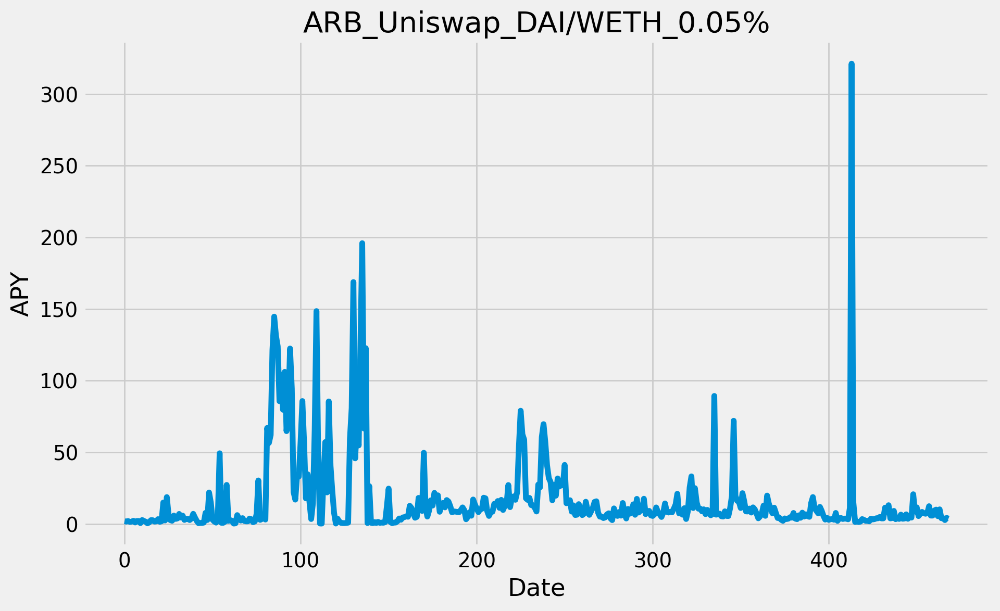

In [1847]:
# Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(ARB_Uniswap_DAI_WETH_005['apy'])

# Customize the chart
plt.title('ARB_Uniswap_DAI/WETH_0.05%')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show()

In [1848]:
## ARB_Uniswap_USDC/WETH_0.3%
is_true = ((df.project == 'uniswap-v3') &
           df.symbol.isin(['WETH-USDC']) &
           df.chain.isin(['Arbitrum']))
cols = ['chain', 'project', 'symbol', 'pool', 'tvlUsd', 'apyBase', 'apy', 'apyPct7D', 'apyPct30D', 'apyBase7d', 'apyMean30d', 'volumeUsd7d',
        'mu', 'sigma']
df.loc[is_true, cols].sort_values('apy', ascending=False)

,chain,project,symbol,pool,tvlUsd,apyBase,apy,apyPct7D,apyPct30D,apyBase7d,apyMean30d,volumeUsd7d,mu,sigma
11209,Arbitrum,uniswap-v3,WETH-USDC,eeb99068-f0aa-498b-940b-039cd01eaa66,12821,8.1850,8.18504%,3.7751,-26.4163,18.7646,16.2498,"4,626.5562",23.9344,1.6923
4539,Arbitrum,uniswap-v3,WETH-USDC,94594b8f-fd0c-48c3-b760-87c8e56b64fa,222541,28.7241,28.72412%,12.9962,NaN,22.4447,27.9229,"320,184.9415",26.7974,0.5834
386,Arbitrum,uniswap-v3,WETH-USDC,a14bd201-764c-40a5-86b8-2928b2461232,12333351,27.8437,27.84372%,-11.4863,-18.5900,28.3916,39.2069,"134,678,556.0037",38.3386,0.6101
148,Arbitrum,uniswap-v3,WETH-USDC,9fb44210-2b23-4b7d-8f2f-aba82b93843e,47389574,27.4620,27.46201%,-14.1055,-26.5988,26.9575,36.5040,"491,347,626.9246",47.6833,1.1341
6223,Arbitrum,uniswap-v3,WETH-USDC,0e9cb3d6-ebc7-4a87-8a47-1f3b5c109701,113074,22.7400,22.74002%,-17.5084,18.6521,25.3634,12.0960,"5,515,255.8749",13.7791,0.9322
624,Arbitrum,uniswap-v3,WETH-USDC,d8f13b99-3eb8-436f-97d6-882ea1eff8f4,5899097,21.3624,21.36243%,14.4465,-39.0895,14.1124,24.9745,"5,336,567.1134",32.1907,1.0187
7952,Arbitrum,uniswap-v3,WETH-USDC,2d4ca6f7-b980-49df-b32e-91f613ae9e09,51274,2.4676,2.46764%,-0.7590,NaN,2.1843,11.7212,"215,382.6299",5.9071,0.4361
11233,Arbitrum,uniswap-v3,WETH-USDC,73abd456-ad4d-45df-9a47-86758ab5a8ef,12674,13.2839,13.28394%,10.1852,NaN,16.5069,4.1148,"4,023.1177",5.6224,0.2797


In [1849]:
#get historical data
ARB_Uniswap_USDC_WETH_03=obj.get_pool_hist_apy('d8f13b99-3eb8-436f-97d6-882ea1eff8f4')
ARB_Uniswap_USDC_WETH_03.reset_index(inplace=True)
ARB_Uniswap_USDC_WETH_03['date'] = pd.to_datetime(ARB_Uniswap_USDC_WETH_03['date']).dt.strftime('%Y-%m-%d')
ARB_Uniswap_USDC_WETH_03.to_excel(writer, sheet_name='ARB_Uniswap_USDC_WETH_0.3%', index=False)

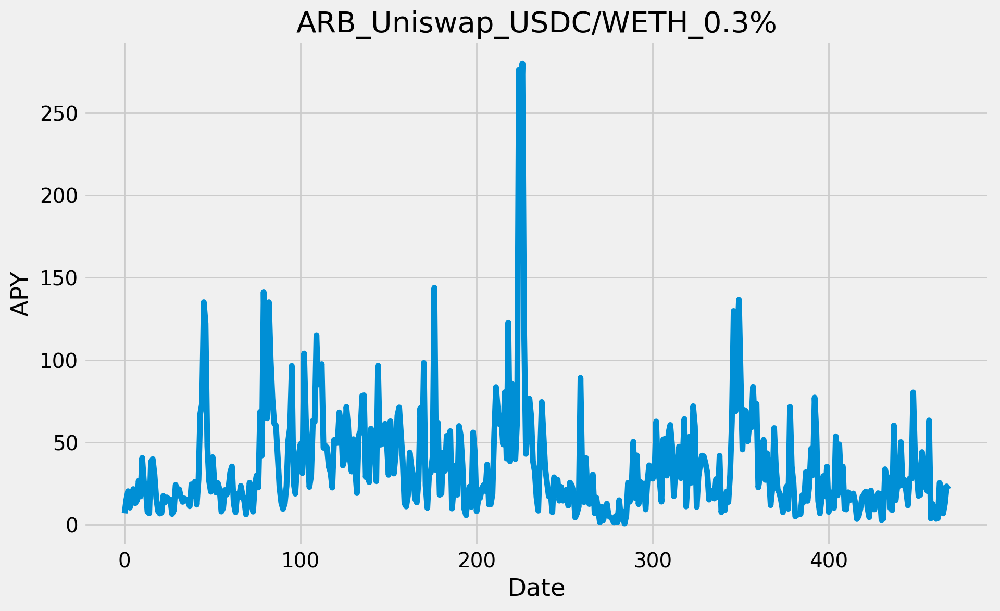

In [1850]:
# Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(ARB_Uniswap_USDC_WETH_03['apy'])

# Customize the chart
plt.title('ARB_Uniswap_USDC/WETH_0.3%')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show()

In [1851]:
## ARB_Uniswap_USDT/WETH_0.3%
is_true = ((df.project == 'uniswap-v3') &
           df.symbol.isin(['WETH-USDT']) &
           df.chain.isin(['Arbitrum']))
cols = ['chain', 'project', 'symbol', 'pool', 'tvlUsd', 'apyBase', 'apy', 'apyPct7D', 'apyPct30D', 'apyBase7d', 'apyMean30d', 'volumeUsd7d',
        'mu', 'sigma']
df.loc[is_true, cols].sort_values('apy', ascending=False)

,chain,project,symbol,pool,tvlUsd,apyBase,apy,apyPct7D,apyPct30D,apyBase7d,apyMean30d,volumeUsd7d,mu,sigma
855,Arbitrum,uniswap-v3,WETH-USDT,b8582b33-80e3-4250-a496-02936860669f,3843247,7.9589,7.95886%,2.8829,-19.8961,5.5365,8.1876,"1,363,982.0712",14.4198,1.0422
9511,Arbitrum,uniswap-v3,WETH-USDT,b644954f-a623-4804-948c-18f6bfc86de0,25145,35.6969,35.69691%,23.2634,19.2498,32.6896,24.0934,"1,580,723.3847",17.0780,0.8470
330,Arbitrum,uniswap-v3,WETH-USDT,49bdce2c-65d0-4bb7-bdc0-dc0d642317e6,16264794,32.8416,32.84156%,-13.6367,-35.6085,35.0562,43.6088,"219,300,930.4045",46.9591,1.3096
8891,Arbitrum,uniswap-v3,WETH-USDT,a6fc6500-e3cb-4d2e-a18e-12bcdf5aa22c,33119,12.5699,12.56989%,7.7805,-15.2088,9.8819,10.4475,"6,293.7290",10.3035,0.8050


In [1852]:
#get historical data
ARB_Uniswap_USDT_WETH_03=obj.get_pool_hist_apy('b8582b33-80e3-4250-a496-02936860669f')
ARB_Uniswap_USDT_WETH_03.reset_index(inplace=True)
ARB_Uniswap_USDT_WETH_03['date'] = pd.to_datetime(ARB_Uniswap_USDT_WETH_03['date']).dt.strftime('%Y-%m-%d')
ARB_Uniswap_USDT_WETH_03.to_excel(writer, sheet_name='ARB_Uniswap_USDT_WETH_0.3%', index=False)

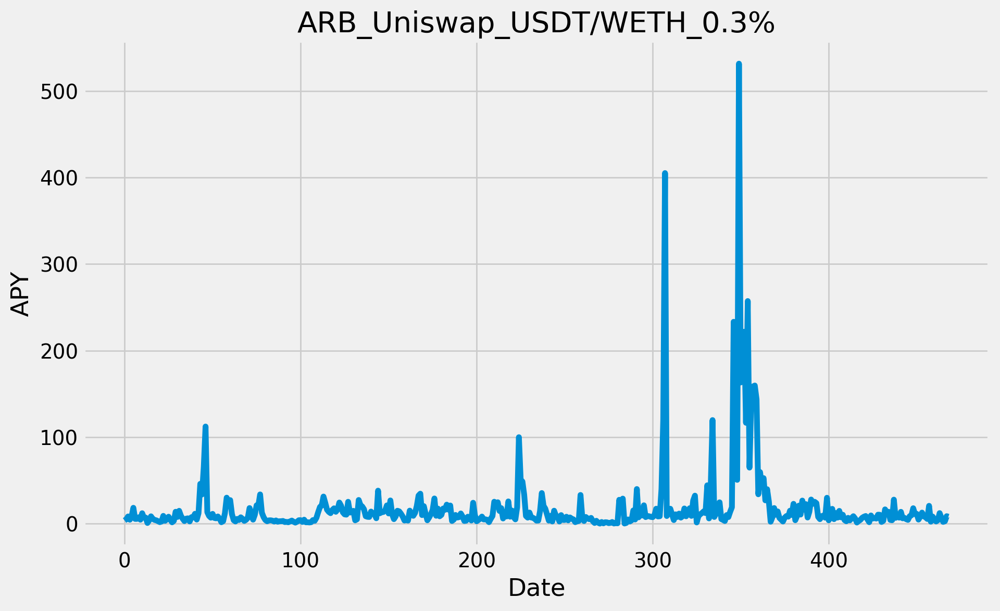

In [1853]:
# Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(ARB_Uniswap_USDT_WETH_03['apy'])

# Customize the chart
plt.title('ARB_Uniswap_USDT/WETH_0.3%')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show()

In [1854]:
## ARB_Uniswap_DAI/WETH_0.3%
is_true = ((df.project == 'uniswap-v3') &
           df.symbol.isin(['WETH-DAI']) &
           df.chain.isin(['Arbitrum']))
cols = ['chain', 'project', 'symbol', 'pool', 'tvlUsd', 'apyBase', 'apy', 'apyPct7D', 'apyPct30D', 'apyBase7d', 'apyMean30d', 'volumeUsd7d',
        'mu', 'sigma']
df.loc[is_true, cols].sort_values('apy', ascending=False)

,chain,project,symbol,pool,tvlUsd,apyBase,apy,apyPct7D,apyPct30D,apyBase7d,apyMean30d,volumeUsd7d,mu,sigma
7678,Arbitrum,uniswap-v3,WETH-DAI,60ae45a2-bd8f-497c-a073-eb9ea1d39788,58038,3.6736,3.67355%,-6.0710,-5.4627,5.7703,6.8454,"128,806.8899",14.2545,0.9536
3308,Arbitrum,uniswap-v3,WETH-DAI,0c1f5caa-98bc-455c-b4bb-009570f7b7a4,407766,11.5724,11.57238%,-2.1769,-26.3810,13.6539,16.9286,"356,896.8099",27.5281,1.1640


In [1855]:
#get historical data
ARB_Uniswap_DAI_WETH_03=obj.get_pool_hist_apy('0c1f5caa-98bc-455c-b4bb-009570f7b7a4')
ARB_Uniswap_DAI_WETH_03.reset_index(inplace=True)
ARB_Uniswap_DAI_WETH_03['date'] = pd.to_datetime(ARB_Uniswap_DAI_WETH_03['date']).dt.strftime('%Y-%m-%d')
ARB_Uniswap_DAI_WETH_03.to_excel(writer, sheet_name='ARB_Uniswap_DAI_WETH_0.3%', index=False)

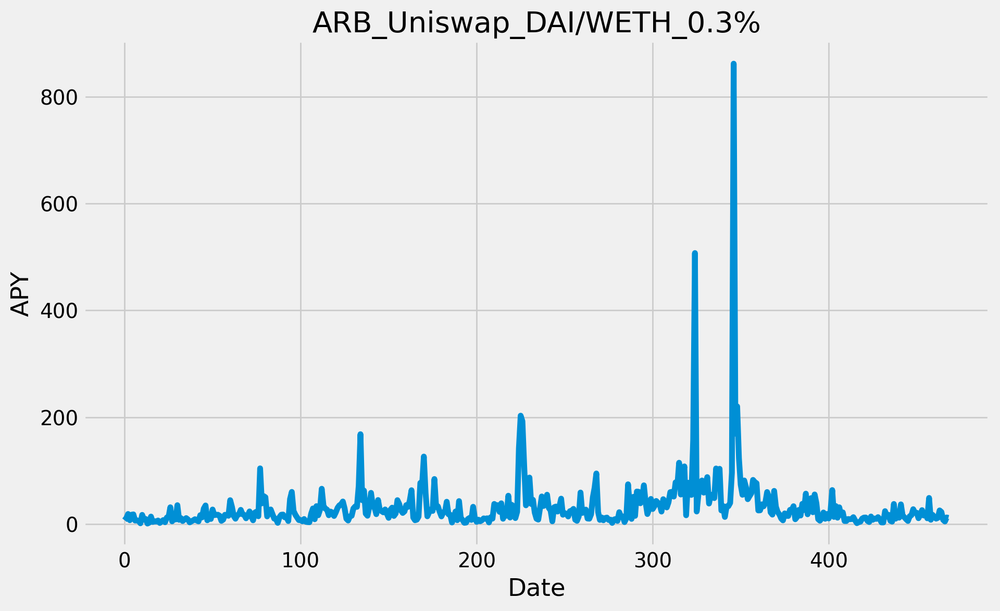

In [1856]:
# Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(ARB_Uniswap_DAI_WETH_03['apy'])

# Customize the chart
plt.title('ARB_Uniswap_DAI/WETH_0.3%')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show()

In [1857]:
## ARB_Camelotv2_USDC/WETH
is_true = ((df.project == 'camelot-v2') &
           df.symbol.isin(['WETH-USDC']) &
           df.chain.isin(['Arbitrum']))
cols = ['chain', 'project', 'symbol', 'pool', 'tvlUsd', 'apyBase', 'apy', 'apyPct7D', 'apyPct30D', 'apyBase7d', 'apyMean30d', 'volumeUsd7d',
        'mu', 'sigma']
df.loc[is_true, cols].sort_values('apy', ascending=False)


,chain,project,symbol,pool,tvlUsd,apyBase,apy,apyPct7D,apyPct30D,apyBase7d,apyMean30d,volumeUsd7d,mu,sigma
1121,Arbitrum,camelot-v2,WETH-USDC,4606a6d6-445d-4338-81bf-e96c38196bcb,2615300,7.3452,9.5662%,-16.7619,-18.3775,18.4276,14.6003,"3,089,331.9650",25.1976,0.7941


In [1858]:
#get historical data
ARB_Camelotv2_USDC_WETH=obj.get_pool_hist_apy('4606a6d6-445d-4338-81bf-e96c38196bcb')
ARB_Camelotv2_USDC_WETH.reset_index(inplace=True)
ARB_Camelotv2_USDC_WETH['date'] = pd.to_datetime(ARB_Camelotv2_USDC_WETH['date']).dt.strftime('%Y-%m-%d')
ARB_Camelotv2_USDC_WETH.to_excel(writer, sheet_name='ARB_Camelotv2_USDC_WETH', index=False)

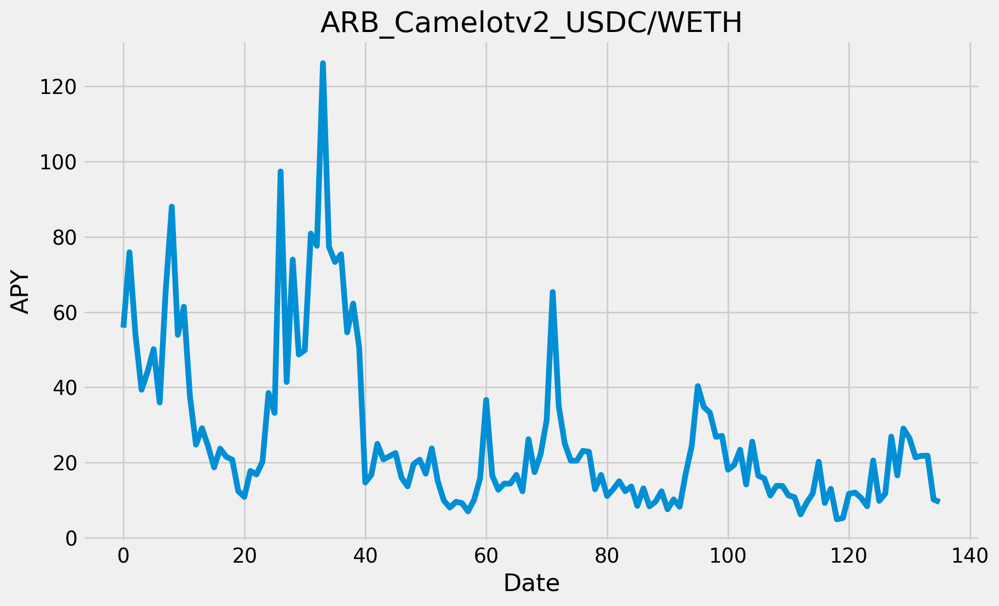

In [1859]:
# Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(ARB_Camelotv2_USDC_WETH['apy'])

# Customize the chart
plt.title('ARB_Camelotv2_USDC/WETH')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show()

In [1860]:
## Trader Joe ETH/USDC

In [1861]:
## ARB_Kyberswap_WETH/USDC
is_true = ((df.project == 'kyberswap-elastic') &
           df.symbol.isin(['WETH-USDC']) &
           df.chain.isin(['Arbitrum']))
cols = ['chain', 'project', 'symbol', 'pool', 'tvlUsd', 'apyBase', 'apy', 'apyPct7D', 'apyPct30D', 'apyBase7d', 'apyMean30d', 'volumeUsd7d',
        'mu', 'sigma']
df.loc[is_true, cols].sort_values('apy', ascending=False)

,chain,project,symbol,pool,tvlUsd,apyBase,apy,apyPct7D,apyPct30D,apyBase7d,apyMean30d,volumeUsd7d,mu,sigma
1546,Arbitrum,kyberswap-elastic,WETH-USDC,4998cabc-a0e1-47a3-8208-bc367884b02d,1547604,18.2942,46.30445%,-7.0932,-14.4427,NaN,54.2234,NaN,52.4092,0.4301
4515,Arbitrum,kyberswap-elastic,WETH-USDC,e6a6e059-de54-4c19-bb0e-500a20e6056a,224579,0.0000,30.15951%,-60.3830,-112.3870,NaN,56.1421,NaN,49.1744,1.2312


In [1862]:
#get historical data
ARB_Kyberswap_WETH_USDC_1=obj.get_pool_hist_apy('e6a6e059-de54-4c19-bb0e-500a20e6056a')
ARB_Kyberswap_WETH_USDC_1.reset_index(inplace=True)
ARB_Kyberswap_WETH_USDC_1['date'] = pd.to_datetime(ARB_Kyberswap_WETH_USDC_1['date']).dt.strftime('%Y-%m-%d')
ARB_Kyberswap_WETH_USDC_1.to_excel(writer, sheet_name='ARB_Kyberswap_WETH_USDC#1', index=False)

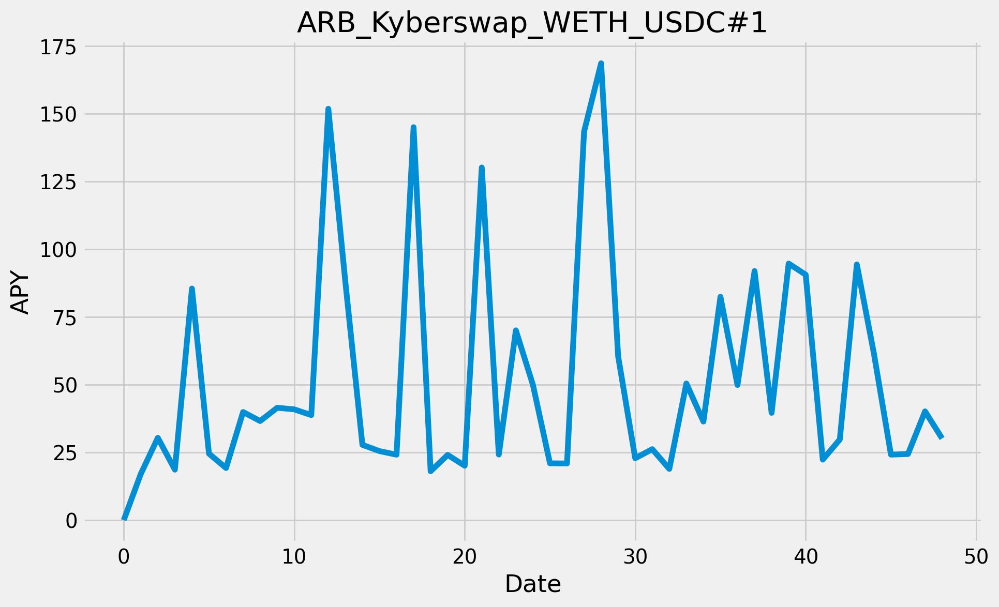

In [1863]:
# Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(ARB_Kyberswap_WETH_USDC_1['apy'])

# Customize the chart
plt.title('ARB_Kyberswap_WETH_USDC#1')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show()

In [1864]:
#get historical data
ARB_Camelotv2_USDC_WETH_2=obj.get_pool_hist_apy('4998cabc-a0e1-47a3-8208-bc367884b02d')
ARB_Camelotv2_USDC_WETH_2.reset_index(inplace=True)
ARB_Camelotv2_USDC_WETH_2['date'] = pd.to_datetime(ARB_Camelotv2_USDC_WETH_2['date']).dt.strftime('%Y-%m-%d')
ARB_Camelotv2_USDC_WETH_2.to_excel(writer, sheet_name='ARB_Kyberswap_WETH_USDC#2', index=False)

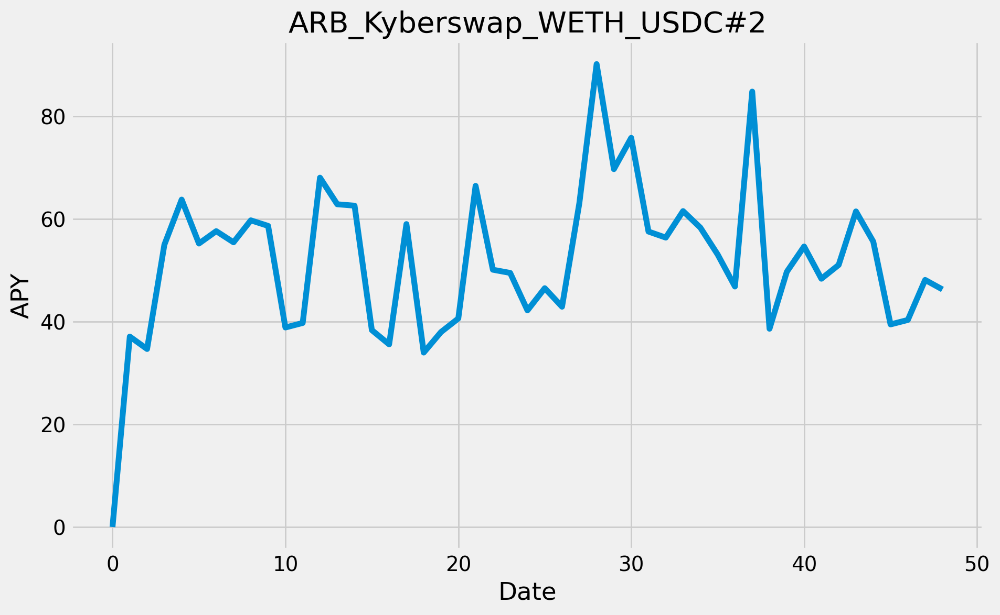

In [1865]:
# Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(ARB_Camelotv2_USDC_WETH_2['apy'])

# Customize the chart
plt.title('ARB_Kyberswap_WETH_USDC#2')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show()

In [1866]:
## ARB_Camelotv2_USDC/ARB
is_true = ((df.project == 'camelot-v2') &
           df.symbol.isin(['USDC-ARB']) &
           df.chain.isin(['Arbitrum']))
cols = ['chain', 'project', 'symbol', 'pool', 'tvlUsd', 'apyBase', 'apy', 'apyPct7D', 'apyPct30D', 'apyBase7d', 'apyMean30d', 'volumeUsd7d',
        'mu', 'sigma']
df.loc[is_true, cols].sort_values('apy', ascending=False)

,chain,project,symbol,pool,tvlUsd,apyBase,apy,apyPct7D,apyPct30D,apyBase7d,apyMean30d,volumeUsd7d,mu,sigma


In [1867]:
## OPT_Velodrome_USDC/WETH
is_true = ((df.project == 'velodrome') &
           df.symbol.isin(['WETH-USDC']) &
           df.chain.isin(['Optimism']))
cols = ['chain', 'project', 'symbol', 'pool', 'tvlUsd', 'apyBase', 'apy', 'apyPct7D', 'apyPct30D', 'apyBase7d', 'apyMean30d', 'volumeUsd7d',
        'mu', 'sigma']
df.loc[is_true, cols].sort_values('apy', ascending=False)

,chain,project,symbol,pool,tvlUsd,apyBase,apy,apyPct7D,apyPct30D,apyBase7d,apyMean30d,volumeUsd7d,mu,sigma
3788,Optimism,velodrome,WETH-USDC,c51d789f-0a76-4dea-b201-63687bee5b17,316546,NaN,3.14116%,-15.5660,-7.3883,NaN,10.1917,NaN,17.3086,0.2926


In [1868]:
#get historical data
OPT_Velodrome_USDC_WETH=obj.get_pool_hist_apy('c51d789f-0a76-4dea-b201-63687bee5b17')
OPT_Velodrome_USDC_WETH.reset_index(inplace=True)
OPT_Velodrome_USDC_WETH['date'] = pd.to_datetime(OPT_Velodrome_USDC_WETH['date']).dt.strftime('%Y-%m-%d')
OPT_Velodrome_USDC_WETH.to_excel(writer, sheet_name='OPT_Velodrome_USDC_WETH', index=False)

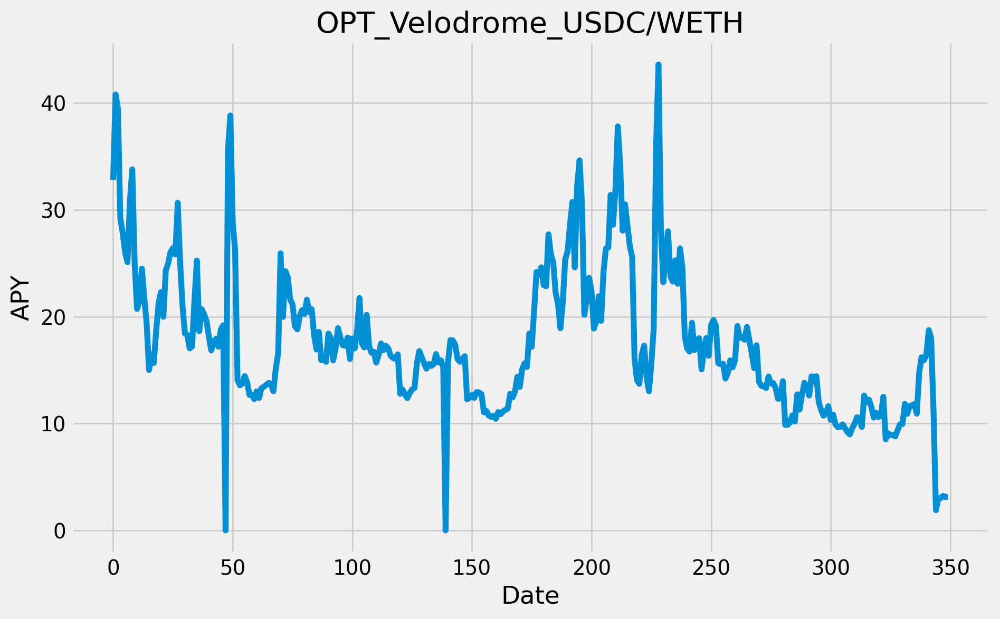

In [1869]:
# Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(OPT_Velodrome_USDC_WETH['apy'])

# Customize the chart
plt.title('OPT_Velodrome_USDC/WETH')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show()

In [1870]:
## OPT_Velodrome_OP/USDC
is_true = ((df.project == 'velodrome') &
           df.symbol.isin(['OP-USDC']) &
           df.chain.isin(['Optimism']))
cols = ['chain', 'project', 'symbol', 'pool', 'tvlUsd', 'apyBase', 'apy', 'apyPct7D', 'apyPct30D', 'apyBase7d', 'apyMean30d', 'volumeUsd7d',
        'mu', 'sigma']
df.loc[is_true, cols].sort_values('apy', ascending=False)

,chain,project,symbol,pool,tvlUsd,apyBase,apy,apyPct7D,apyPct30D,apyBase7d,apyMean30d,volumeUsd7d,mu,sigma
3185,Optimism,velodrome,OP-USDC,5f12da6d-a4ba-41ba-908d-deeb22037da4,435886,NaN,10.39061%,-10.5351,-13.2522,NaN,21.8508,NaN,36.9932,0.6081


In [1871]:
#get historical data
OPT_Velodrome_OP_USDC=obj.get_pool_hist_apy('5f12da6d-a4ba-41ba-908d-deeb22037da4')
OPT_Velodrome_OP_USDC.reset_index(inplace=True)
OPT_Velodrome_OP_USDC['date'] = pd.to_datetime(OPT_Velodrome_OP_USDC['date']).dt.strftime('%Y-%m-%d')
OPT_Velodrome_OP_USDC.to_excel(writer, sheet_name='OPT_Velodrome_OP_USDC', index=False)

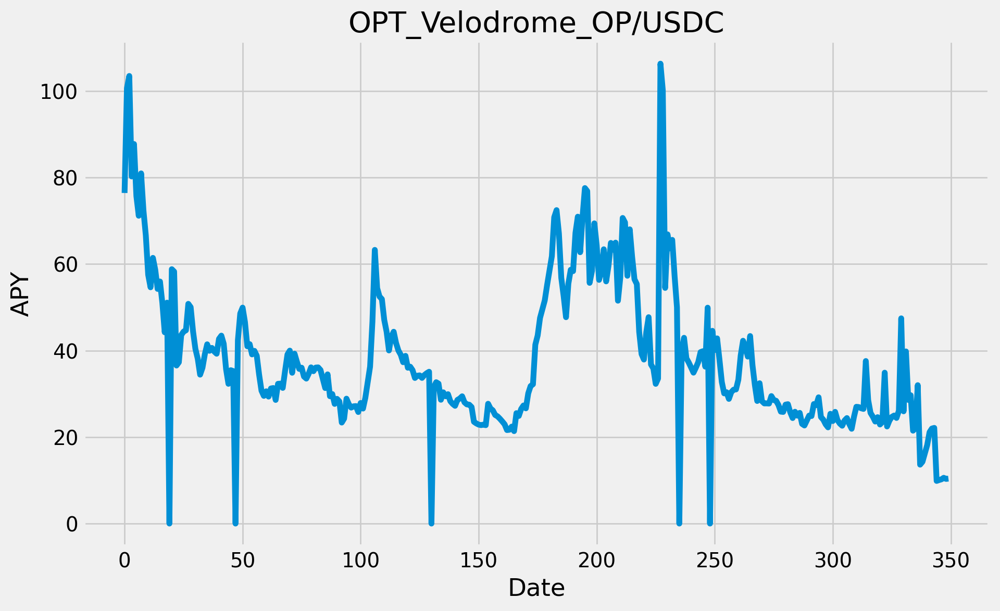

In [1872]:
# Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(OPT_Velodrome_OP_USDC['apy'])

# Customize the chart
plt.title('OPT_Velodrome_OP/USDC')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show()

In [1873]:
## OPT_Kyberswap_WETH/USDC
is_true = ((df.project == 'kyberswap-elastic') &
           df.symbol.isin(['WETH-USDC']) &
           df.chain.isin(['Optimism']))
cols = ['chain', 'project', 'symbol', 'pool', 'tvlUsd', 'apyBase', 'apy', 'apyPct7D', 'apyPct30D', 'apyBase7d', 'apyMean30d', 'volumeUsd7d',
        'mu', 'sigma']
df.loc[is_true, cols].sort_values('apy', ascending=False)

,chain,project,symbol,pool,tvlUsd,apyBase,apy,apyPct7D,apyPct30D,apyBase7d,apyMean30d,volumeUsd7d,mu,sigma
3026,Optimism,kyberswap-elastic,WETH-USDC,4ac77141-63ae-4cc3-9ea8-7e320db1f5eb,488673,27.5948,49.81163%,11.6438,-46.5317,NaN,53.5876,NaN,57.5860,0.9581
2936,Optimism,kyberswap-elastic,WETH-USDC,7f77324b-661d-4f74-bbe3-b0e5c29292ca,516414,20.9818,48.59636%,3.1594,-9.2276,NaN,56.9177,NaN,57.6100,0.4785


In [1874]:
#get historical data
OPT_Kyberswap_WETH_USDC_1=obj.get_pool_hist_apy('7f77324b-661d-4f74-bbe3-b0e5c29292ca')
OPT_Kyberswap_WETH_USDC_1.reset_index(inplace=True)
OPT_Kyberswap_WETH_USDC_1['date'] = pd.to_datetime(OPT_Kyberswap_WETH_USDC_1['date']).dt.strftime('%Y-%m-%d')
OPT_Kyberswap_WETH_USDC_1.to_excel(writer, sheet_name='OPT_Kyberswap_WETH_USDC#1', index=False)

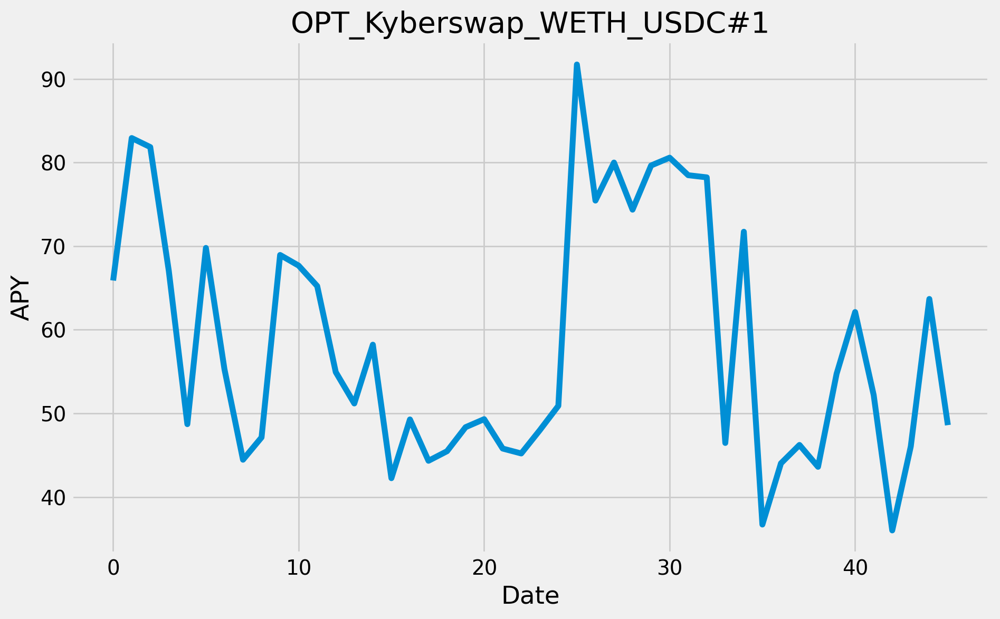

In [1875]:
# Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(OPT_Kyberswap_WETH_USDC_1['apy'])

# Customize the chart
plt.title('OPT_Kyberswap_WETH_USDC#1')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show()

In [1876]:
#get historical data
OPT_Kyberswap_WETH_USDC_2=obj.get_pool_hist_apy('4ac77141-63ae-4cc3-9ea8-7e320db1f5eb')
OPT_Kyberswap_WETH_USDC_2.reset_index(inplace=True)
OPT_Kyberswap_WETH_USDC_2['date'] = pd.to_datetime(OPT_Kyberswap_WETH_USDC_2['date']).dt.strftime('%Y-%m-%d')
OPT_Kyberswap_WETH_USDC_2.to_excel(writer, sheet_name='OPT_Kyberswap_WETH_USDC#2', index=False)

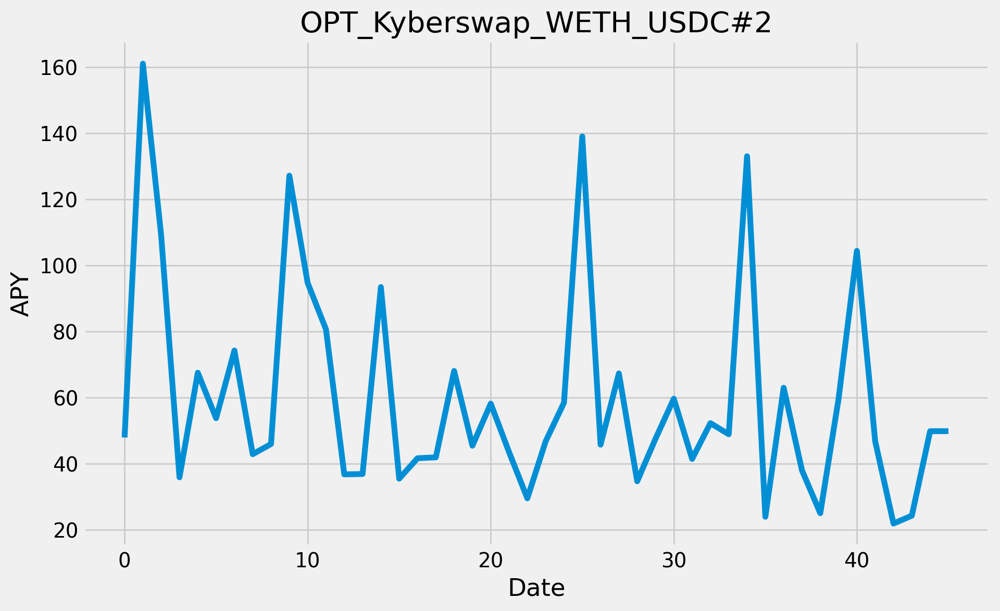

In [1877]:
# Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(OPT_Kyberswap_WETH_USDC_2['apy'])

# Customize the chart
plt.title('OPT_Kyberswap_WETH_USDC#2')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show()

In [1878]:
## OPT_Kyberswap_OP/USDC
is_true = ((df.project == 'kyberswap-elastic') &
           df.symbol.isin(['OP-USDC']) &
           df.chain.isin(['Optimism']))
cols = ['chain', 'project', 'symbol', 'pool', 'tvlUsd', 'apyBase', 'apy', 'apyPct7D', 'apyPct30D', 'apyBase7d', 'apyMean30d', 'volumeUsd7d',
        'mu', 'sigma']
df.loc[is_true, cols].sort_values('apy', ascending=False)

,chain,project,symbol,pool,tvlUsd,apyBase,apy,apyPct7D,apyPct30D,apyBase7d,apyMean30d,volumeUsd7d,mu,sigma
3132,Optimism,kyberswap-elastic,OP-USDC,c8ee45f2-fe20-43f6-814c-555283f0ffe0,451393,70.4747,113.8428%,22.9859,-90.3539,NaN,135.9819,NaN,155.6351,1.5988


In [1879]:
#get historical data
OPT_Kyberswap_OP_USDC=obj.get_pool_hist_apy('c8ee45f2-fe20-43f6-814c-555283f0ffe0')
OPT_Kyberswap_OP_USDC.reset_index(inplace=True)
OPT_Kyberswap_OP_USDC['date'] = pd.to_datetime(OPT_Kyberswap_OP_USDC['date']).dt.strftime('%Y-%m-%d')
OPT_Kyberswap_OP_USDC.to_excel(writer, sheet_name='OPT_Kyberswap_OP_USDC', index=False)

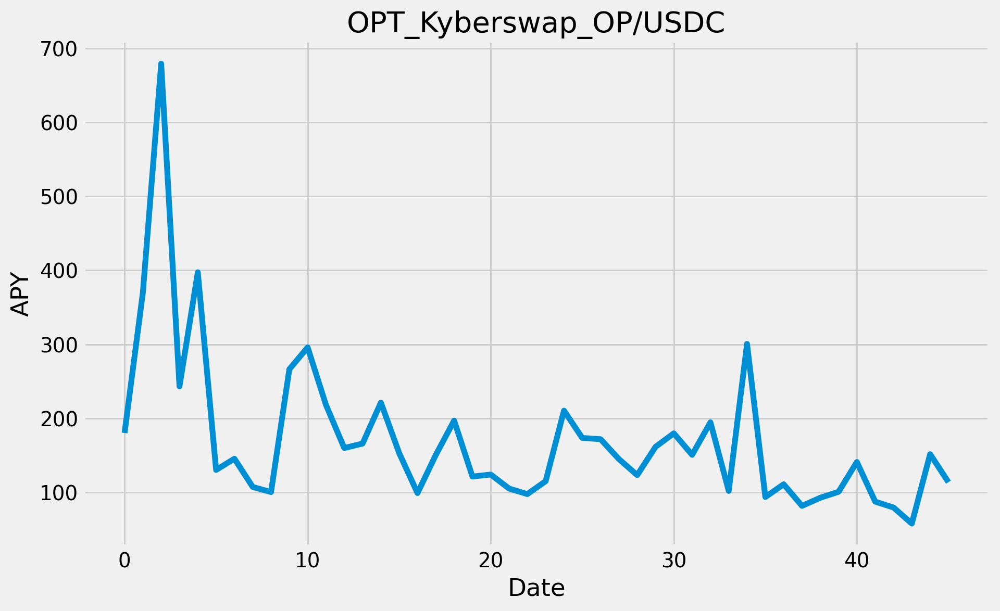

In [1880]:
# Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(OPT_Kyberswap_OP_USDC['apy'])

# Customize the chart
plt.title('OPT_Kyberswap_OP/USDC')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show()

## ETH LSD Rates

In [1881]:
## Lido_stETH
is_true = (df.symbol.isin(['STETH']) &
           df.project.isin(['lido']) &
           df.chain.isin(['Ethereum']))
cols = ['chain', 'project', 'symbol', 'pool', 'tvlUsd', 'apyBase', 'apy', 'apyPct7D', 'apyPct30D', 'apyBase7d', 'apyMean30d', 'volumeUsd7d',
        'mu', 'sigma']
df.loc[is_true, cols].sort_values('apy', ascending=False)

,chain,project,symbol,pool,tvlUsd,apyBase,apy,apyPct7D,apyPct30D,apyBase7d,apyMean30d,volumeUsd7d,mu,sigma
0,Ethereum,lido,STETH,747c1d2a-c668-4682-b9f9-296708a3dd90,14304322831,3.9000,3.9%,-0.1000,-0.2000,NaN,3.8868,NaN,4.6746,0.0493


In [1882]:
#get historical data
Lido_stETH=obj.get_pool_hist_apy('747c1d2a-c668-4682-b9f9-296708a3dd90')
Lido_stETH.reset_index(inplace=True)
Lido_stETH['date'] = pd.to_datetime(Lido_stETH['date']).dt.strftime('%Y-%m-%d')
Lido_stETH.to_excel(writer, sheet_name='Lido_stETH', index=False)

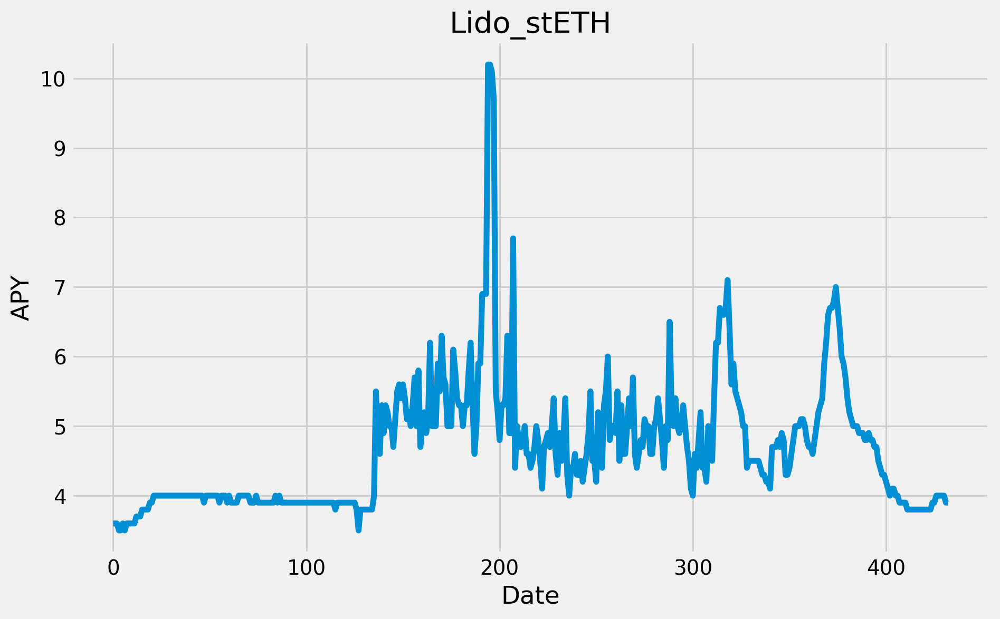

In [1883]:
# Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(Lido_stETH['apy'])

# Customize the chart
plt.title('Lido_stETH')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show()

In [1884]:
## Lido_rETH
is_true = (df.symbol.isin(['RETH']) &
           df.project.isin(['rocket-pool']) &
           df.chain.isin(['Ethereum']))
cols = ['chain', 'project', 'symbol', 'pool', 'tvlUsd', 'apyBase', 'apy', 'apyPct7D', 'apyPct30D', 'apyBase7d', 'apyMean30d', 'volumeUsd7d',
        'mu', 'sigma']
df.loc[is_true, cols].sort_values('apy', ascending=False)

,chain,project,symbol,pool,tvlUsd,apyBase,apy,apyPct7D,apyPct30D,apyBase7d,apyMean30d,volumeUsd7d,mu,sigma
8,Ethereum,rocket-pool,RETH,d4b3c522-6127-4b89-bedf-83641cdcd2eb,1537710641,3.3008,3.30077%,0.0909,0.0905,NaN,3.1202,NaN,4.2630,0.0398


In [1885]:
#get historical data
Lido_rETH=obj.get_pool_hist_apy('d4b3c522-6127-4b89-bedf-83641cdcd2eb')
Lido_rETH.reset_index(inplace=True)
Lido_rETH['date'] = pd.to_datetime(Lido_rETH['date']).dt.strftime('%Y-%m-%d')
Lido_rETH.to_excel(writer, sheet_name='Lido_rETH', index=False)

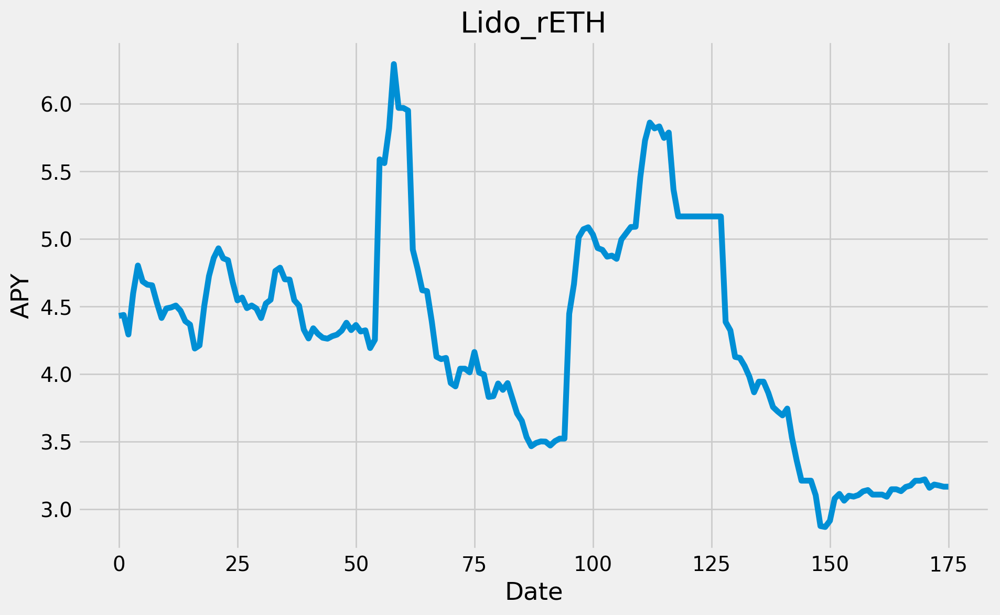

In [1886]:
# Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(Lido_rETH['apy'])

# Customize the chart
plt.title('Lido_rETH')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show()

In [1887]:
## Lido_frxETH
is_true = (df.symbol.isin(['FRXETH']) &
           df.chain.isin(['Ethereum']))
cols = ['chain', 'project', 'symbol', 'pool', 'tvlUsd', 'apyBase', 'apy', 'apyPct7D', 'apyPct30D', 'apyBase7d', 'apyMean30d', 'volumeUsd7d',
        'mu', 'sigma']
df.loc[is_true, cols].sort_values('apy', ascending=False)

,chain,project,symbol,pool,tvlUsd,apyBase,apy,apyPct7D,apyPct30D,apyBase7d,apyMean30d,volumeUsd7d,mu,sigma
995,Ethereum,stakedao,FRXETH,c7f8d63e-bb79-4917-b537-913c2ee84e4a,3120100,0.0000,7.68146%,0.8337,-1.2540,NaN,7.6939,NaN,16.4479,0.4416


In [1888]:
#get historical data
Lido_frxETH=obj.get_pool_hist_apy('c7f8d63e-bb79-4917-b537-913c2ee84e4a')
Lido_frxETH.reset_index(inplace=True)
Lido_frxETH['date'] = pd.to_datetime(Lido_frxETH['date']).dt.strftime('%Y-%m-%d')
Lido_frxETH.to_excel(writer, sheet_name='Lido_frxETH', index=False)

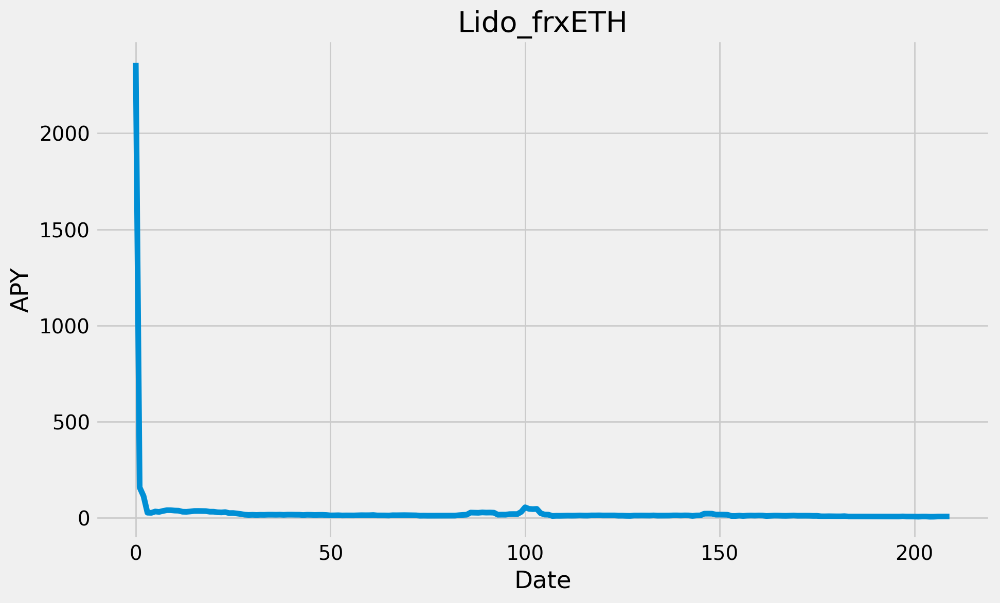

In [1889]:
# Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(Lido_frxETH['apy'])

# Customize the chart
plt.title('Lido_frxETH')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show()

## Crypto Deposit Rates

In [1890]:
#ETH_Aave_wETH
is_true = ((df.project == 'aave-v3') &
          (df.exposure == 'single')&
           df.symbol.isin(['WETH']) &
           df.chain.isin(['Ethereum']))
cols = ['chain', 'project', 'symbol', 'pool', 'tvlUsd', 'apyBase', 'apy', 'apyPct7D', 'apyPct30D', 'apyBase7d', 'apyMean30d', 'volumeUsd7d',
        'mu', 'sigma']
df.loc[is_true, cols].sort_values('apy', ascending=False)

,chain,project,symbol,pool,tvlUsd,apyBase,apy,apyPct7D,apyPct30D,apyBase7d,apyMean30d,volumeUsd7d,mu,sigma
39,Ethereum,aave-v3,WETH,e880e828-ca59-4ec6-8d4f-27182a4dc23d,235139737,1.8359,1.83592%,0.2324,-0.0107,NaN,1.7113,NaN,1.9582,0.0164


In [1891]:
#get historical data
ETH_Aave_wETH=obj.get_pool_hist_apy('e880e828-ca59-4ec6-8d4f-27182a4dc23d')
ETH_Aave_wETH.reset_index(inplace=True)
ETH_Aave_wETH['date'] = pd.to_datetime(ETH_Aave_wETH['date']).dt.strftime('%Y-%m-%d')
ETH_Aave_wETH.to_excel(writer, sheet_name='ETH_Aave_wETH', index=False)

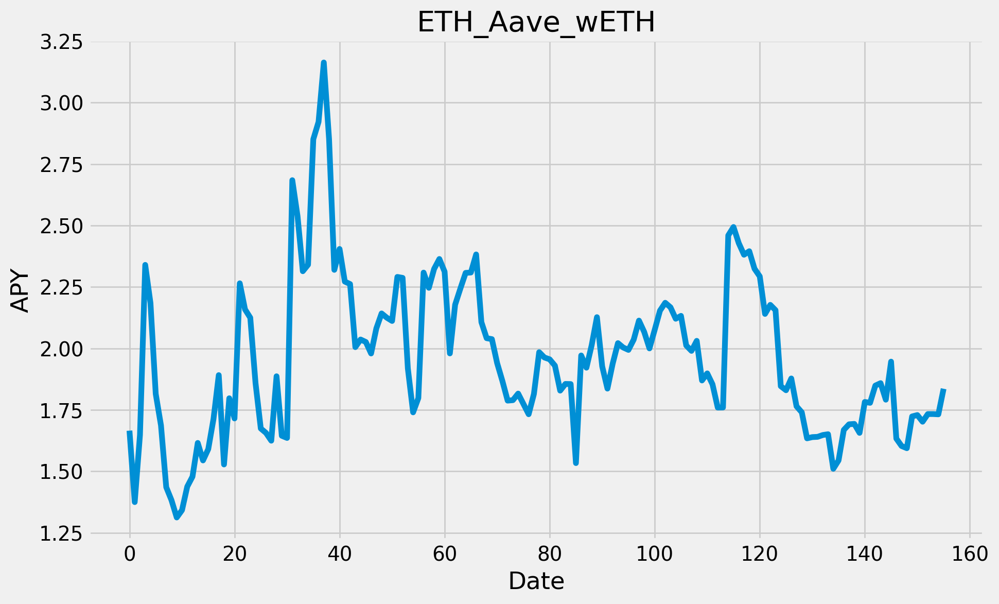

In [1892]:
# Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(ETH_Aave_wETH['apy'])

# Customize the chart
plt.title('ETH_Aave_wETH')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show()

In [1893]:
#ETH_Aave_wBTC
is_true = ((df.project == 'aave-v3') &
          (df.exposure == 'single')&
           df.symbol.isin(['WBTC']) &
           df.chain.isin(['Ethereum']))
cols = ['chain', 'project', 'symbol', 'pool', 'tvlUsd', 'apyBase', 'apy', 'apyPct7D', 'apyPct30D', 'apyBase7d', 'apyMean30d', 'volumeUsd7d',
        'mu', 'sigma']
df.loc[is_true, cols].sort_values('apy', ascending=False)

,chain,project,symbol,pool,tvlUsd,apyBase,apy,apyPct7D,apyPct30D,apyBase7d,apyMean30d,volumeUsd7d,mu,sigma
46,Ethereum,aave-v3,WBTC,7e382157-b1bc-406d-b17b-facba43b716e,206116337,0.0628,0.06283%,-0.2508,-0.5523,NaN,0.4287,NaN,0.2314,0.0122


In [1894]:
#get historical data
ETH_Aave_wBTC=obj.get_pool_hist_apy('7e382157-b1bc-406d-b17b-facba43b716e')
ETH_Aave_wBTC.reset_index(inplace=True)
ETH_Aave_wBTC['date'] = pd.to_datetime(ETH_Aave_wBTC['date']).dt.strftime('%Y-%m-%d')
ETH_Aave_wBTC.to_excel(writer, sheet_name='ETH_Aave_wBTC', index=False)

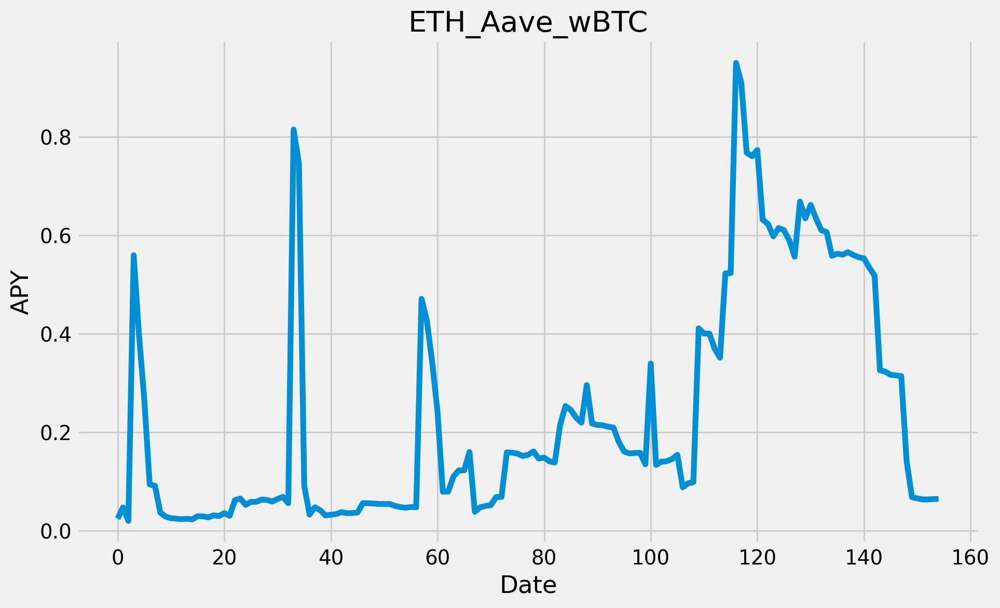

In [1895]:
# Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(ETH_Aave_wBTC['apy'])

# Customize the chart
plt.title('ETH_Aave_wBTC')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show()

In [1896]:
#ARB_Aave_wETH
is_true = ((df.project == 'aave-v3') &
          (df.exposure == 'single')&
           df.symbol.isin(['WETH']) &
           df.chain.isin(['Arbitrum']))
cols = ['chain', 'project', 'symbol', 'pool', 'tvlUsd', 'apyBase', 'apy', 'apyPct7D', 'apyPct30D', 'apyBase7d', 'apyMean30d', 'volumeUsd7d',
        'mu', 'sigma']
df.loc[is_true, cols].sort_values('apy', ascending=False)

,chain,project,symbol,pool,tvlUsd,apyBase,apy,apyPct7D,apyPct30D,apyBase7d,apyMean30d,volumeUsd7d,mu,sigma
156,Arbitrum,aave-v3,WETH,e302de4d-952e-4e18-9749-0a9dc86e98bc,46186528,1.1671,1.16706%,-0.0271,-0.3519,NaN,1.3144,NaN,0.7857,0.0190


In [1897]:
#get historical data
ARB_Aave_wETH=obj.get_pool_hist_apy('e302de4d-952e-4e18-9749-0a9dc86e98bc')
ARB_Aave_wETH.reset_index(inplace=True)
ARB_Aave_wETH['date'] = pd.to_datetime(ARB_Aave_wETH['date']).dt.strftime('%Y-%m-%d')
ARB_Aave_wETH.to_excel(writer, sheet_name='ARB_Aave_wETH', index=False)

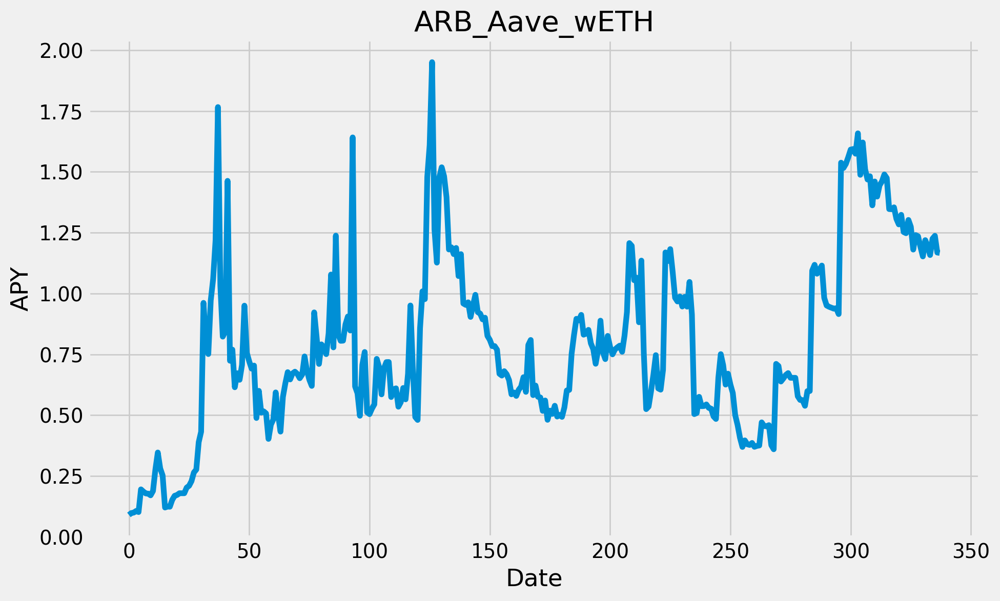

In [1898]:
# Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(ARB_Aave_wETH['apy'])

# Customize the chart
plt.title('ARB_Aave_wETH')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show()

In [1899]:
#ARB_Radiant_wETH
is_true = ((df.project == 'radiant-v2') &
           df.symbol.isin(['WETH']) &
           df.chain.isin(['Arbitrum']))
cols = ['chain', 'project', 'symbol', 'pool', 'tvlUsd', 'apyBase', 'apy', 'apyPct7D', 'apyPct30D', 'apyBase7d', 'apyMean30d', 'volumeUsd7d',
        'mu', 'sigma']
df.loc[is_true, cols].sort_values('apy', ascending=False)

,chain,project,symbol,pool,tvlUsd,apyBase,apy,apyPct7D,apyPct30D,apyBase7d,apyMean30d,volumeUsd7d,mu,sigma
109,Arbitrum,radiant-v2,WETH,d1080bb3-9850-4fd9-800c-50602a1441ad,61876831,1.2363,1.23634%,-0.1425,NaN,NaN,1.3419,NaN,1.3364,0.0036


In [1900]:
#get historical data
ARB_Radiant_wETH=obj.get_pool_hist_apy('d1080bb3-9850-4fd9-800c-50602a1441ad')
ARB_Radiant_wETH.reset_index(inplace=True)
ARB_Radiant_wETH['date'] = pd.to_datetime(ARB_Radiant_wETH['date']).dt.strftime('%Y-%m-%d')
ARB_Radiant_wETH.to_excel(writer, sheet_name='ARB_Radiant_wETH', index=False)

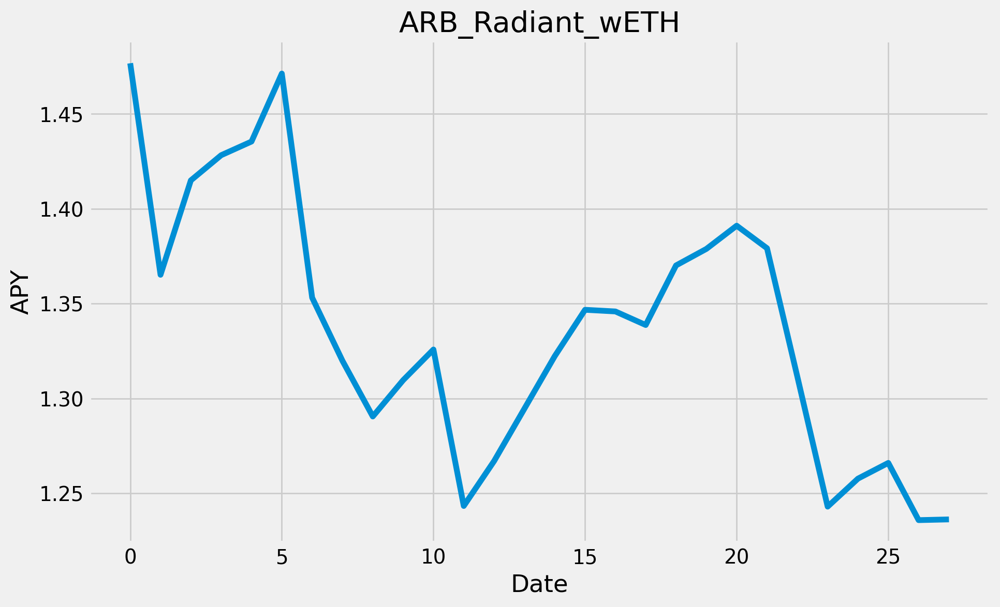

In [1901]:
# Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(ARB_Radiant_wETH['apy'])

# Customize the chart
plt.title('ARB_Radiant_wETH')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show()

In [1902]:
#ARB_Radiant_wstETH
is_true = ((df.project == 'radiant-v2') &
           df.symbol.isin(['WSTETH']) &
           df.chain.isin(['Arbitrum']))
ccols = ['chain', 'project', 'symbol', 'pool', 'tvlUsd', 'apyBase', 'apy', 'apyPct7D', 'apyPct30D', 'apyBase7d', 'apyMean30d', 'volumeUsd7d',
        'mu', 'sigma']
df.loc[is_true, cols].sort_values('apy', ascending=False)

,chain,project,symbol,pool,tvlUsd,apyBase,apy,apyPct7D,apyPct30D,apyBase7d,apyMean30d,volumeUsd7d,mu,sigma
208,Arbitrum,radiant-v2,WSTETH,845ff9e4-71ef-4ace-8f5e-e29e218b9e82,30511293,0.4889,0.48891%,-0.0789,NaN,NaN,0.5130,NaN,0.5069,0.0045


In [1903]:
#get historical data
ARB_Radiant_wstETH=obj.get_pool_hist_apy('845ff9e4-71ef-4ace-8f5e-e29e218b9e82')
ARB_Radiant_wstETH.reset_index(inplace=True)
ARB_Radiant_wstETH['date'] = pd.to_datetime(ARB_Radiant_wstETH['date']).dt.strftime('%Y-%m-%d')
ARB_Radiant_wstETH.to_excel(writer, sheet_name='ARB_Radiant_wstETH', index=False)

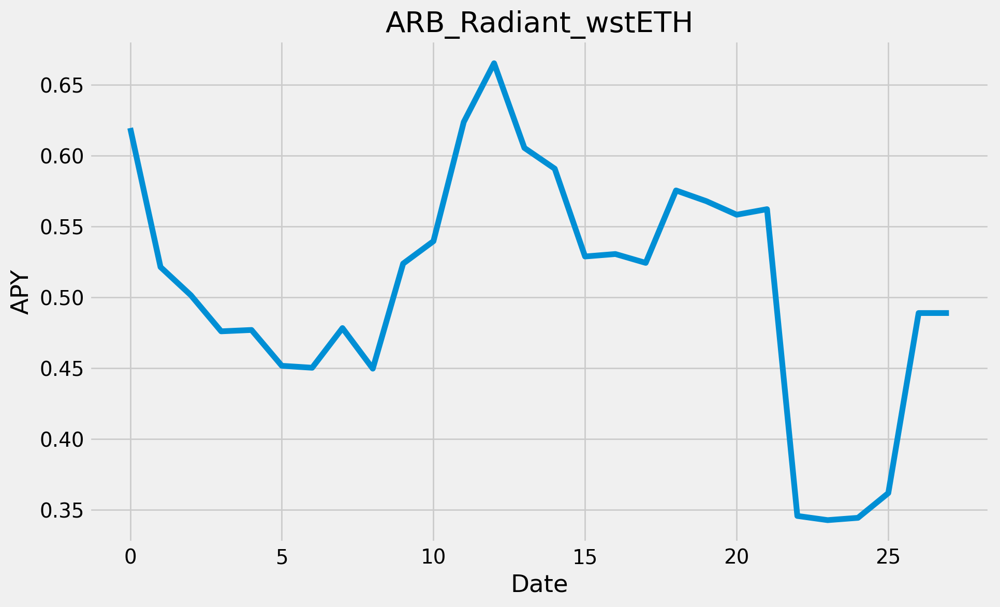

In [1904]:
# Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(ARB_Radiant_wstETH['apy'])

# Customize the chart
plt.title('ARB_Radiant_wstETH')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show()

In [1905]:
#ARB_Radiant_ARB
is_true = ((df.project == 'radiant-v2') &
           df.symbol.isin(['ARB']) &
           df.chain.isin(['Arbitrum']))
cols = ['chain', 'project', 'symbol', 'pool', 'tvlUsd', 'apyBase', 'apy', 'apyPct7D', 'apyPct30D', 'apyBase7d', 'apyMean30d', 'volumeUsd7d',
        'mu', 'sigma']
df.loc[is_true, cols].sort_values('apy', ascending=False)

,chain,project,symbol,pool,tvlUsd,apyBase,apy,apyPct7D,apyPct30D,apyBase7d,apyMean30d,volumeUsd7d,mu,sigma
328,Arbitrum,radiant-v2,ARB,ed392fd7-02b8-47bf-aec5-ab81542e7144,16444659,0.3937,0.39373%,-0.0590,NaN,NaN,0.4374,NaN,0.4358,0.0039


In [1906]:
#get historical data
ARB_Radiant_ARB=obj.get_pool_hist_apy('ed392fd7-02b8-47bf-aec5-ab81542e7144')
ARB_Radiant_ARB.reset_index(inplace=True)
ARB_Radiant_ARB['date'] = pd.to_datetime(ARB_Radiant_ARB['date']).dt.strftime('%Y-%m-%d')
ARB_Radiant_ARB.to_excel(writer, sheet_name='ARB_Radiant_ARB', index=False)

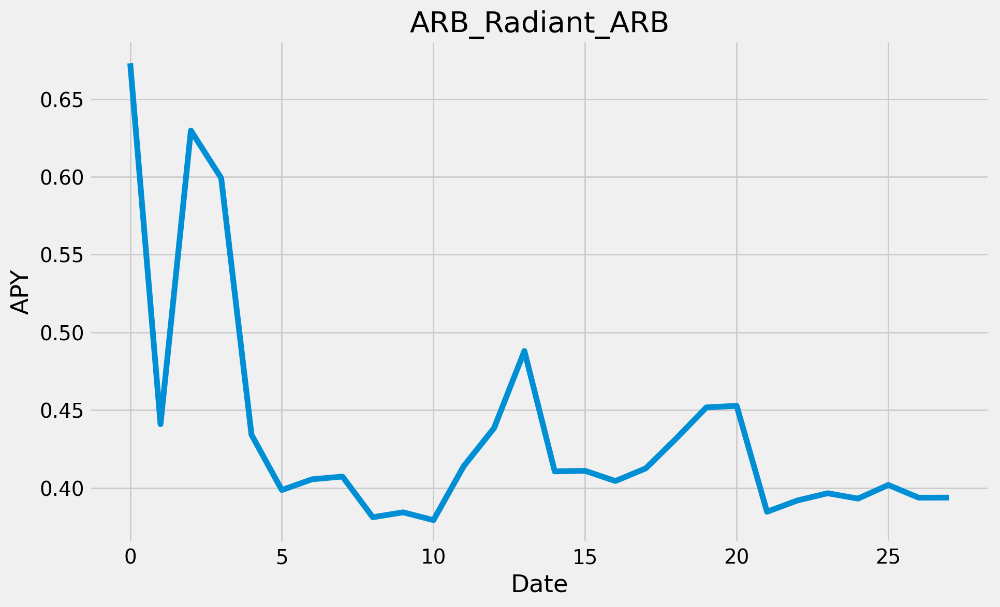

In [1907]:
# Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(ARB_Radiant_ARB['apy'])

# Customize the chart
plt.title('ARB_Radiant_ARB')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show()

In [1908]:
#OPT_Aave_wETH
is_true = ((df.project == 'aave-v3') &
          (df.exposure == 'single')&
           df.symbol.isin(['WETH']) &
           df.chain.isin(['Optimism']))
cols = ['chain', 'project', 'symbol', 'pool', 'tvlUsd', 'apyBase', 'apy', 'apyPct7D', 'apyPct30D', 'apyBase7d', 'apyMean30d', 'volumeUsd7d',
        'mu', 'sigma']
df.loc[is_true, cols].sort_values('apy', ascending=False)

,chain,project,symbol,pool,tvlUsd,apyBase,apy,apyPct7D,apyPct30D,apyBase7d,apyMean30d,volumeUsd7d,mu,sigma
292,Optimism,aave-v3,WETH,3e332a41-3a15-41bc-8d5c-438c09609349,19434726,1.2932,1.29322%,0.2996,-0.0715,NaN,1.1205,NaN,1.6604,0.0867


In [1909]:
#get historical data
OPT_Aave_wETH=obj.get_pool_hist_apy('3e332a41-3a15-41bc-8d5c-438c09609349')
OPT_Aave_wETH.reset_index(inplace=True)
OPT_Aave_wETH['date'] = pd.to_datetime(OPT_Aave_wETH['date']).dt.strftime('%Y-%m-%d')
OPT_Aave_wETH.to_excel(writer, sheet_name='OPT_Aave_wETH', index=False)

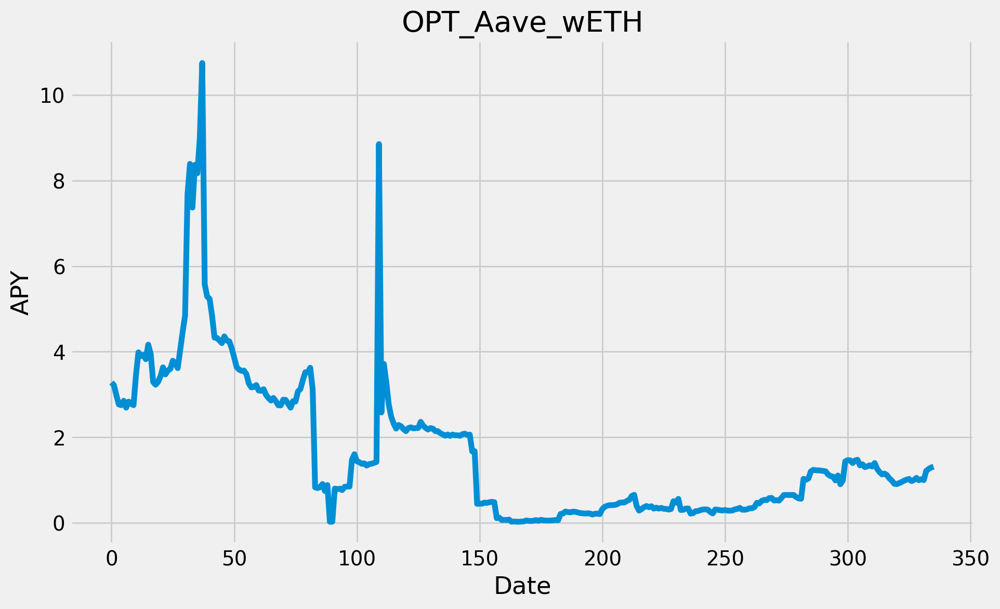

In [1910]:
# Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(OPT_Aave_wETH['apy'])

# Customize the chart
plt.title('OPT_Aave_wETH')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show()

In [1911]:
#OPT_Sonne_wETH
is_true = ((df.project == 'sonne-finance') &
           df.symbol.isin(['WETH']) &
           df.chain.isin(['Optimism']))
cols = ['chain', 'project', 'symbol', 'pool', 'tvlUsd', 'apyBase', 'apy', 'apyPct7D', 'apyPct30D', 'apyBase7d', 'apyMean30d', 'volumeUsd7d',
        'mu', 'sigma']
df.loc[is_true, cols].sort_values('apy', ascending=False)

,chain,project,symbol,pool,tvlUsd,apyBase,apy,apyPct7D,apyPct30D,apyBase7d,apyMean30d,volumeUsd7d,mu,sigma
967,Optimism,sonne-finance,WETH,3846eb20-0dd8-433a-9840-ed113420fec2,3224235,2.8276,3.09425%,-0.1774,-2.3432,NaN,3.4969,NaN,3.9886,0.0683


In [1912]:
#get historical data
OPT_Sonne_wETH=obj.get_pool_hist_apy('3846eb20-0dd8-433a-9840-ed113420fec2')
OPT_Sonne_wETH.reset_index(inplace=True)
OPT_Sonne_wETH['date'] = pd.to_datetime(OPT_Sonne_wETH['date']).dt.strftime('%Y-%m-%d')
OPT_Sonne_wETH.to_excel(writer, sheet_name='OPT_Sonne_wETH', index=False)

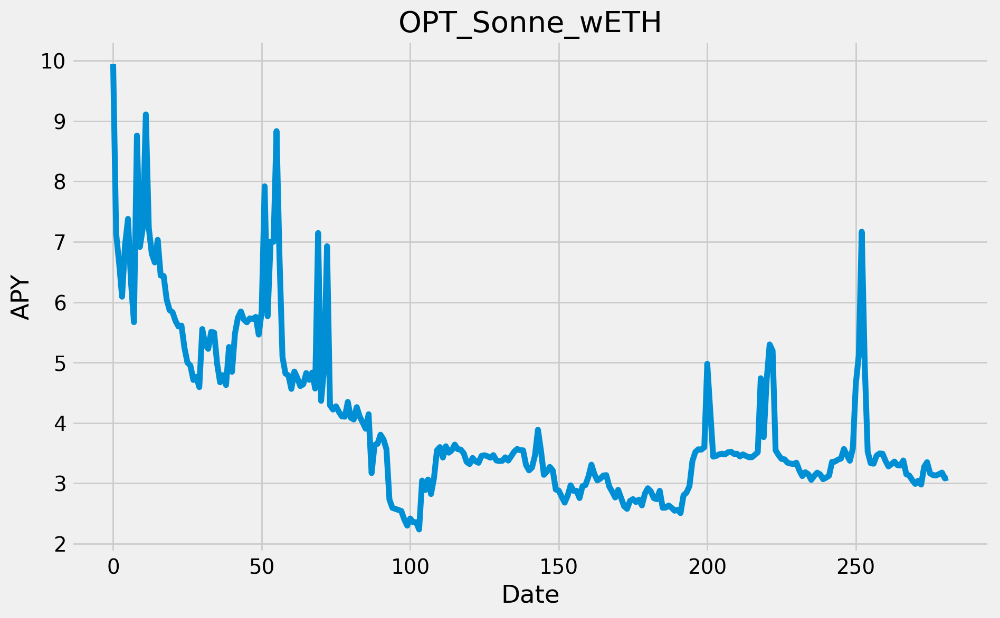

In [1913]:
# Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(OPT_Sonne_wETH['apy'])

# Customize the chart
plt.title('OPT_Sonne_wETH')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show()

In [1914]:
#OPT_Sonne_wstETH
is_true = ((df.project == 'sonne-finance') &
           df.symbol.isin(['WSTETH']) &
           df.chain.isin(['Optimism']))
cols = ['chain', 'project', 'symbol', 'pool', 'tvlUsd', 'apyBase', 'apy', 'apyPct7D', 'apyPct30D', 'apyBase7d', 'apyMean30d', 'volumeUsd7d',
        'mu', 'sigma']
df.loc[is_true, cols].sort_values('apy', ascending=False)

,chain,project,symbol,pool,tvlUsd,apyBase,apy,apyPct7D,apyPct30D,apyBase7d,apyMean30d,volumeUsd7d,mu,sigma
410,Optimism,sonne-finance,WSTETH,ef88396f-130e-477d-b9af-e568e296a5a7,10779392,1.0829,1.31915%,-0.0755,-0.1379,NaN,1.3541,NaN,2.4750,0.1057


In [1915]:
#get historical data
OPT_Sonne_wstETH=obj.get_pool_hist_apy('ef88396f-130e-477d-b9af-e568e296a5a7')
OPT_Sonne_wstETH.reset_index(inplace=True)
OPT_Sonne_wstETH['date'] = pd.to_datetime(OPT_Sonne_wstETH['date']).dt.strftime('%Y-%m-%d')
OPT_Sonne_wstETH.to_excel(writer, sheet_name='OPT_Sonne_wstETH', index=False)

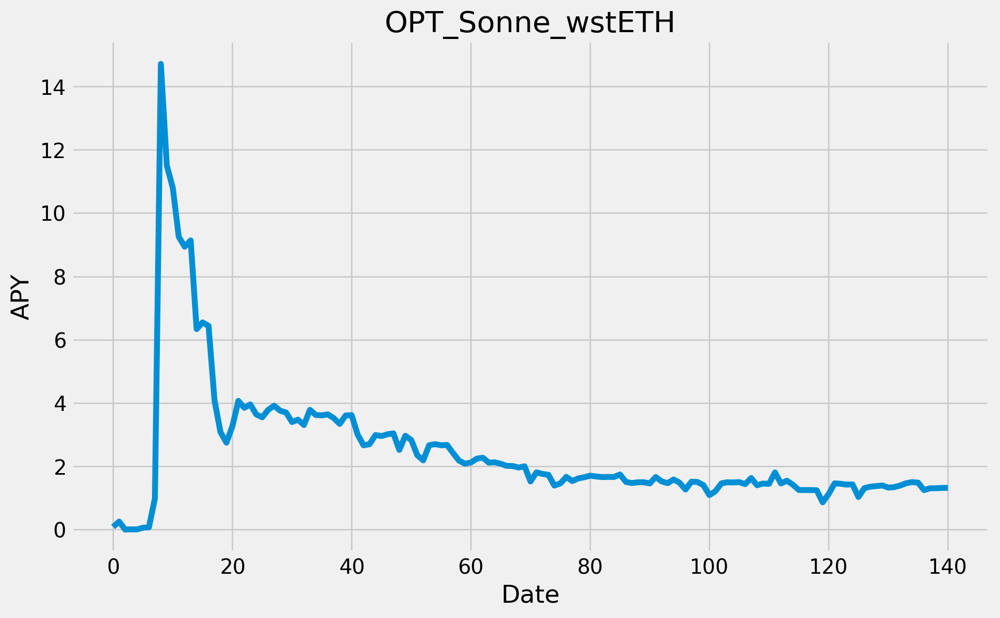

In [1916]:
# Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(OPT_Sonne_wstETH['apy'])

# Customize the chart
plt.title('OPT_Sonne_wstETH')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show()

In [1917]:
#OPT_Sonne_OP
is_true = ((df.project == 'sonne-finance') &
           df.symbol.isin(['OP']) &
           df.chain.isin(['Optimism']))
cols = ['chain', 'project', 'symbol', 'pool', 'tvlUsd', 'apyBase', 'apy', 'apyPct7D', 'apyPct30D', 'apyBase7d', 'apyMean30d', 'volumeUsd7d',
        'mu', 'sigma']
df.loc[is_true, cols].sort_values('apy', ascending=False)

,chain,project,symbol,pool,tvlUsd,apyBase,apy,apyPct7D,apyPct30D,apyBase7d,apyMean30d,volumeUsd7d,mu,sigma
1429,Optimism,sonne-finance,OP,dc9995a3-dcb1-470b-82ef-bd152b8cad08,1761811,12.6259,13.44441%,-1.7032,-3.9041,NaN,13.7547,NaN,11.8558,0.2204


In [1918]:
#get historical data
OPT_Sonne_OP=obj.get_pool_hist_apy('dc9995a3-dcb1-470b-82ef-bd152b8cad08')
OPT_Sonne_OP.reset_index(inplace=True)
OPT_Sonne_OP['date'] = pd.to_datetime(OPT_Sonne_OP['date']).dt.strftime('%Y-%m-%d')
OPT_Sonne_OP.to_excel(writer, sheet_name='OPT_Sonne_OP', index=False)

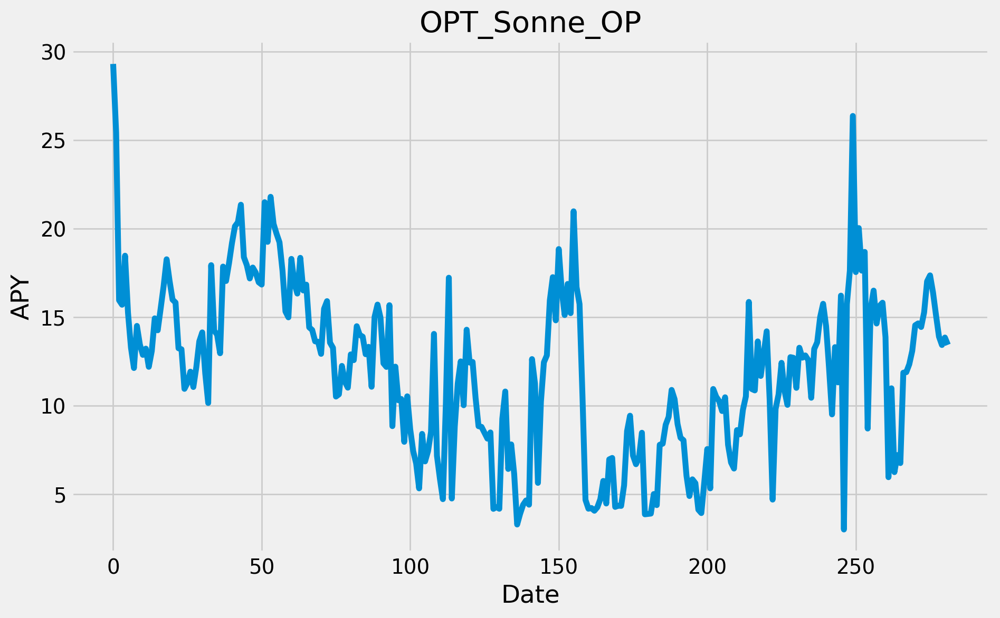

In [1919]:
# Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(OPT_Sonne_OP['apy'])

# Customize the chart
plt.title('OPT_Sonne_OP')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show()

## ETH/staked ETH Pools

In [1920]:
#Mainnet_Curve_ETH/steth
is_true = ((df.project == 'curve-dex') &
           df.symbol.isin(['ETH-STETH']) &
           df.chain.isin(['Ethereum']))
cols = ['chain', 'project', 'symbol', 'pool', 'tvlUsd', 'apyBase', 'apy', 'apyPct7D', 'apyPct30D', 'apyBase7d', 'apyMean30d', 'volumeUsd7d',
        'mu', 'sigma']
df.loc[is_true, cols].sort_values('apy', ascending=False)

,chain,project,symbol,pool,tvlUsd,apyBase,apy,apyPct7D,apyPct30D,apyBase7d,apyMean30d,volumeUsd7d,mu,sigma
95,Ethereum,curve-dex,ETH-STETH,08eaf098-4957-4922-bfca-cc0c46505a43,77130069,2.4484,2.78122%,-0.2373,-0.2793,NaN,3.2270,NaN,3.2423,0.0576
14,Ethereum,curve-dex,ETH-STETH,57d30b9c-fc66-4ac2-b666-69ad5f410cce,742256513,1.9612,1.96204%,-0.0515,-0.1768,NaN,2.0533,NaN,5.6856,1.0825


In [1921]:
#get historical data
Mainnet_Curve_ETH_steth_1=obj.get_pool_hist_apy('08eaf098-4957-4922-bfca-cc0c46505a43')
Mainnet_Curve_ETH_steth_1.reset_index(inplace=True)
Mainnet_Curve_ETH_steth_1['date'] = pd.to_datetime(Mainnet_Curve_ETH_steth_1['date']).dt.strftime('%Y-%m-%d')
Mainnet_Curve_ETH_steth_1.to_excel(writer, sheet_name='Mainnet_Curve_ETH_steth#1', index=False)

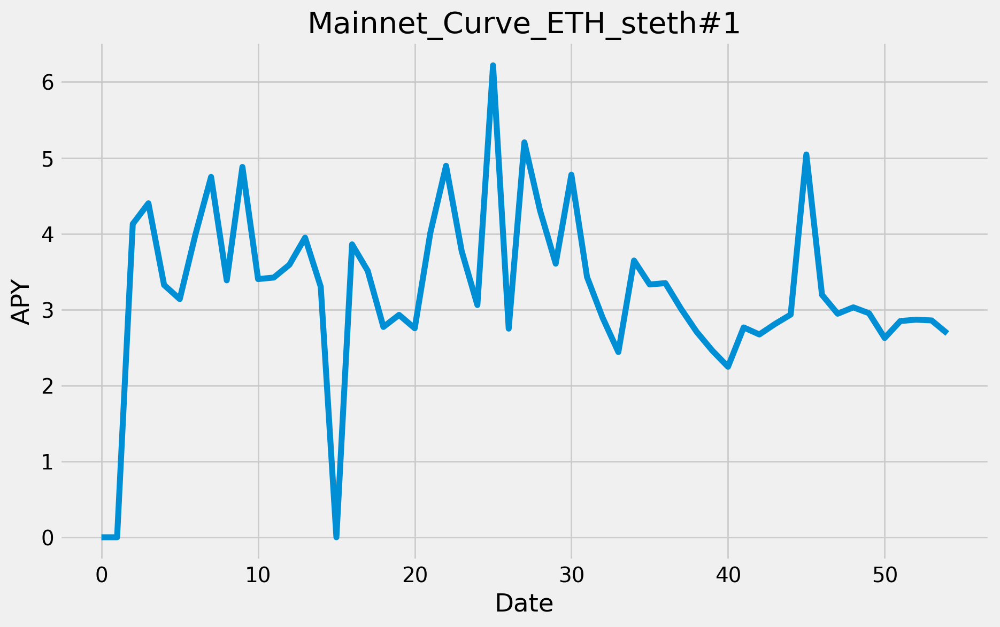

In [1922]:
# Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(Mainnet_Curve_ETH_steth_1['apy'])

# Customize the chart
plt.title('Mainnet_Curve_ETH_steth#1')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show()

In [1923]:
#get historical data
Mainnet_Curve_ETH_steth_2=obj.get_pool_hist_apy('57d30b9c-fc66-4ac2-b666-69ad5f410cce')
Mainnet_Curve_ETH_steth_2.reset_index(inplace=True)
Mainnet_Curve_ETH_steth_2['date'] = pd.to_datetime(Mainnet_Curve_ETH_steth_2['date']).dt.strftime('%Y-%m-%d')
Mainnet_Curve_ETH_steth_2.to_excel(writer, sheet_name='Mainnet_Curve_ETH_steth#2', index=False)

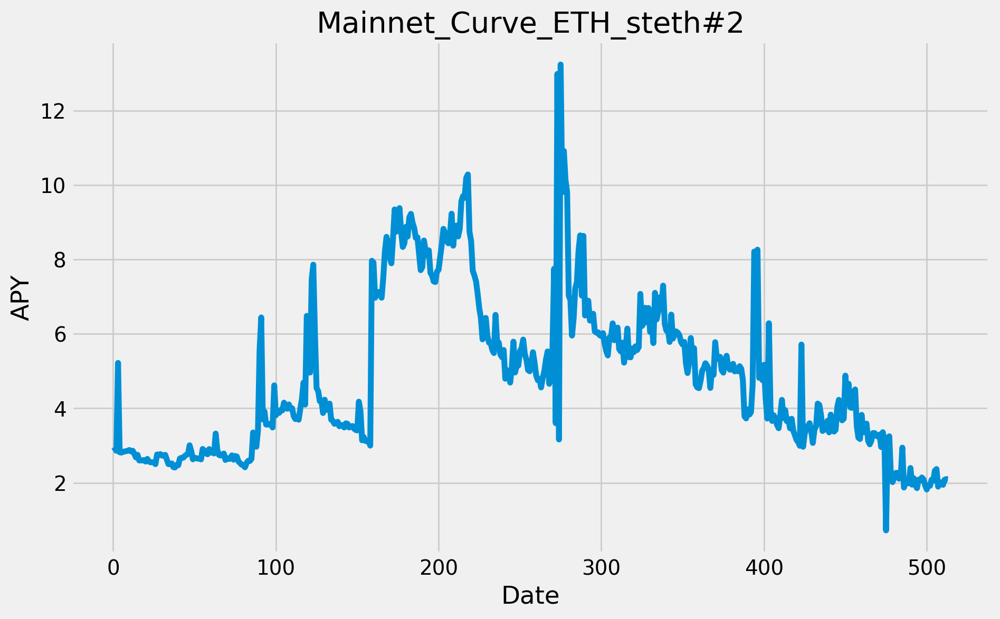

In [1924]:
# Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(Mainnet_Curve_ETH_steth_2['apy'])

# Customize the chart
plt.title('Mainnet_Curve_ETH_steth#2')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show()

In [1925]:
#Mainnet_Balancer_wstETH/WETH
is_true = ((df.project == 'balancer-v2') &
           df.symbol.isin(['WSTETH-WETH']) &
           df.chain.isin(['Ethereum']))
cols = ['chain', 'project', 'symbol', 'pool', 'tvlUsd', 'apyBase', 'apy', 'apyPct7D', 'apyPct30D', 'apyBase7d', 'apyMean30d', 'volumeUsd7d',
        'mu', 'sigma']
df.loc[is_true, cols].sort_values('apy', ascending=False)

,chain,project,symbol,pool,tvlUsd,apyBase,apy,apyPct7D,apyPct30D,apyBase7d,apyMean30d,volumeUsd7d,mu,sigma
71,Ethereum,balancer-v2,WSTETH-WETH,4cc5df76-f81d-49fe-9e1e-4caa6a8dad0b,108010085,0.0588,1.10595%,-0.0278,-0.9161,NaN,2.2973,NaN,2.8858,0.1050


In [1926]:
#get historical data
Mainnet_Balancer_wstETH_WETH=obj.get_pool_hist_apy('4cc5df76-f81d-49fe-9e1e-4caa6a8dad0b')
Mainnet_Balancer_wstETH_WETH.reset_index(inplace=True)
Mainnet_Balancer_wstETH_WETH['date'] = pd.to_datetime(Mainnet_Balancer_wstETH_WETH['date']).dt.strftime('%Y-%m-%d')
Mainnet_Balancer_wstETH_WETH.to_excel(writer, sheet_name='Mainnet_Balancer_wstETH_WETH', index=False)

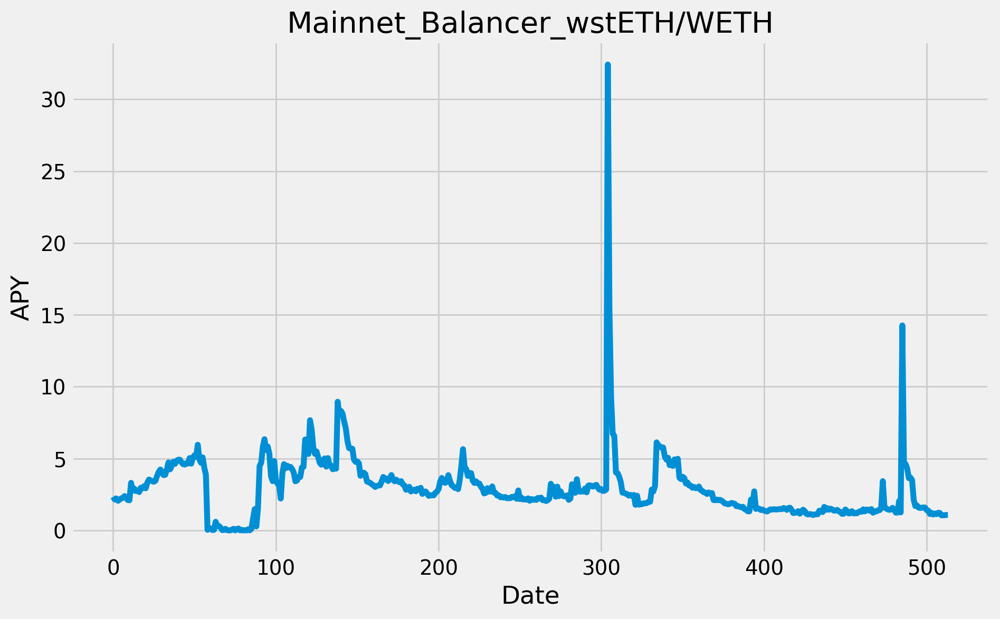

In [1927]:
# Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(Mainnet_Balancer_wstETH_WETH['apy'])

# Customize the chart
plt.title('Mainnet_Balancer_wstETH/WETH')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show()

In [1928]:
#Mainnet_Balancer_rETH/WETH
is_true = ((df.project == 'balancer-v2') &
           df.symbol.isin(['RETH-WETH']) &
           df.chain.isin(['Ethereum']))
cols = ['chain', 'project', 'symbol', 'pool', 'tvlUsd', 'apyBase', 'apy', 'apyPct7D', 'apyPct30D', 'apyBase7d', 'apyMean30d', 'volumeUsd7d',
        'mu', 'sigma']
df.loc[is_true, cols].sort_values('apy', ascending=False)

,chain,project,symbol,pool,tvlUsd,apyBase,apy,apyPct7D,apyPct30D,apyBase7d,apyMean30d,volumeUsd7d,mu,sigma
88,Ethereum,balancer-v2,RETH-WETH,42c02674-f7a2-4cb0-be3d-ade268838770,83699210,0.0053,2.30955%,-0.2728,-2.7228,NaN,3.0987,NaN,3.4749,0.1503
520,Ethereum,balancer-v2,RETH-WETH,87d8ac50-7b57-41a0-b437-4633eae8cfb2,7518172,0.0000,1.79741%,-1.2155,-2.0526,NaN,3.4397,NaN,5.5950,0.2748


In [1929]:
#get historical data
Mainnet_Balancer_rETH_WETH_1=obj.get_pool_hist_apy('87d8ac50-7b57-41a0-b437-4633eae8cfb2')
Mainnet_Balancer_rETH_WETH_1.reset_index(inplace=True)
Mainnet_Balancer_rETH_WETH_1['date'] = pd.to_datetime(Mainnet_Balancer_rETH_WETH_1['date']).dt.strftime('%Y-%m-%d')
Mainnet_Balancer_rETH_WETH_1.to_excel(writer, sheet_name='Mainnet_Balancer_rETH_WETH#1', index=False)

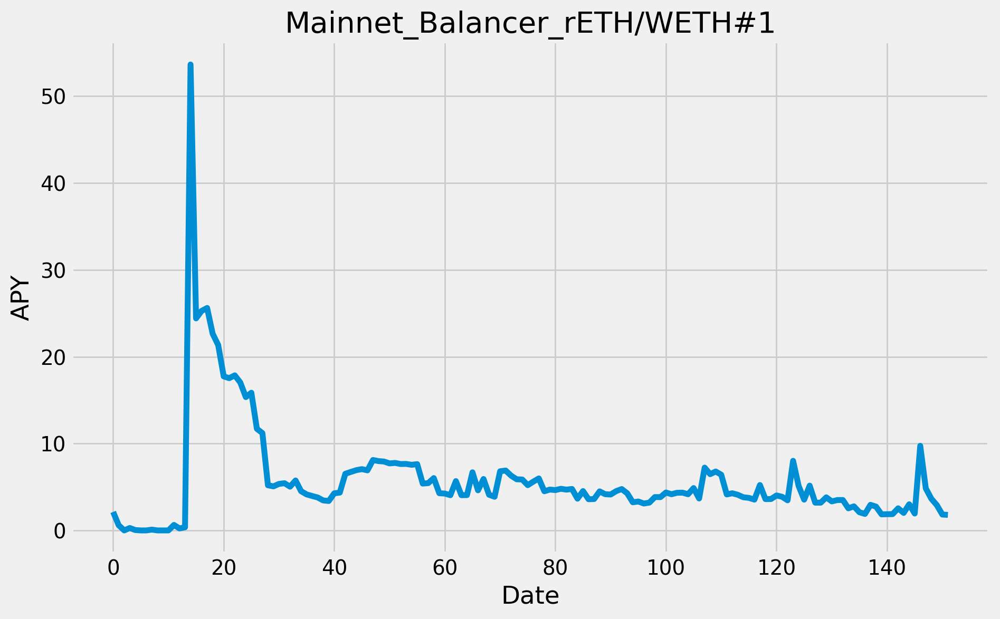

In [1930]:
# Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(Mainnet_Balancer_rETH_WETH_1['apy'])

# Customize the chart
plt.title('Mainnet_Balancer_rETH/WETH#1')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show()

In [1931]:
#get historical data
Mainnet_Balancer_rETH_WETH_2=obj.get_pool_hist_apy('42c02674-f7a2-4cb0-be3d-ade268838770')
Mainnet_Balancer_rETH_WETH_2.reset_index(inplace=True)
Mainnet_Balancer_rETH_WETH_2['date'] = pd.to_datetime(Mainnet_Balancer_rETH_WETH_2['date']).dt.strftime('%Y-%m-%d')
Mainnet_Balancer_rETH_WETH_2.to_excel(writer, sheet_name='Mainnet_Balancer_rETH_WETH#2', index=False)

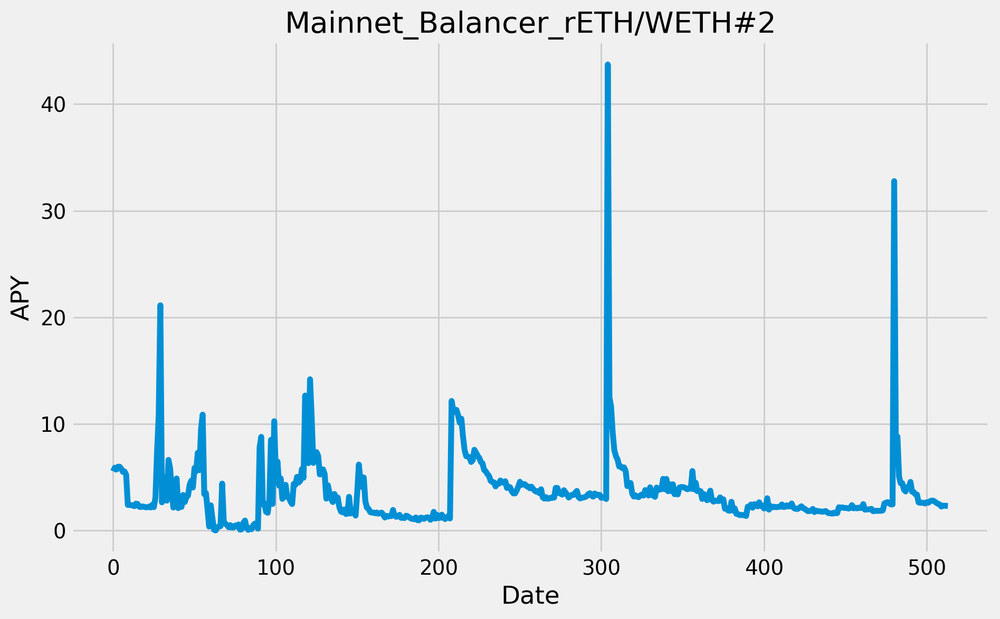

In [1932]:
# Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(Mainnet_Balancer_rETH_WETH_2['apy'])

# Customize the chart
plt.title('Mainnet_Balancer_rETH/WETH#2')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show()

In [1933]:
#ARB_Curve_ETH/wsteth
is_true = ((df.project == 'curve-dex') &
           df.symbol.isin(['ETH-WSTETH']) &
           df.chain.isin(['Arbitrum']))
cols = ['chain', 'project', 'symbol', 'pool', 'tvlUsd', 'apyBase', 'apy', 'apyPct7D', 'apyPct30D', 'apyBase7d', 'apyMean30d', 'volumeUsd7d',
        'mu', 'sigma']
df.loc[is_true, cols].sort_values('apy', ascending=False)

,chain,project,symbol,pool,tvlUsd,apyBase,apy,apyPct7D,apyPct30D,apyBase7d,apyMean30d,volumeUsd7d,mu,sigma
564,Arbitrum,curve-dex,ETH-WSTETH,668763b1-d038-4c97-b918-f013e91e863e,6861705,2.6840,2.68401%,0.7237,-0.5564,NaN,2.5345,NaN,4.5504,0.1011


In [1934]:
#get historical data
ARB_Curve_ETH_wsteth=obj.get_pool_hist_apy('668763b1-d038-4c97-b918-f013e91e863e')
ARB_Curve_ETH_wsteth.reset_index(inplace=True)
ARB_Curve_ETH_wsteth['date'] = pd.to_datetime(ARB_Curve_ETH_wsteth['date']).dt.strftime('%Y-%m-%d')
ARB_Curve_ETH_wsteth.to_excel(writer, sheet_name='ARB_Curve_ETH_wsteth', index=False)

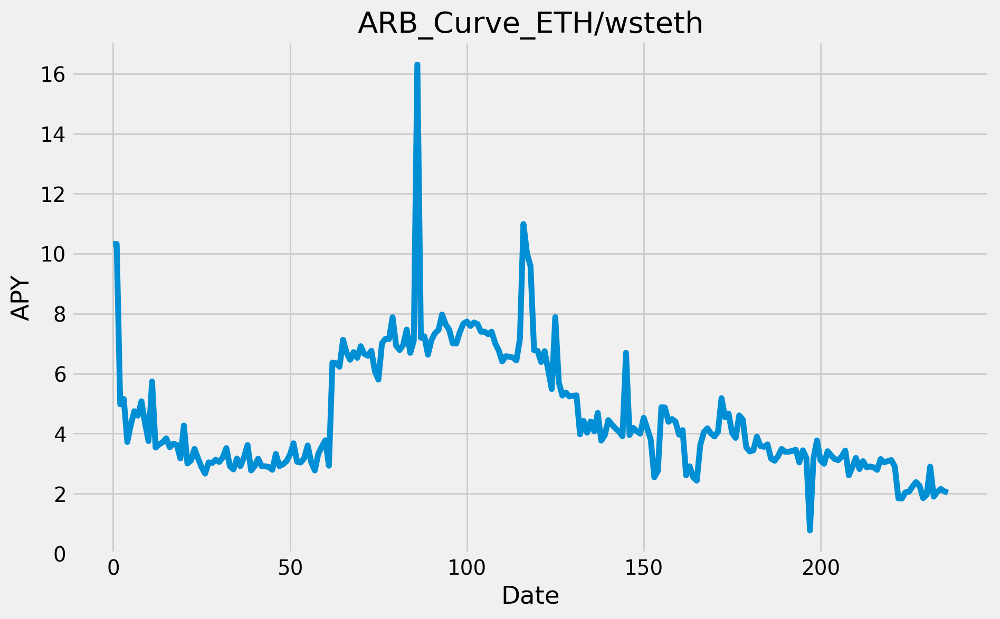

In [1935]:
# Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(ARB_Curve_ETH_wsteth['apy'])

# Customize the chart
plt.title('ARB_Curve_ETH/wsteth')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show()

In [1936]:
#ARB_Balancer_wstETH/WETH
is_true = ((df.project == 'balancer-v2') &
           df.symbol.isin(['WSTETH-WETH']) &
           df.chain.isin(['Arbitrum']))
cols = ['chain', 'project', 'symbol', 'pool', 'tvlUsd', 'apyBase', 'apy', 'apyPct7D', 'apyPct30D', 'apyBase7d', 'apyMean30d', 'volumeUsd7d',
        'mu', 'sigma']
df.loc[is_true, cols].sort_values('apy', ascending=False)

,chain,project,symbol,pool,tvlUsd,apyBase,apy,apyPct7D,apyPct30D,apyBase7d,apyMean30d,volumeUsd7d,mu,sigma
357,Arbitrum,balancer-v2,WSTETH-WETH,7b61340c-ac6d-4f30-8bf4-0abe83da5b6d,14312966,0.0416,0.04157%,0.0316,0.0032,NaN,0.0973,NaN,2.5138,0.1214


In [1937]:
#get historical data
ARB_Balancer_wstETH_WETH=obj.get_pool_hist_apy('7b61340c-ac6d-4f30-8bf4-0abe83da5b6d')
ARB_Balancer_wstETH_WETH.reset_index(inplace=True)
ARB_Balancer_wstETH_WETH['date'] = pd.to_datetime(ARB_Balancer_wstETH_WETH['date']).dt.strftime('%Y-%m-%d')
ARB_Balancer_wstETH_WETH.to_excel(writer, sheet_name='ARB_Balancer_wstETH_WETH', index=False)

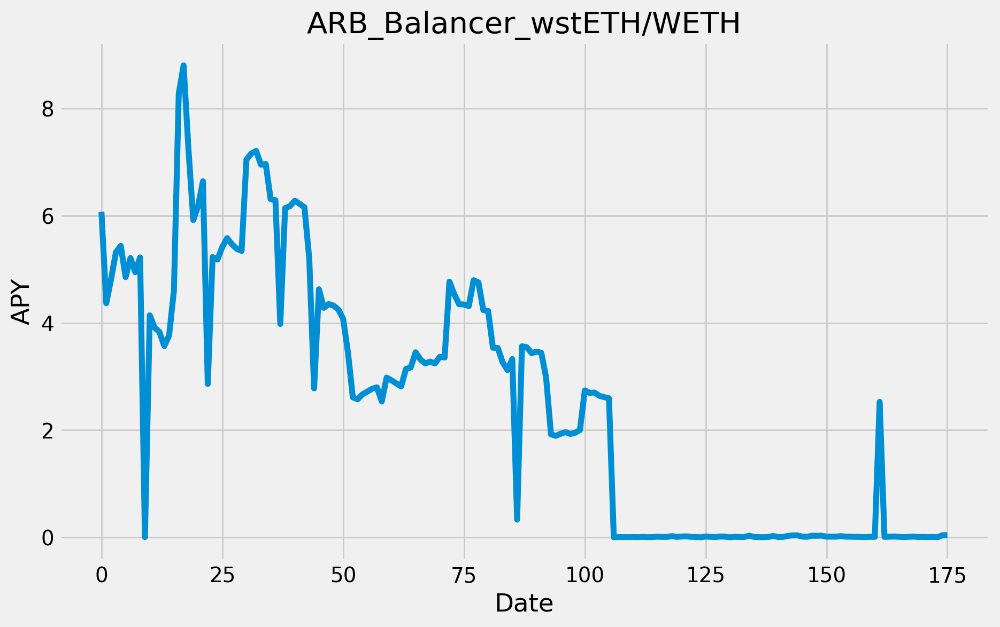

In [1938]:
# Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(ARB_Balancer_wstETH_WETH['apy'])

# Customize the chart
plt.title('ARB_Balancer_wstETH/WETH')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show()

In [1939]:
#ARB_Camelot_wstETH/WETH
is_true = ((df.project == 'camelot-v2') &
           df.symbol.isin(['WSTETH-WETH']) &
           df.chain.isin(['Arbitrum']))
cols = ['chain', 'project', 'symbol', 'pool', 'tvlUsd', 'apyBase', 'apy', 'apyPct7D', 'apyPct30D', 'apyBase7d', 'apyMean30d', 'volumeUsd7d',
        'mu', 'sigma']
df.loc[is_true, cols].sort_values('apy', ascending=False)

,chain,project,symbol,pool,tvlUsd,apyBase,apy,apyPct7D,apyPct30D,apyBase7d,apyMean30d,volumeUsd7d,mu,sigma
1024,Arbitrum,camelot-v2,WSTETH-WETH,aceb3d16-dee5-4cdc-9cf2-ad207e657442,3006333,0.0681,1.09367%,0.1873,0.2269,0.0502,0.8654,"72,550.3989",4.5777,0.1545


In [1940]:
#get historical data
ARB_Camelot_wstETH_WETH=obj.get_pool_hist_apy('aceb3d16-dee5-4cdc-9cf2-ad207e657442')
ARB_Camelot_wstETH_WETH.reset_index(inplace=True)
ARB_Camelot_wstETH_WETH['date'] = pd.to_datetime(ARB_Camelot_wstETH_WETH['date']).dt.strftime('%Y-%m-%d')
ARB_Camelot_wstETH_WETH.to_excel(writer, sheet_name='ARB_Camelot_wstETH_WETH', index=False)

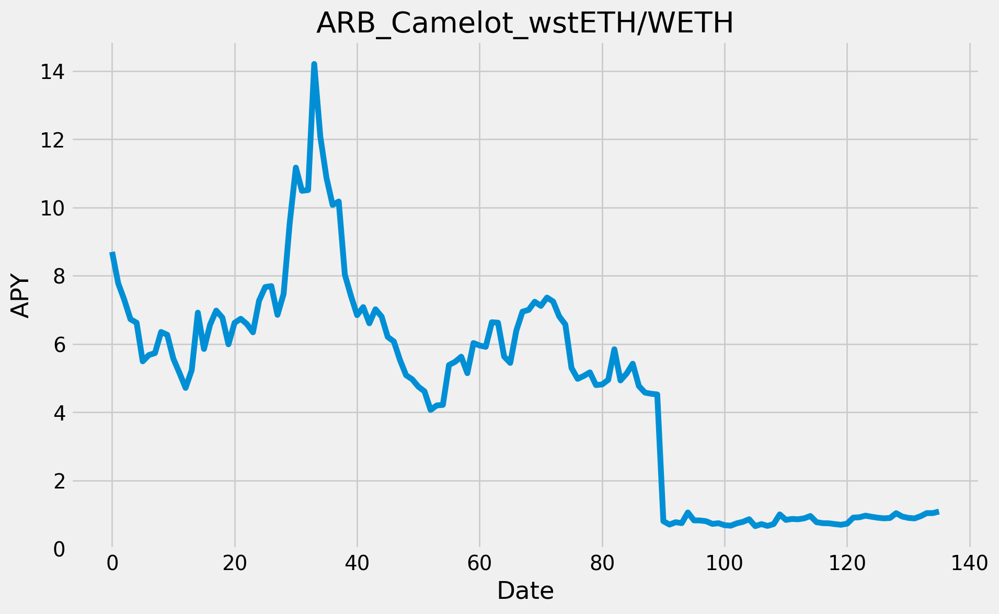

In [1941]:
# Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(ARB_Camelot_wstETH_WETH['apy'])

# Customize the chart
plt.title('ARB_Camelot_wstETH/WETH')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show()

In [1942]:
#OPT_Curve_ETH/steth
is_true = ((df.project == 'curve-dex') &
           df.symbol.isin(['ETH-WSTETH']) &
           df.chain.isin(['Optimism']))
cols = ['chain', 'project', 'symbol', 'pool', 'tvlUsd', 'apyBase', 'apy', 'apyPct7D', 'apyPct30D', 'apyBase7d', 'apyMean30d', 'volumeUsd7d',
        'mu', 'sigma']
df.loc[is_true, cols].sort_values('apy', ascending=False)

,chain,project,symbol,pool,tvlUsd,apyBase,apy,apyPct7D,apyPct30D,apyBase7d,apyMean30d,volumeUsd7d,mu,sigma
347,Optimism,curve-dex,ETH-WSTETH,50224a28-5a6c-489c-b72e-16df397a9fd2,14701841,2.1137,2.11372%,-1.7116,NaN,NaN,3.5088,NaN,5.5807,0.0943


In [1943]:
#get historical data
OPT_Curve_ETH_steth=obj.get_pool_hist_apy('50224a28-5a6c-489c-b72e-16df397a9fd2')
OPT_Curve_ETH_steth.reset_index(inplace=True)
OPT_Curve_ETH_steth['date'] = pd.to_datetime(OPT_Curve_ETH_steth['date']).dt.strftime('%Y-%m-%d')
OPT_Curve_ETH_steth.to_excel(writer, sheet_name='OPT_Curve_ETH_steth', index=False)

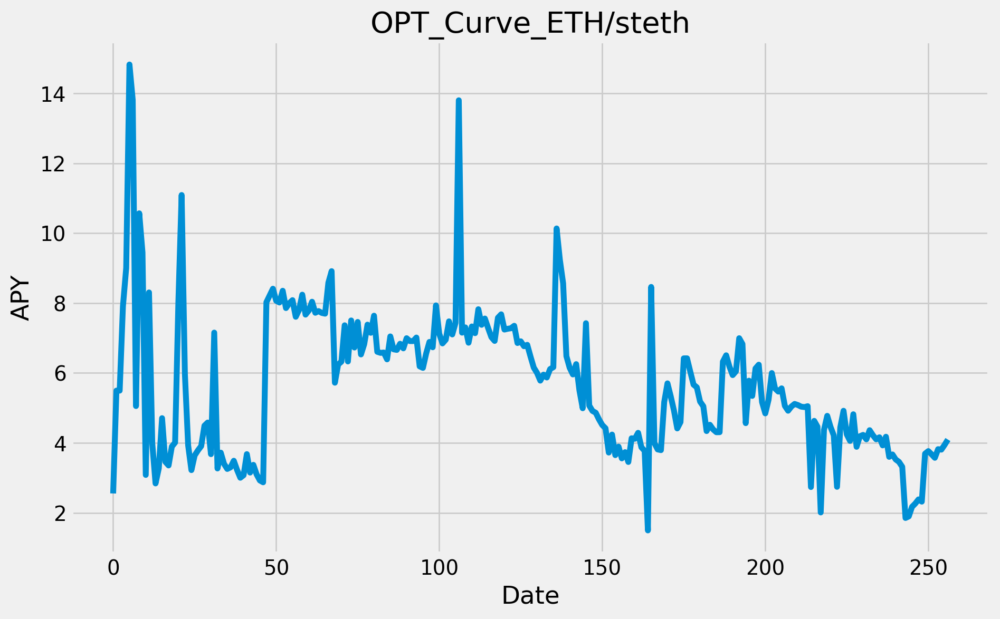

In [1944]:
# Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(OPT_Curve_ETH_steth['apy'])

# Customize the chart
plt.title('OPT_Curve_ETH/steth')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show()

In [1945]:
#OPT_Beets_wsteth/weth
is_true = ((df.project == 'beethoven-x') &
           df.symbol.isin(['WSTETH-WETH']) &
           df.chain.isin(['Optimism']))
cols = ['chain', 'project', 'symbol', 'pool', 'tvlUsd', 'apyBase', 'apy', 'apyPct7D', 'apyPct30D', 'apyBase7d', 'apyMean30d', 'volumeUsd7d',
        'mu', 'sigma']
df.loc[is_true, cols].sort_values('apy', ascending=False)

,chain,project,symbol,pool,tvlUsd,apyBase,apy,apyPct7D,apyPct30D,apyBase7d,apyMean30d,volumeUsd7d,mu,sigma
1051,Optimism,beethoven-x,WSTETH-WETH,795e4974-897c-4467-834c-6bf46e2fee0b,2904402,0.8364,2.45582%,-2.5137,0.2870,NaN,"1,328.5549",NaN,3.8112,0.2540


In [1946]:
#get historical data
OPT_Beets_wsteth_weth=obj.get_pool_hist_apy('795e4974-897c-4467-834c-6bf46e2fee0b')
OPT_Beets_wsteth_weth.reset_index(inplace=True)
OPT_Beets_wsteth_weth['date'] = pd.to_datetime(OPT_Beets_wsteth_weth['date']).dt.strftime('%Y-%m-%d')
OPT_Beets_wsteth_weth.to_excel(writer, sheet_name='OPT_Beets_wsteth_weth', index=False)

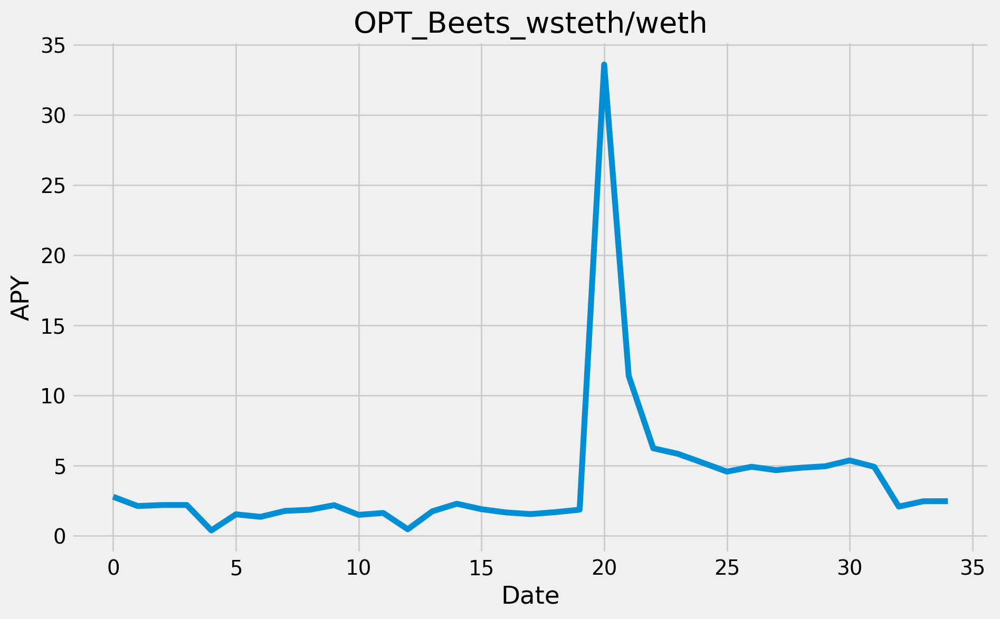

In [1947]:
# Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(OPT_Beets_wsteth_weth['apy'])

# Customize the chart
plt.title('OPT_Beets_wsteth/weth')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show()

In [1948]:
#OPT_Beets_reth/weth
is_true = ((df.project == 'beethoven-x') &
           df.symbol.isin(['WETH-RETH']) &
           df.chain.isin(['Optimism']))
cols = ['chain', 'project', 'symbol', 'pool', 'tvlUsd', 'apyBase', 'apy', 'apyPct7D', 'apyPct30D', 'apyBase7d', 'apyMean30d', 'volumeUsd7d',
        'mu', 'sigma']
df.loc[is_true, cols].sort_values('apy', ascending=False)

,chain,project,symbol,pool,tvlUsd,apyBase,apy,apyPct7D,apyPct30D,apyBase7d,apyMean30d,volumeUsd7d,mu,sigma
259,Optimism,beethoven-x,WETH-RETH,98aac697-4efa-47f8-9630-51723dc4de96,21955331,2.4496,2.4496%,-2.8394,-3.2846,NaN,4.4360,NaN,4.6499,0.0685


In [1949]:
#get historical data
OPT_Beets_reth_weth=obj.get_pool_hist_apy('98aac697-4efa-47f8-9630-51723dc4de96')
OPT_Beets_reth_weth.reset_index(inplace=True)
OPT_Beets_reth_weth['date'] = pd.to_datetime(OPT_Beets_reth_weth['date']).dt.strftime('%Y-%m-%d')
OPT_Beets_reth_weth.to_excel(writer, sheet_name='OPT_Beets_reth_weth', index=False)

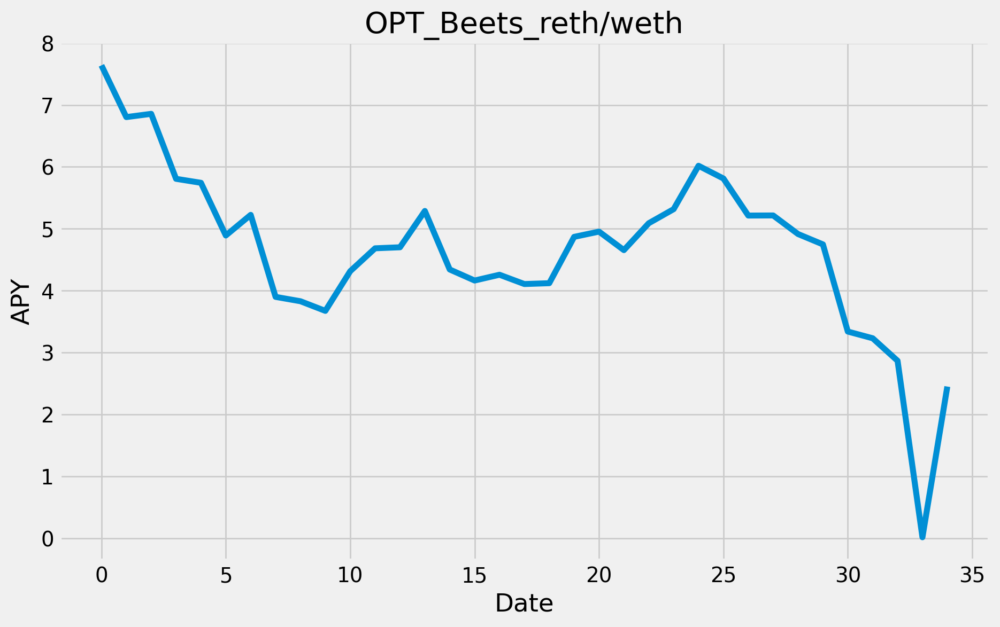

In [1950]:
# Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(OPT_Beets_reth_weth['apy'])

# Customize the chart
plt.title('OPT_Beets_reth/weth')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show()

In [1951]:
#OPT_Velodrome_wstETH/WETH
is_true = ((df.project == 'velodrome') &
           df.symbol.isin(['WSTETH-WETH']) &
           df.chain.isin(['Optimism']))
cols = ['chain', 'project', 'symbol', 'pool', 'tvlUsd', 'apyBase', 'apy', 'apyPct7D', 'apyPct30D', 'apyBase7d', 'apyMean30d', 'volumeUsd7d',
        'mu', 'sigma']
df.loc[is_true, cols].sort_values('apy', ascending=False)

,chain,project,symbol,pool,tvlUsd,apyBase,apy,apyPct7D,apyPct30D,apyBase7d,apyMean30d,volumeUsd7d,mu,sigma
7076,Optimism,velodrome,WSTETH-WETH,c14c15dd-0fb7-450a-a333-29464f46c145,76056,NaN,2.31884%,2.1346,2.0958,NaN,0.6187,NaN,4.4730,0.1952
2856,Optimism,velodrome,WSTETH-WETH,14215838-57b0-4be6-ac90-848e56308cea,542994,NaN,0.84375%,0.2582,-2.9190,NaN,2.9615,NaN,4.9284,0.1780


In [1952]:
#get historical data
OPT_Velodrome_wstETH_WETH_1=obj.get_pool_hist_apy('c14c15dd-0fb7-450a-a333-29464f46c145')
OPT_Velodrome_wstETH_WETH_1.reset_index(inplace=True)
OPT_Velodrome_wstETH_WETH_1['date'] = pd.to_datetime(OPT_Velodrome_wstETH_WETH_1['date']).dt.strftime('%Y-%m-%d')
OPT_Velodrome_wstETH_WETH_1.to_excel(writer, sheet_name='OPT_Velodrome_wstETH_WETH#1', index=False)

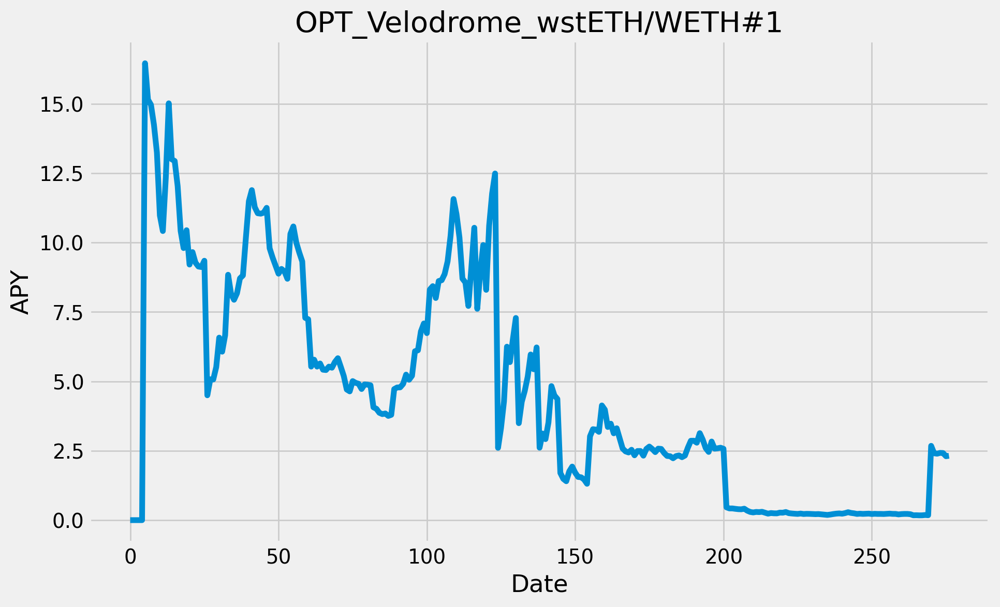

In [1953]:
# Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(OPT_Velodrome_wstETH_WETH_1['apy'])

# Customize the chart
plt.title('OPT_Velodrome_wstETH/WETH#1')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show()

In [1954]:
#get historical data
OPT_Velodrome_wstETH_WETH_2=obj.get_pool_hist_apy('14215838-57b0-4be6-ac90-848e56308cea')
OPT_Velodrome_wstETH_WETH_2.reset_index(inplace=True)
OPT_Velodrome_wstETH_WETH_2['date'] = pd.to_datetime(OPT_Velodrome_wstETH_WETH_2['date']).dt.strftime('%Y-%m-%d')
OPT_Velodrome_wstETH_WETH_2.to_excel(writer, sheet_name='OPT_Velodrome_wstETH_WETH#2', index=False)

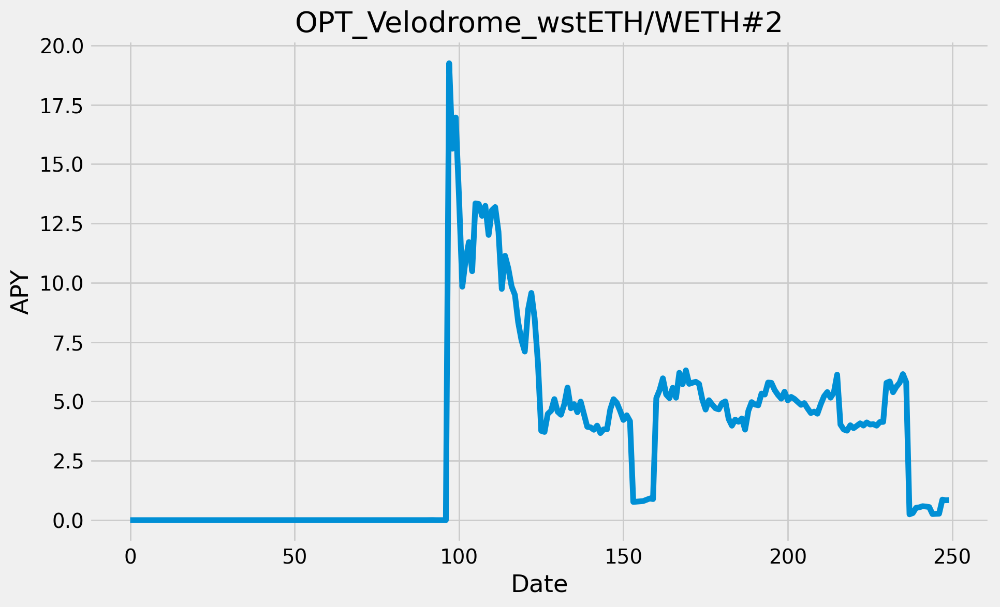

In [1955]:
# Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(OPT_Velodrome_wstETH_WETH_2['apy'])

# Customize the chart
plt.title('OPT_Velodrome_wstETH/WETH#2')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show()

In [1956]:
#OPT_Velodrome_rETH/WETH
is_true = ((df.project == 'velodrome') &
           df.symbol.isin(['WETH-RETH']) &
           df.chain.isin(['Optimism']))
cols = ['chain', 'project', 'symbol', 'pool', 'tvlUsd', 'apyBase', 'apy', 'apyPct7D', 'apyPct30D', 'apyBase7d', 'apyMean30d', 'volumeUsd7d',
        'mu', 'sigma']
df.loc[is_true, cols].sort_values('apy', ascending=False)

,chain,project,symbol,pool,tvlUsd,apyBase,apy,apyPct7D,apyPct30D,apyBase7d,apyMean30d,volumeUsd7d,mu,sigma
887,Optimism,velodrome,WETH-RETH,f5cbc073-98ec-4fd2-8a9a-2aab73d16d8a,3658918,NaN,0.09041%,-0.0302,-4.6181,NaN,1.9132,NaN,7.7239,0.3131
8490,Optimism,velodrome,WETH-RETH,0c4943a9-4f2f-477c-a9b8-eb5c425212b9,39998,NaN,0.07685%,-0.0188,-0.2681,NaN,0.1916,NaN,4.2265,0.3143


In [1957]:
#get historical data
OPT_Velodrome_rETH_WETH_1=obj.get_pool_hist_apy('0c4943a9-4f2f-477c-a9b8-eb5c425212b9')
OPT_Velodrome_rETH_WETH_1.reset_index(inplace=True)
OPT_Velodrome_rETH_WETH_1['date'] = pd.to_datetime(OPT_Velodrome_rETH_WETH_1['date']).dt.strftime('%Y-%m-%d')
OPT_Velodrome_rETH_WETH_1.to_excel(writer, sheet_name='OPT_Velodrome_rETH_WETH#1', index=False)

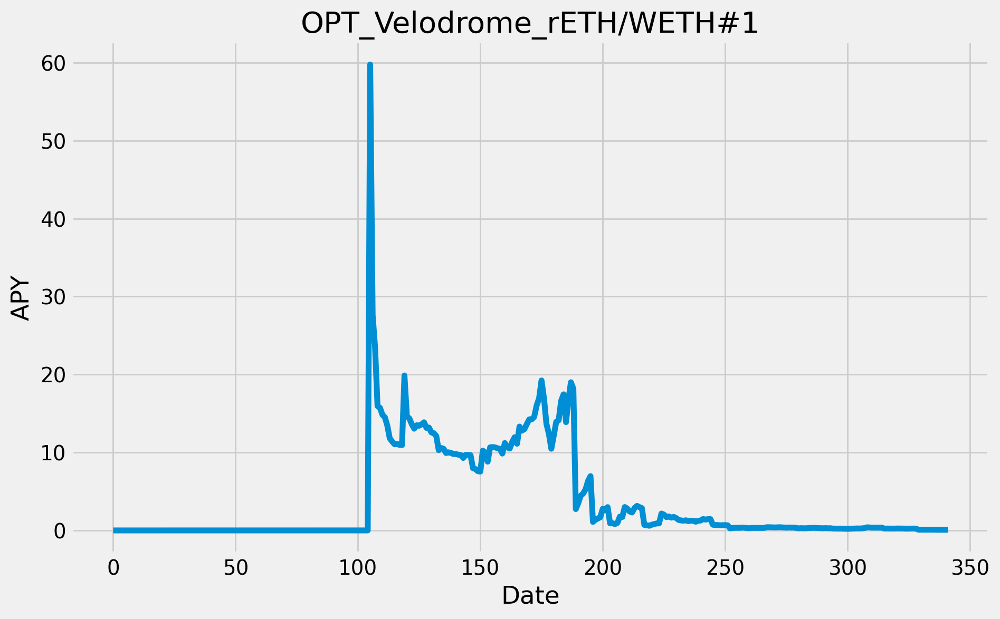

In [1958]:
# Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(OPT_Velodrome_rETH_WETH_1['apy'])

# Customize the chart
plt.title('OPT_Velodrome_rETH/WETH#1')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show()

In [1959]:
#get historical data
OPT_Velodrome_rETH_WETH_2=obj.get_pool_hist_apy('f5cbc073-98ec-4fd2-8a9a-2aab73d16d8a')
OPT_Velodrome_rETH_WETH_2.reset_index(inplace=True)
OPT_Velodrome_rETH_WETH_2['date'] = pd.to_datetime(OPT_Velodrome_rETH_WETH_2['date']).dt.strftime('%Y-%m-%d')
OPT_Velodrome_rETH_WETH_2.to_excel(writer, sheet_name='OPT_Velodrome_rETH_WETH#2', index=False)

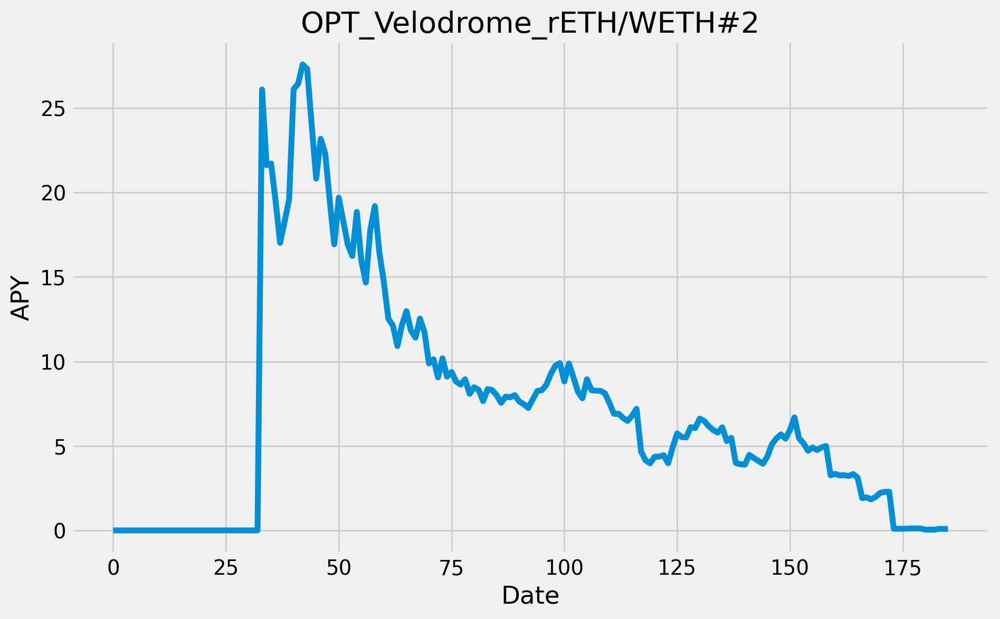

In [1960]:
# Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(OPT_Velodrome_rETH_WETH_2['apy'])

# Customize the chart
plt.title('OPT_Velodrome_rETH/WETH#2')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show()

## ETH/BTC LPs

In [1961]:
#Mainnet_Sushiswap_wbtc/wETH
is_true = ((df.project == 'sushiswap') &
           df.symbol.isin(['WBTC-WETH']) &
           df.chain.isin(['Ethereum']))
cols = ['chain', 'project', 'symbol', 'pool', 'tvlUsd', 'apyBase', 'apy', 'apyPct7D', 'apyPct30D', 'apyBase7d', 'apyMean30d', 'volumeUsd7d',
        'mu', 'sigma']
df.loc[is_true, cols].sort_values('apy', ascending=False)

,chain,project,symbol,pool,tvlUsd,apyBase,apy,apyPct7D,apyPct30D,apyBase7d,apyMean30d,volumeUsd7d,mu,sigma
258,Ethereum,sushiswap,WBTC-WETH,721c17e7-d8e9-4288-8436-16c27ad264df,22026704,0.3464,0.38384%,-0.6603,-1.0694,0.4002,0.7276,"565,008.9274",2.4465,0.1789


In [1962]:
#get historical data
Mainnet_Sushiswap_wbtc_wETH=obj.get_pool_hist_apy('721c17e7-d8e9-4288-8436-16c27ad264df')
Mainnet_Sushiswap_wbtc_wETH.reset_index(inplace=True)
Mainnet_Sushiswap_wbtc_wETH['date'] = pd.to_datetime(Mainnet_Sushiswap_wbtc_wETH['date']).dt.strftime('%Y-%m-%d')
Mainnet_Sushiswap_wbtc_wETH.to_excel(writer, sheet_name='Mainnet_Sushiswap_wbtc_wETH', index=False)

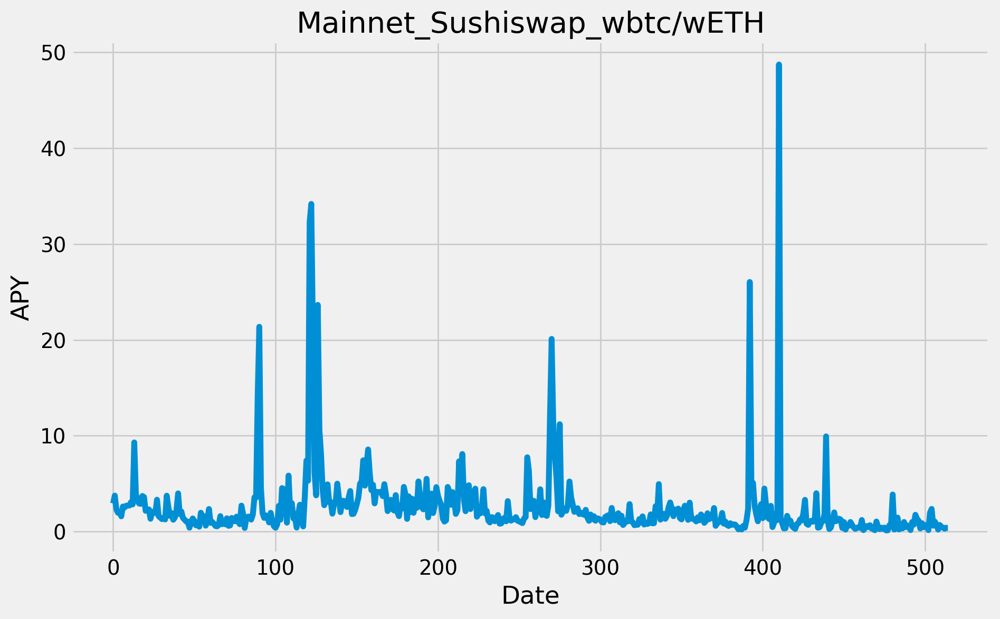

In [1963]:
# Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(Mainnet_Sushiswap_wbtc_wETH['apy'])

# Customize the chart
plt.title('Mainnet_Sushiswap_wbtc/wETH')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show()

In [1964]:
#Mainnet_Uniswapv2_wbtc/wETH
is_true = ((df.project == 'uniswap-v2') &
           df.symbol.isin(['WBTC-WETH']) &
           df.chain.isin(['Ethereum']))
cols = ['chain', 'project', 'symbol', 'pool', 'tvlUsd', 'apyBase', 'apy', 'apyPct7D', 'apyPct30D', 'apyBase7d', 'apyMean30d', 'volumeUsd7d',
        'mu', 'sigma']
df.loc[is_true, cols].sort_values('apy', ascending=False)

,chain,project,symbol,pool,tvlUsd,apyBase,apy,apyPct7D,apyPct30D,apyBase7d,apyMean30d,volumeUsd7d,mu,sigma
439,Ethereum,uniswap-v2,WBTC-WETH,a1c73c84-39d2-4cf3-b2cc-652853967e5c,9742729,0.6095,0.60949%,-0.3519,NaN,0.7131,2.4697,"445,384.2533",2.3738,0.2998


In [1965]:
#get historical data
Mainnet_Uniswapv2_wbtc_wETH=obj.get_pool_hist_apy('a1c73c84-39d2-4cf3-b2cc-652853967e5c')
Mainnet_Uniswapv2_wbtc_wETH.reset_index(inplace=True)
Mainnet_Uniswapv2_wbtc_wETH['date'] = pd.to_datetime(Mainnet_Uniswapv2_wbtc_wETH['date']).dt.strftime('%Y-%m-%d')
Mainnet_Uniswapv2_wbtc_wETH.to_excel(writer, sheet_name='Mainnet_Uniswapv2_wbtc_wETH', index=False)

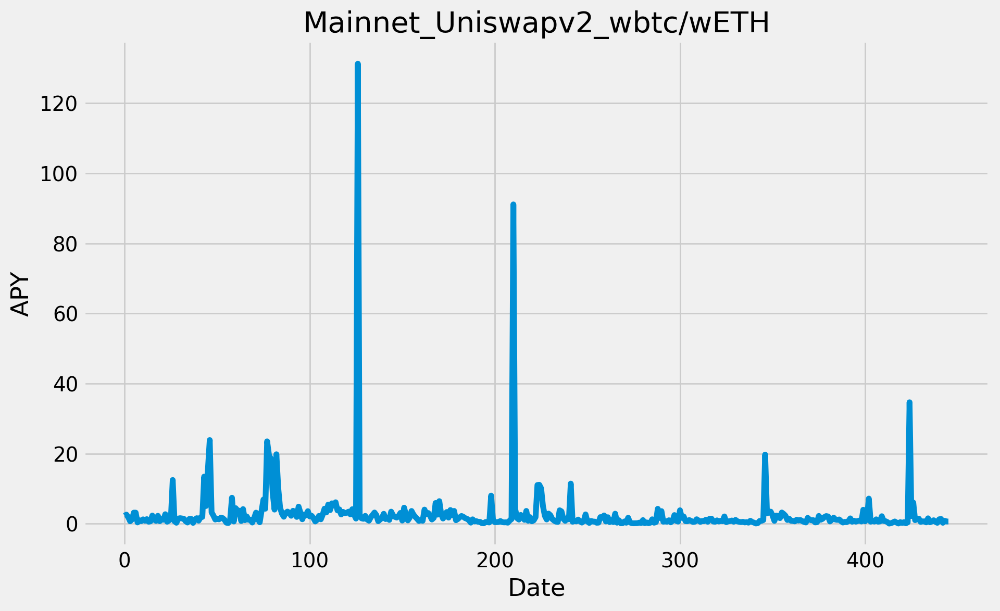

In [1966]:
# Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(Mainnet_Uniswapv2_wbtc_wETH['apy'])

# Customize the chart
plt.title('Mainnet_Uniswapv2_wbtc/wETH')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show()

In [1967]:
#Mainnet_Uniswapv3_wbtc/wETH_0.05%
is_true = ((df.project == 'uniswap-v3') &
           df.symbol.isin(['WBTC-WETH']) &
           df.chain.isin(['Ethereum']))
cols = ['chain', 'project', 'symbol', 'pool', 'tvlUsd', 'apyBase', 'apy', 'apyPct7D', 'apyPct30D', 'apyBase7d', 'apyMean30d', 'volumeUsd7d',
        'mu', 'sigma']
df.loc[is_true, cols].sort_values('apy', ascending=False)

,chain,project,symbol,pool,tvlUsd,apyBase,apy,apyPct7D,apyPct30D,apyBase7d,apyMean30d,volumeUsd7d,mu,sigma
86,Ethereum,uniswap-v3,WBTC-WETH,d59a5728-d391-4989-86f6-a94e11e0eb3b,88476079,9.8929,9.89287%,1.7736,-1.7657,2.6052,7.0727,"177,871,681.4400",14.4934,0.6424
5405,Ethereum,uniswap-v3,WBTC-WETH,d12f85a6-6684-4b8e-82bd-f47d3a052ace,155898,7.9372,7.93722%,-0.4067,-10.2262,2.7045,3.0074,"10,442.1970",7.1779,0.9283
42,Ethereum,uniswap-v3,WBTC-WETH,c5599b3a-ea73-4017-a867-72eb971301d1,231244011,2.6633,2.66331%,-6.2725,-8.7432,2.0110,5.4547,"43,290,657.3349",10.7807,0.4949


In [1968]:
#get historical data
Mainnet_Uniswapv3_wbtc_wETH_005=obj.get_pool_hist_apy('d59a5728-d391-4989-86f6-a94e11e0eb3b')
Mainnet_Uniswapv3_wbtc_wETH_005.reset_index(inplace=True)
Mainnet_Uniswapv3_wbtc_wETH_005['date'] = pd.to_datetime(Mainnet_Uniswapv3_wbtc_wETH_005['date']).dt.strftime('%Y-%m-%d')
Mainnet_Uniswapv3_wbtc_wETH_005.to_excel(writer, sheet_name='Main_Uniswapv3_wbtc_wETH_0.05%', index=False)

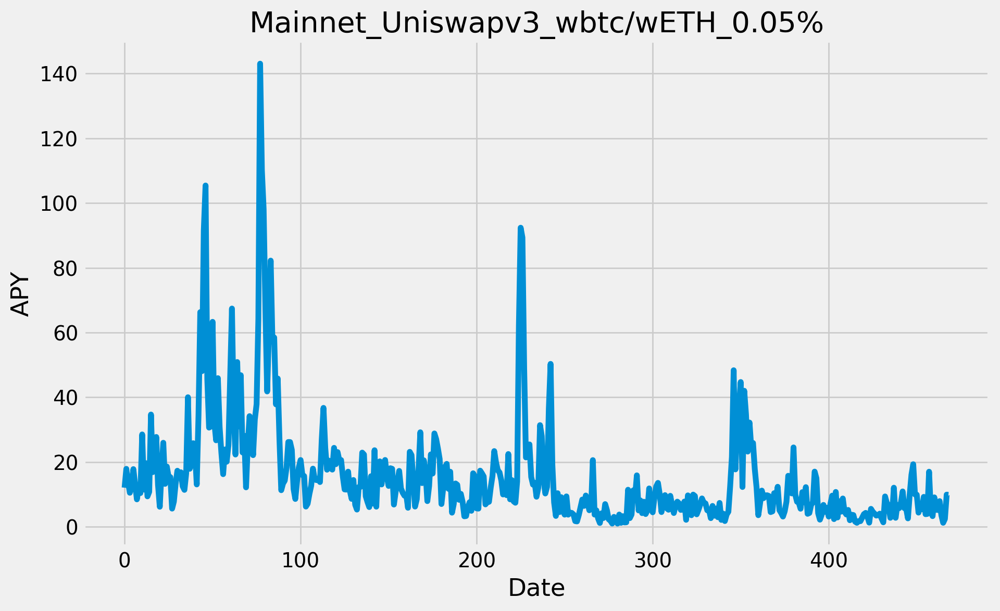

In [1969]:
# Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(Mainnet_Uniswapv3_wbtc_wETH_005['apy'])

# Customize the chart
plt.title('Mainnet_Uniswapv3_wbtc/wETH_0.05%')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show()

In [1970]:
#Mainnet_Uniswapv3_wbtc/wETH_0.3%
is_true = ((df.project == 'uniswap-v3') &
           df.symbol.isin(['WBTC-WETH']) &
           df.chain.isin(['Ethereum']))
cols = ['chain', 'project', 'symbol', 'pool', 'tvlUsd', 'apyBase', 'apy', 'apyPct7D', 'apyPct30D', 'apyBase7d', 'apyMean30d', 'volumeUsd7d',
        'mu', 'sigma']
df.loc[is_true, cols].sort_values('apy', ascending=False)

,chain,project,symbol,pool,tvlUsd,apyBase,apy,apyPct7D,apyPct30D,apyBase7d,apyMean30d,volumeUsd7d,mu,sigma
86,Ethereum,uniswap-v3,WBTC-WETH,d59a5728-d391-4989-86f6-a94e11e0eb3b,88476079,9.8929,9.89287%,1.7736,-1.7657,2.6052,7.0727,"177,871,681.4400",14.4934,0.6424
5405,Ethereum,uniswap-v3,WBTC-WETH,d12f85a6-6684-4b8e-82bd-f47d3a052ace,155898,7.9372,7.93722%,-0.4067,-10.2262,2.7045,3.0074,"10,442.1970",7.1779,0.9283
42,Ethereum,uniswap-v3,WBTC-WETH,c5599b3a-ea73-4017-a867-72eb971301d1,231244011,2.6633,2.66331%,-6.2725,-8.7432,2.0110,5.4547,"43,290,657.3349",10.7807,0.4949


In [1971]:
#get historical data
Mainnet_Uniswapv3_wbtc_wETH_03=obj.get_pool_hist_apy('c5599b3a-ea73-4017-a867-72eb971301d1')
Mainnet_Uniswapv3_wbtc_wETH_03.reset_index(inplace=True)
Mainnet_Uniswapv3_wbtc_wETH_03['date'] = pd.to_datetime(Mainnet_Uniswapv3_wbtc_wETH_03['date']).dt.strftime('%Y-%m-%d')
Mainnet_Uniswapv3_wbtc_wETH_03.to_excel(writer, sheet_name='Main_Uniswapv3_wbtc_wETH_0.3%', index=False)

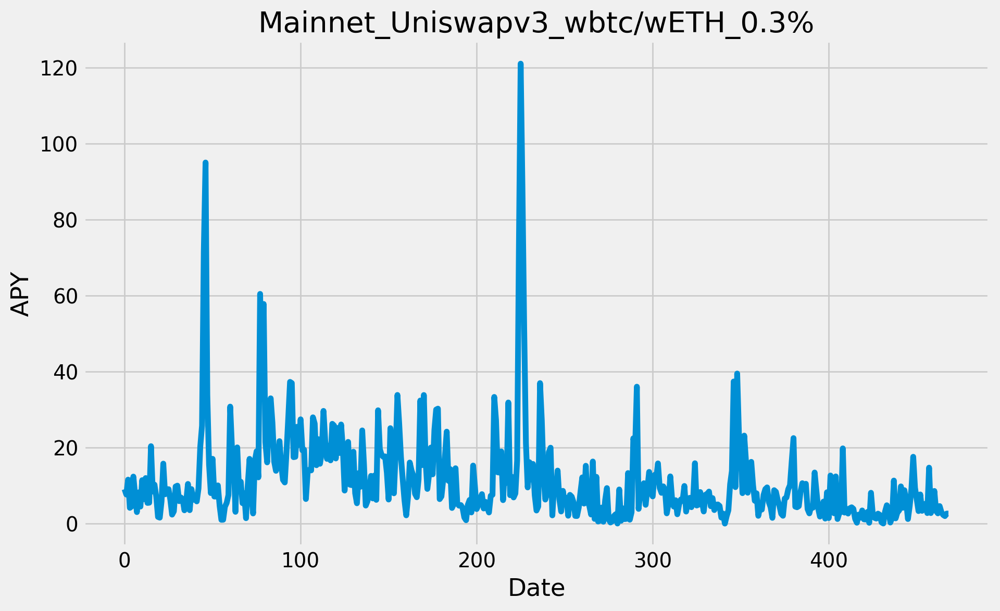

In [1972]:
# Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(Mainnet_Uniswapv3_wbtc_wETH_03['apy'])

# Customize the chart
plt.title('Mainnet_Uniswapv3_wbtc/wETH_0.3%')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show()

In [1973]:
#ARB_Kyberswap_wBTC/WETH_0.04%
is_true = ((df.project == 'kyberswap-elastic') &
           df.symbol.isin(['WBTC-WETH']) &
           df.chain.isin(['Arbitrum']))
cols = ['chain', 'project', 'symbol', 'pool', 'tvlUsd', 'apyBase', 'apy', 'apyPct7D', 'apyPct30D', 'apyBase7d', 'apyMean30d', 'volumeUsd7d',
        'mu', 'sigma']
df.loc[is_true, cols].sort_values('apy', ascending=False)

,chain,project,symbol,pool,tvlUsd,apyBase,apy,apyPct7D,apyPct30D,apyBase7d,apyMean30d,volumeUsd7d,mu,sigma
1109,Arbitrum,kyberswap-elastic,WBTC-WETH,ab847914-c906-4bc8-9a2a-236ff1fbfd8c,2668612,7.8695,16.01881%,-1.2921,-22.8890,NaN,22.5087,NaN,23.3964,0.3052


In [1974]:
#get historical data
ARB_Kyberswap_wBTC_WETH_004=obj.get_pool_hist_apy('ab847914-c906-4bc8-9a2a-236ff1fbfd8c')
ARB_Kyberswap_wBTC_WETH_004.reset_index(inplace=True)
ARB_Kyberswap_wBTC_WETH_004['date'] = pd.to_datetime(ARB_Kyberswap_wBTC_WETH_004['date']).dt.strftime('%Y-%m-%d')
ARB_Kyberswap_wBTC_WETH_004.to_excel(writer, sheet_name='ARB_Kyberswap_wBTC_WETH_0.04%', index=False)

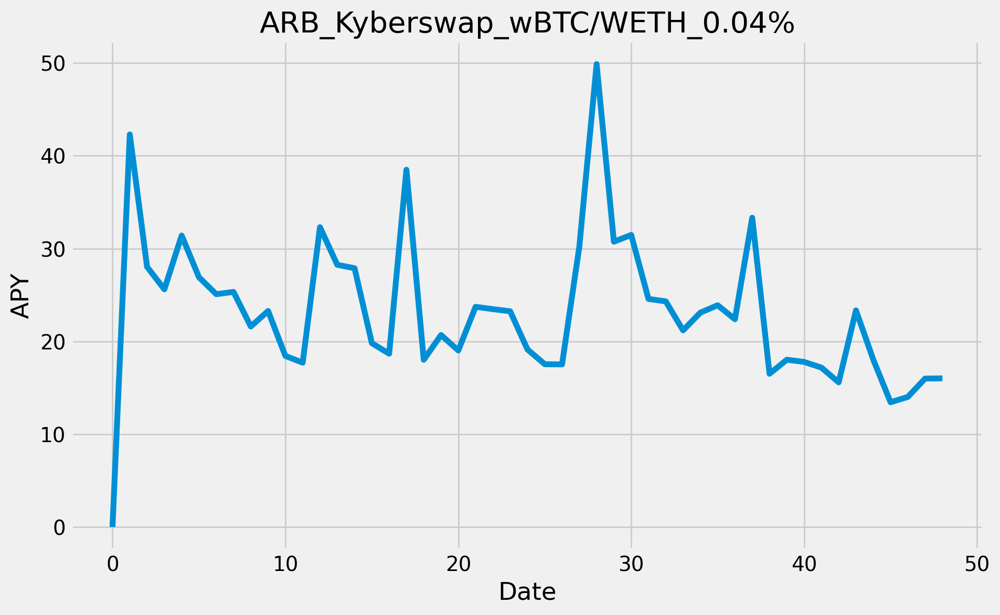

In [1975]:
# Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(ARB_Kyberswap_wBTC_WETH_004['apy'])

# Customize the chart
plt.title('ARB_Kyberswap_wBTC/WETH_0.04%')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show()

In [1976]:
#ARB_Camelot_wBTC/WETH
is_true = ((df.project == 'camelot-v2') &
           df.symbol.isin(['WBTC-WETH']) &
           df.chain.isin(['Arbitrum']))
cols = ['chain', 'project', 'symbol', 'pool', 'tvlUsd', 'apyBase', 'apy', 'apyPct7D', 'apyPct30D', 'apyBase7d', 'apyMean30d', 'volumeUsd7d',
        'mu', 'sigma']
df.loc[is_true, cols].sort_values('apy', ascending=False)

,chain,project,symbol,pool,tvlUsd,apyBase,apy,apyPct7D,apyPct30D,apyBase7d,apyMean30d,volumeUsd7d,mu,sigma
4511,Arbitrum,camelot-v2,WBTC-WETH,ccaa1bdc-8576-4d3a-b163-256d161f4eea,224885,0.2811,1.65798%,-0.2469,-6.7808,0.5320,2.0328,"46,018.4808",5.7014,0.1537


In [1977]:
#get historical data
ARB_Camelot_wBTC_WETH=obj.get_pool_hist_apy('ccaa1bdc-8576-4d3a-b163-256d161f4eea')
ARB_Camelot_wBTC_WETH.reset_index(inplace=True)
ARB_Camelot_wBTC_WETH['date'] = pd.to_datetime(ARB_Camelot_wBTC_WETH['date']).dt.strftime('%Y-%m-%d')
ARB_Camelot_wBTC_WETH.to_excel(writer, sheet_name='ARB_Camelot_wBTC_WETH', index=False)

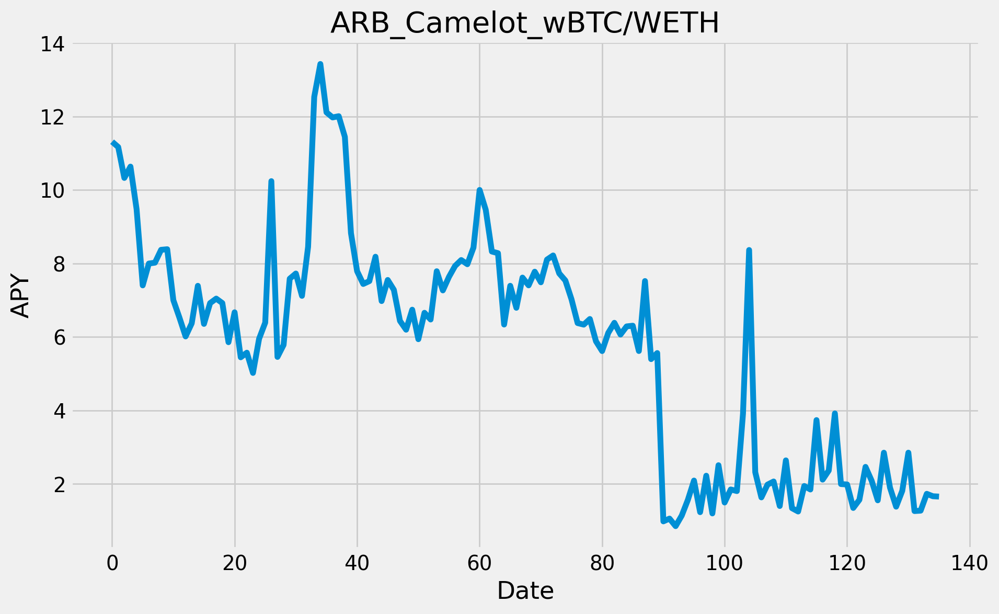

In [1978]:
# Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(ARB_Camelot_wBTC_WETH['apy'])

# Customize the chart
plt.title('ARB_Camelot_wBTC/WETH')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show()

In [1979]:
#ARB_Uniswapv3_wBTC/WETH_0.05%
is_true = ((df.project == 'uniswap-v3') &
           df.symbol.isin(['WBTC-WETH']) &
           df.chain.isin(['Arbitrum']))
cols = ['chain', 'project', 'symbol', 'pool', 'tvlUsd', 'apyBase', 'apy', 'apyPct7D', 'apyPct30D', 'apyBase7d', 'apyMean30d', 'volumeUsd7d',
        'mu', 'sigma']
df.loc[is_true, cols].sort_values('apy', ascending=False)

,chain,project,symbol,pool,tvlUsd,apyBase,apy,apyPct7D,apyPct30D,apyBase7d,apyMean30d,volumeUsd7d,mu,sigma
232,Arbitrum,uniswap-v3,WBTC-WETH,bb7e9353-129f-4e01-b822-f4250d0abb8a,25467699,4.5880,4.58796%,-3.2279,-10.6006,4.5309,7.4752,"44,381,835.4803",15.7373,0.8021
872,Arbitrum,uniswap-v3,WBTC-WETH,14d11019-8d05-43b9-8ab9-f9baeb9e70fa,3744691,3.7558,3.75584%,-6.1033,-6.8089,3.1674,5.0827,"760,318.6276",13.3448,0.7137
4391,Arbitrum,uniswap-v3,WBTC-WETH,2f9ddcb6-1d5c-42f1-afb1-5df054c419f3,235433,0.0000,0.0%,-5.1621,-17.7259,2.3217,5.9101,"10,511.5360",8.8006,0.7611


In [1980]:
#get historical data
ARB_Uniswapv3_wBTC_WETH_005=obj.get_pool_hist_apy('bb7e9353-129f-4e01-b822-f4250d0abb8a')
ARB_Uniswapv3_wBTC_WETH_005.reset_index(inplace=True)
ARB_Uniswapv3_wBTC_WETH_005['date'] = pd.to_datetime(ARB_Uniswapv3_wBTC_WETH_005['date']).dt.strftime('%Y-%m-%d')
ARB_Uniswapv3_wBTC_WETH_005.to_excel(writer, sheet_name='ARB_Uniswapv3_wBTC_WETH_0.05%', index=False)

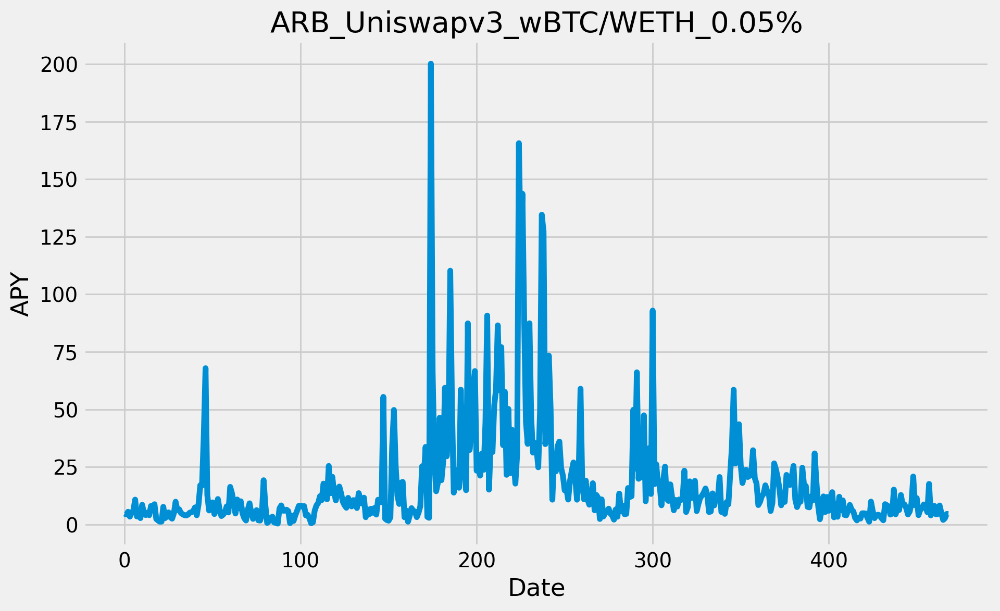

In [1981]:
# Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(ARB_Uniswapv3_wBTC_WETH_005['apy'])

# Customize the chart
plt.title('ARB_Uniswapv3_wBTC/WETH_0.05%')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show()

In [1982]:
#ARB_Uniswapv3_wBTC/WETH_0.3%
is_true = ((df.project == 'uniswap-v3') &
           df.symbol.isin(['WBTC-WETH']) &
           df.chain.isin(['Arbitrum']))
cols = ['chain', 'project', 'symbol', 'pool', 'tvlUsd', 'apyBase', 'apy', 'apyPct7D', 'apyPct30D', 'apyBase7d', 'apyMean30d', 'volumeUsd7d',
        'mu', 'sigma']
df.loc[is_true, cols].sort_values('apy', ascending=False)

,chain,project,symbol,pool,tvlUsd,apyBase,apy,apyPct7D,apyPct30D,apyBase7d,apyMean30d,volumeUsd7d,mu,sigma
232,Arbitrum,uniswap-v3,WBTC-WETH,bb7e9353-129f-4e01-b822-f4250d0abb8a,25467699,4.5880,4.58796%,-3.2279,-10.6006,4.5309,7.4752,"44,381,835.4803",15.7373,0.8021
872,Arbitrum,uniswap-v3,WBTC-WETH,14d11019-8d05-43b9-8ab9-f9baeb9e70fa,3744691,3.7558,3.75584%,-6.1033,-6.8089,3.1674,5.0827,"760,318.6276",13.3448,0.7137
4391,Arbitrum,uniswap-v3,WBTC-WETH,2f9ddcb6-1d5c-42f1-afb1-5df054c419f3,235433,0.0000,0.0%,-5.1621,-17.7259,2.3217,5.9101,"10,511.5360",8.8006,0.7611


In [1983]:
#get historical data
ARB_Uniswapv3_wBTC_WETH_03=obj.get_pool_hist_apy('14d11019-8d05-43b9-8ab9-f9baeb9e70fa')
ARB_Uniswapv3_wBTC_WETH_03.reset_index(inplace=True)
ARB_Uniswapv3_wBTC_WETH_03['date'] = pd.to_datetime(ARB_Uniswapv3_wBTC_WETH_03['date']).dt.strftime('%Y-%m-%d')
ARB_Uniswapv3_wBTC_WETH_03.to_excel(writer, sheet_name='ARB_Uniswapv3_wBTC_WETH_0.3%', index=False)

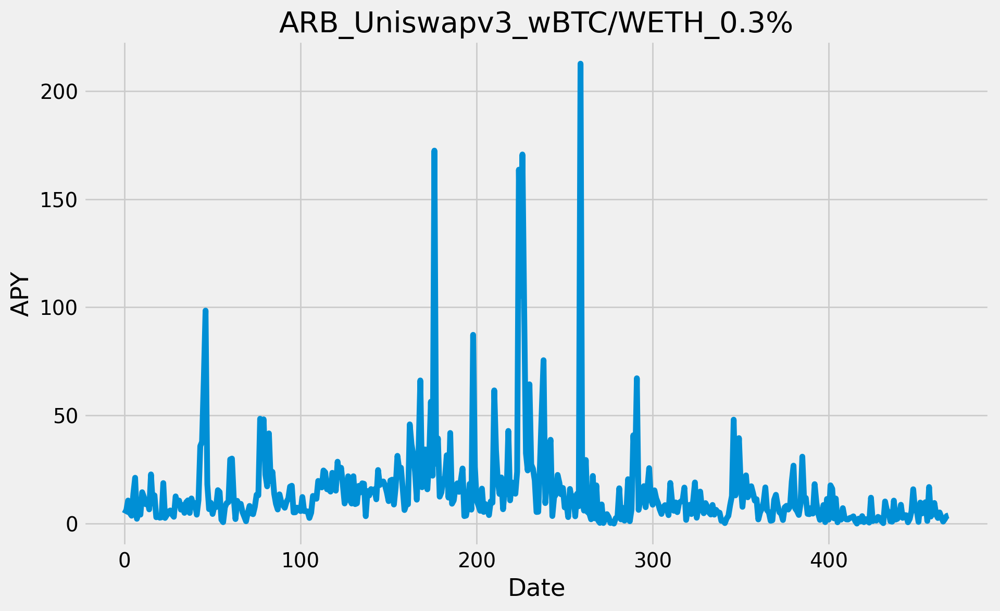

In [1984]:
# Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(ARB_Uniswapv3_wBTC_WETH_03['apy'])

# Customize the chart
plt.title('ARB_Uniswapv3_wBTC/WETH_0.3%')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show()

In [1985]:
#OPT_Kyberswap_wBTC/WETH
is_true = ((df.project == 'kyberswap-elastic') &
           df.symbol.isin(['WSTETH-WBTC']) &
           df.chain.isin(['Optimism']))
cols = ['chain', 'project', 'symbol', 'pool', 'tvlUsd', 'apyBase', 'apy', 'apyPct7D', 'apyPct30D', 'apyBase7d', 'apyMean30d', 'volumeUsd7d',
        'mu', 'sigma']
df.loc[is_true, cols].sort_values('apy', ascending=False)

,chain,project,symbol,pool,tvlUsd,apyBase,apy,apyPct7D,apyPct30D,apyBase7d,apyMean30d,volumeUsd7d,mu,sigma
2846,Optimism,kyberswap-elastic,WSTETH-WBTC,0c03ee85-d063-4daf-be7a-d245ecd616c0,549221,0.0000,11.07288%,-33.5752,-69.0277,NaN,23.1198,NaN,24.6567,0.6636


In [1986]:
#get historical data
OPT_Kyberswap_wBTC_WETH=obj.get_pool_hist_apy('0c03ee85-d063-4daf-be7a-d245ecd616c0')
OPT_Kyberswap_wBTC_WETH.reset_index(inplace=True)
OPT_Kyberswap_wBTC_WETH['date'] = pd.to_datetime(OPT_Kyberswap_wBTC_WETH['date']).dt.strftime('%Y-%m-%d')
OPT_Kyberswap_wBTC_WETH.to_excel(writer, sheet_name='OPT_Kyberswap_wBTC_WETH', index=False)

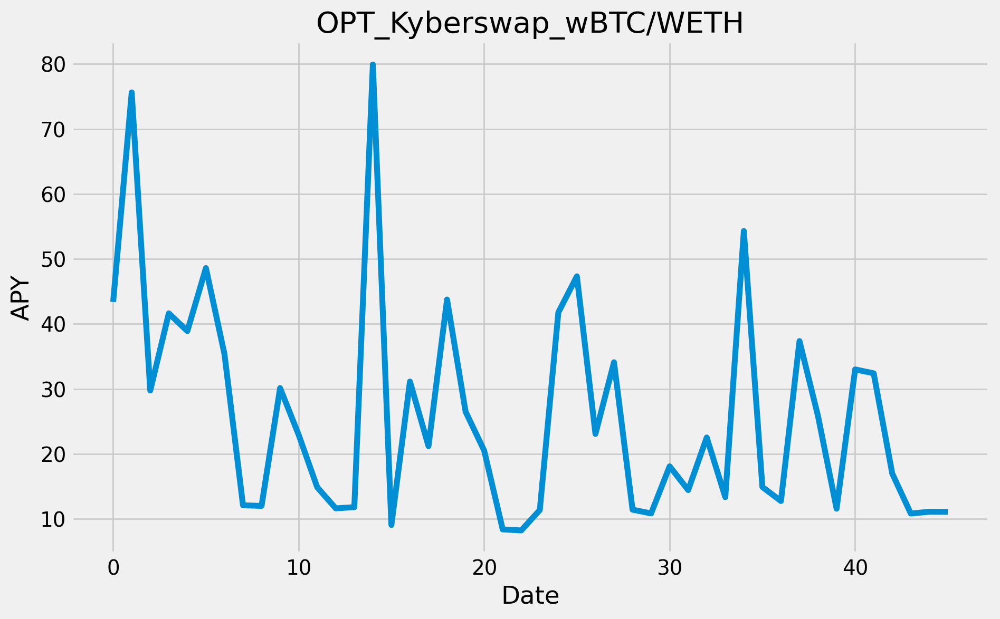

In [1987]:
# Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(OPT_Kyberswap_wBTC_WETH['apy'])

# Customize the chart
plt.title('OPT_Kyberswap_wBTC/WETH')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show()

In [1988]:
#OPT_Uniswapv3_wBTC/WETH_0.05%
is_true = ((df.project == 'uniswap-v3') &
           df.symbol.isin(['WBTC-WETH']) &
           df.chain.isin(['Optimism']))
cols = ['chain', 'project', 'symbol', 'pool', 'tvlUsd', 'apyBase', 'apy', 'apyPct7D', 'apyPct30D', 'apyBase7d', 'apyMean30d', 'volumeUsd7d',
        'mu', 'sigma']
df.loc[is_true, cols].sort_values('apy', ascending=False)
#df.loc[218,cols]

,chain,project,symbol,pool,tvlUsd,apyBase,apy,apyPct7D,apyPct30D,apyBase7d,apyMean30d,volumeUsd7d,mu,sigma


## ETH/Layer 2 Token LPs

In [1989]:
#Mainnet_Uniswapv3_WETH/ARB_1%
is_true = ((df.project == 'uniswap-v3') &
           df.symbol.isin(['ARB-WETH']) &
           df.chain.isin(['Ethereum']))
cols = ['chain', 'project', 'symbol', 'pool', 'tvlUsd', 'apyBase', 'apy', 'apyPct7D', 'apyPct30D', 'apyBase7d', 'apyMean30d', 'volumeUsd7d',
        'mu', 'sigma']
df.loc[is_true, cols].sort_values('apy', ascending=False)

,chain,project,symbol,pool,tvlUsd,apyBase,apy,apyPct7D,apyPct30D,apyBase7d,apyMean30d,volumeUsd7d,mu,sigma
1212,Ethereum,uniswap-v3,ARB-WETH,e6f030b6-c425-43ba-9028-480d2d417866,2293334,11.6184,11.61841%,-79.3841,-263.6191,19.2712,96.7065,"1,096,685.1407",114.6446,2.8423


In [1990]:
#get historical data
Mainnet_Uniswapv3_WETH_ARB_1=obj.get_pool_hist_apy('e6f030b6-c425-43ba-9028-480d2d417866')
Mainnet_Uniswapv3_WETH_ARB_1.reset_index(inplace=True)
Mainnet_Uniswapv3_WETH_ARB_1['date'] = pd.to_datetime(Mainnet_Uniswapv3_WETH_ARB_1['date']).dt.strftime('%Y-%m-%d')
Mainnet_Uniswapv3_WETH_ARB_1.to_excel(writer, sheet_name='Mainnet_Uniswapv3_WETH_ARB_1%', index=False)

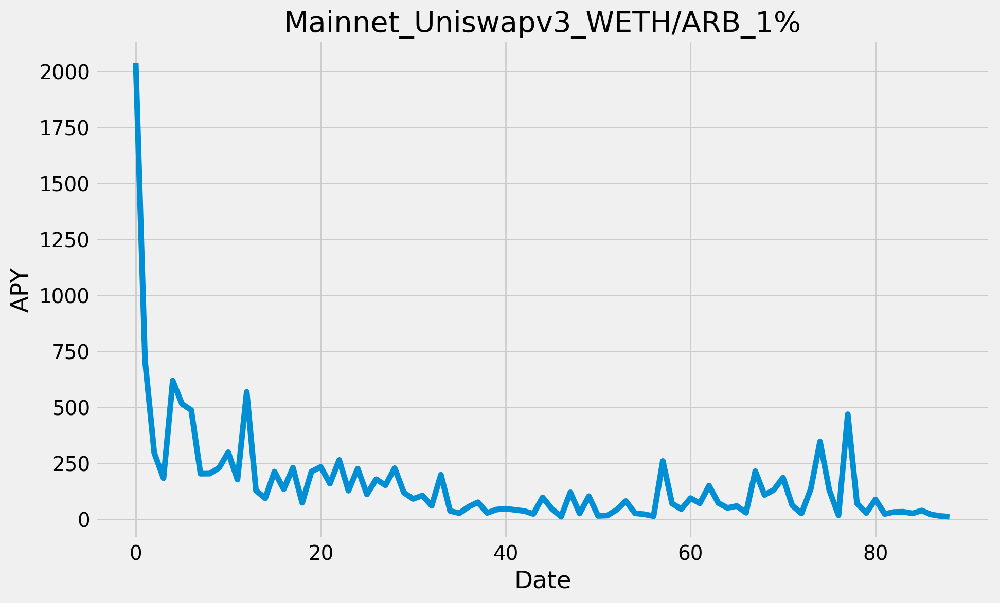

In [1991]:
# Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(Mainnet_Uniswapv3_WETH_ARB_1['apy'])

# Customize the chart
plt.title('Mainnet_Uniswapv3_WETH/ARB_1%')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show()

In [1992]:
#ARB_Uniswapv3_WETH/ARB_0.05%
is_true = ((df.project == 'uniswap-v3') &
           df.symbol.isin(['WETH-ARB']) &
           df.chain.isin(['Arbitrum']))
cols = ['chain', 'project', 'symbol', 'pool', 'tvlUsd', 'apyBase', 'apy', 'apyPct7D', 'apyPct30D', 'apyBase7d', 'apyMean30d', 'volumeUsd7d',
        'mu', 'sigma']
df.loc[is_true, cols].sort_values('apy', ascending=False)

,chain,project,symbol,pool,tvlUsd,apyBase,apy,apyPct7D,apyPct30D,apyBase7d,apyMean30d,volumeUsd7d,mu,sigma
356,Arbitrum,uniswap-v3,WETH-ARB,483c0801-b3c5-4873-87d9-a84a8de4ec92,14388665,7.7987,7.79867%,-4.8558,-80.5585,13.5075,22.6844,"12,458,630.6405",36.5790,1.6568
1642,Arbitrum,uniswap-v3,WETH-ARB,57437274-42a0-45eb-8389-992b8b71fc44,1419386,2.6359,2.63593%,1.5907,-80.6216,6.0135,9.5557,"164,144.4668",25.3623,1.7802
318,Arbitrum,uniswap-v3,WETH-ARB,3e9da80c-274d-4f55-8421-7439d4ef429d,16948557,13.6700,13.66995%,-8.4599,-71.5862,18.8426,31.7462,"122,828,527.2105",43.6389,1.6226
11421,Arbitrum,uniswap-v3,WETH-ARB,1ba996f0-5ffa-4776-a3a9-6d0dc552bbe8,11802,1.1808,1.18078%,0.0489,NaN,0.8158,2.1980,"18,516.4465",3.3772,0.1426


In [1993]:
#get historical data
ARB_Uniswapv3_WETH_ARB_005=obj.get_pool_hist_apy('3e9da80c-274d-4f55-8421-7439d4ef429d')
ARB_Uniswapv3_WETH_ARB_005.reset_index(inplace=True)
ARB_Uniswapv3_WETH_ARB_005['date'] = pd.to_datetime(ARB_Uniswapv3_WETH_ARB_005['date']).dt.strftime('%Y-%m-%d')
ARB_Uniswapv3_WETH_ARB_005.to_excel(writer, sheet_name='ARB_Uniswapv3_WETH_ARB_0.05%', index=False)

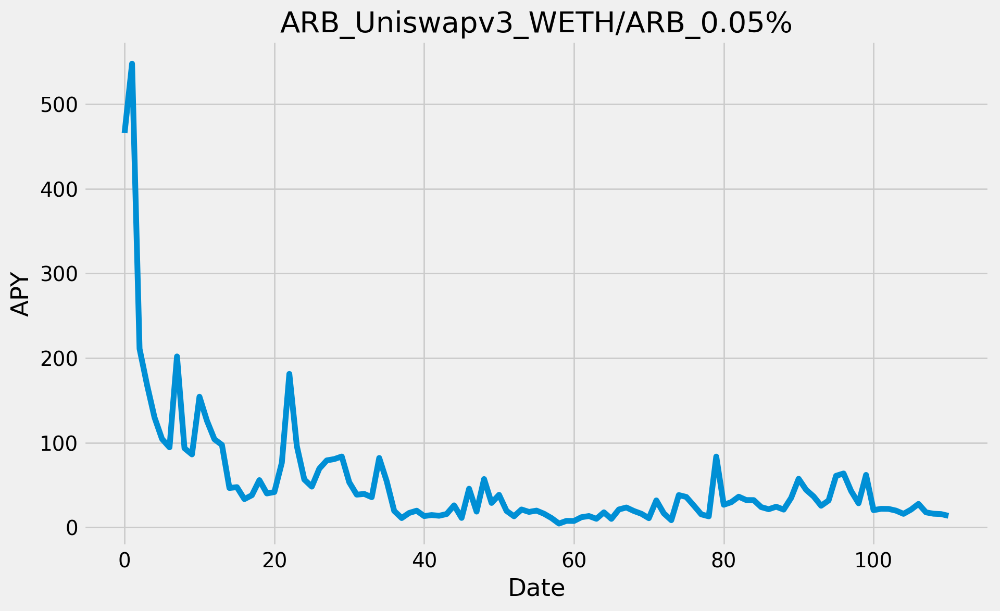

In [1994]:
# Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(ARB_Uniswapv3_WETH_ARB_005['apy'])

# Customize the chart
plt.title('ARB_Uniswapv3_WETH/ARB_0.05%')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show()

In [1995]:
#ARB_Uniswapv3_WETH/ARB_0.3%
is_true = ((df.project == 'uniswap-v3') &
           df.symbol.isin(['WETH-ARB']) &
           df.chain.isin(['Arbitrum']))
cols = ['chain', 'project', 'symbol', 'pool', 'tvlUsd', 'apyBase', 'apy', 'apyPct7D', 'apyPct30D', 'apyBase7d', 'apyMean30d', 'volumeUsd7d',
        'mu', 'sigma']
df.loc[is_true, cols].sort_values('apy', ascending=False)

,chain,project,symbol,pool,tvlUsd,apyBase,apy,apyPct7D,apyPct30D,apyBase7d,apyMean30d,volumeUsd7d,mu,sigma
356,Arbitrum,uniswap-v3,WETH-ARB,483c0801-b3c5-4873-87d9-a84a8de4ec92,14388665,7.7987,7.79867%,-4.8558,-80.5585,13.5075,22.6844,"12,458,630.6405",36.5790,1.6568
1642,Arbitrum,uniswap-v3,WETH-ARB,57437274-42a0-45eb-8389-992b8b71fc44,1419386,2.6359,2.63593%,1.5907,-80.6216,6.0135,9.5557,"164,144.4668",25.3623,1.7802
318,Arbitrum,uniswap-v3,WETH-ARB,3e9da80c-274d-4f55-8421-7439d4ef429d,16948557,13.6700,13.66995%,-8.4599,-71.5862,18.8426,31.7462,"122,828,527.2105",43.6389,1.6226
11421,Arbitrum,uniswap-v3,WETH-ARB,1ba996f0-5ffa-4776-a3a9-6d0dc552bbe8,11802,1.1808,1.18078%,0.0489,NaN,0.8158,2.1980,"18,516.4465",3.3772,0.1426


In [1996]:
#get historical data
ARB_Uniswapv3_WETH_ARB_03=obj.get_pool_hist_apy('483c0801-b3c5-4873-87d9-a84a8de4ec92')
ARB_Uniswapv3_WETH_ARB_03.reset_index(inplace=True)
ARB_Uniswapv3_WETH_ARB_03['date'] = pd.to_datetime(ARB_Uniswapv3_WETH_ARB_03['date']).dt.strftime('%Y-%m-%d')
ARB_Uniswapv3_WETH_ARB_03.to_excel(writer, sheet_name='ARB_Uniswapv3_WETH_ARB_0.3%', index=False)

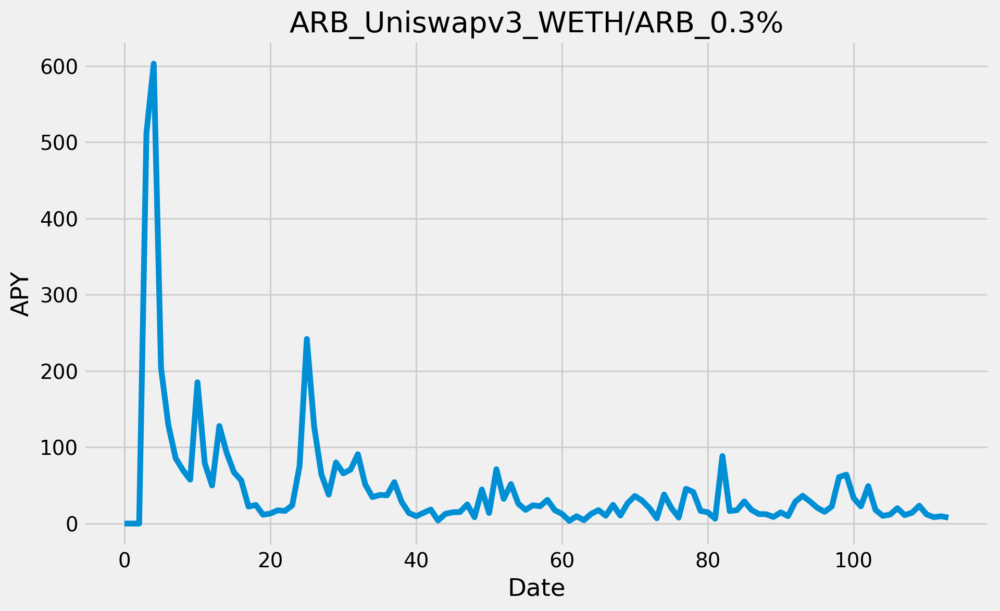

In [1997]:
# Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(ARB_Uniswapv3_WETH_ARB_03['apy'])

# Customize the chart
plt.title('ARB_Uniswapv3_WETH/ARB_0.3%')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show()

In [1998]:
#ARB_Uniswapv3_WETH/ARB_1%
is_true = ((df.project == 'uniswap-v3') &
           df.symbol.isin(['WETH-ARB']) &
           df.chain.isin(['Arbitrum']))
cols = ['chain', 'project', 'symbol', 'pool', 'tvlUsd', 'apyBase', 'apy', 'apyPct7D', 'apyPct30D', 'apyBase7d', 'apyMean30d', 'volumeUsd7d',
        'mu', 'sigma']
df.loc[is_true, cols].sort_values('apy', ascending=False)

,chain,project,symbol,pool,tvlUsd,apyBase,apy,apyPct7D,apyPct30D,apyBase7d,apyMean30d,volumeUsd7d,mu,sigma
356,Arbitrum,uniswap-v3,WETH-ARB,483c0801-b3c5-4873-87d9-a84a8de4ec92,14388665,7.7987,7.79867%,-4.8558,-80.5585,13.5075,22.6844,"12,458,630.6405",36.5790,1.6568
1642,Arbitrum,uniswap-v3,WETH-ARB,57437274-42a0-45eb-8389-992b8b71fc44,1419386,2.6359,2.63593%,1.5907,-80.6216,6.0135,9.5557,"164,144.4668",25.3623,1.7802
318,Arbitrum,uniswap-v3,WETH-ARB,3e9da80c-274d-4f55-8421-7439d4ef429d,16948557,13.6700,13.66995%,-8.4599,-71.5862,18.8426,31.7462,"122,828,527.2105",43.6389,1.6226
11421,Arbitrum,uniswap-v3,WETH-ARB,1ba996f0-5ffa-4776-a3a9-6d0dc552bbe8,11802,1.1808,1.18078%,0.0489,NaN,0.8158,2.1980,"18,516.4465",3.3772,0.1426


In [1999]:
#get historical data
ARB_Uniswapv3_WETH_ARB_1=obj.get_pool_hist_apy('57437274-42a0-45eb-8389-992b8b71fc44')
ARB_Uniswapv3_WETH_ARB_1.reset_index(inplace=True)
ARB_Uniswapv3_WETH_ARB_1['date'] = pd.to_datetime(ARB_Uniswapv3_WETH_ARB_1['date']).dt.strftime('%Y-%m-%d')
ARB_Uniswapv3_WETH_ARB_1.to_excel(writer, sheet_name='ARB_Uniswapv3_WETH_ARB_1%', index=False)

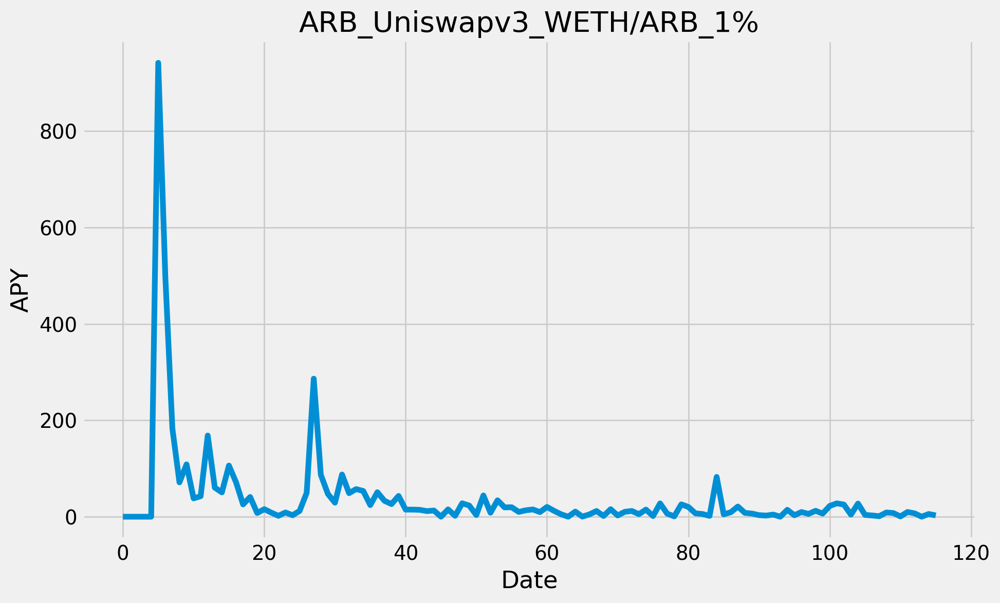

In [2000]:
# Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(ARB_Uniswapv3_WETH_ARB_1['apy'])

# Customize the chart
plt.title('ARB_Uniswapv3_WETH/ARB_1%')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show()

In [2001]:
#ARB_Camelotv2_WETH/ARB
is_true = ((df.project == 'camelot-v2') &
           df.symbol.isin(['WETH-ARB']) &
           df.chain.isin(['Arbitrum']))
cols = ['chain', 'project', 'symbol', 'pool', 'tvlUsd', 'apyBase', 'apy', 'apyPct7D', 'apyPct30D', 'apyBase7d', 'apyMean30d', 'volumeUsd7d',
        'mu', 'sigma']
df.loc[is_true, cols].sort_values('apy', ascending=False)

,chain,project,symbol,pool,tvlUsd,apyBase,apy,apyPct7D,apyPct30D,apyBase7d,apyMean30d,volumeUsd7d,mu,sigma
615,Arbitrum,camelot-v2,WETH-ARB,a383d2c4-d1cb-4706-8da1-54d48bd37417,6022478,1.8542,3.69982%,-2.1607,-20.8143,3.2612,5.9355,"1,258,999.6486",24.3046,1.2235


In [2002]:
#get historical data
ARB_Camelotv2_WETH_ARB=obj.get_pool_hist_apy('a383d2c4-d1cb-4706-8da1-54d48bd37417')
ARB_Camelotv2_WETH_ARB.reset_index(inplace=True)
ARB_Camelotv2_WETH_ARB['date'] = pd.to_datetime(ARB_Camelotv2_WETH_ARB['date']).dt.strftime('%Y-%m-%d')
ARB_Camelotv2_WETH_ARB.to_excel(writer, sheet_name='ARB_Camelotv2_WETH_ARB', index=False)

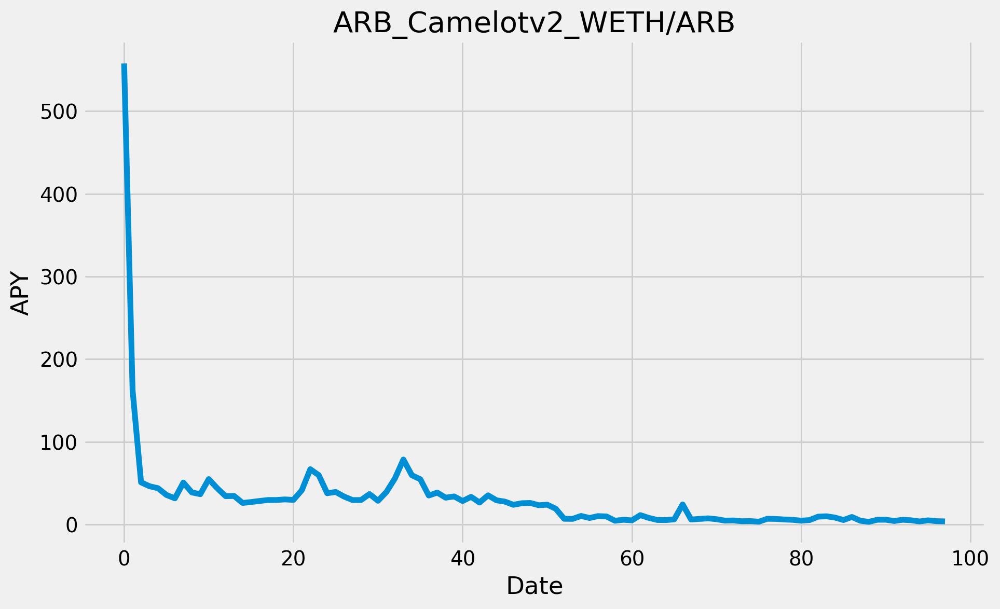

In [2003]:
# Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(ARB_Camelotv2_WETH_ARB['apy'])

# Customize the chart
plt.title('ARB_Camelotv2_WETH/ARB')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show()

In [2004]:
#ARB_Sushiswap_WETH/ARB
is_true = ((df.project == 'sushiswap') &
           df.symbol.isin(['WETH-ARB']) &
           df.chain.isin(['Arbitrum']))
cols = ['chain', 'project', 'symbol', 'pool', 'tvlUsd', 'apyBase', 'apy', 'apyPct7D', 'apyPct30D', 'apyBase7d', 'apyMean30d', 'volumeUsd7d',
        'mu', 'sigma']
df.loc[is_true, cols].sort_values('apy', ascending=False)

,chain,project,symbol,pool,tvlUsd,apyBase,apy,apyPct7D,apyPct30D,apyBase7d,apyMean30d,volumeUsd7d,mu,sigma
1556,Arbitrum,sushiswap,WETH-ARB,e2c7ccef-4716-4f03-ae97-c2d8f6d35a18,1533283,4.4379,5.28021%,-1.9945,-27.6161,4.9474,8.2904,"486,267.7207",19.2585,0.8675


In [2005]:
#get historical data
ARB_Sushiswap_WETH_ARB=obj.get_pool_hist_apy('e2c7ccef-4716-4f03-ae97-c2d8f6d35a18')
ARB_Sushiswap_WETH_ARB.reset_index(inplace=True)
ARB_Sushiswap_WETH_ARB['date'] = pd.to_datetime(ARB_Sushiswap_WETH_ARB['date']).dt.strftime('%Y-%m-%d')
ARB_Sushiswap_WETH_ARB.to_excel(writer, sheet_name='ARB_Sushiswap_WETH_ARB', index=False)

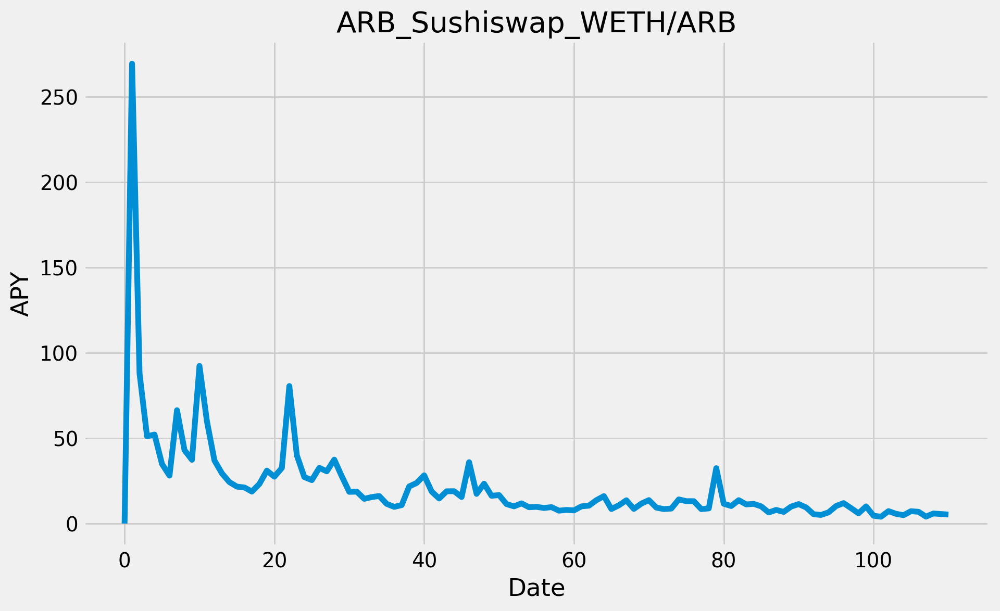

In [2006]:
# Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(ARB_Sushiswap_WETH_ARB['apy'])

# Customize the chart
plt.title('ARB_Sushiswap_WETH/ARB')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show()

In [2007]:
#ARB_Kyberswap_WETH/ARB_0.25%
is_true = ((df.project == 'kyberswap-elastic') &
           df.symbol.isin(['WETH-ARB']) &
           df.chain.isin(['Arbitrum']))
cols = ['chain', 'project', 'symbol', 'pool', 'tvlUsd', 'apyBase', 'apy', 'apyPct7D', 'apyPct30D', 'apyBase7d', 'apyMean30d', 'volumeUsd7d',
        'mu', 'sigma']
df.loc[is_true, cols].sort_values('apy', ascending=False)

,chain,project,symbol,pool,tvlUsd,apyBase,apy,apyPct7D,apyPct30D,apyBase7d,apyMean30d,volumeUsd7d,mu,sigma
1493,Arbitrum,kyberswap-elastic,WETH-ARB,fc3d8376-b76f-45d1-95e7-d89dd5defa10,1640973,14.9300,29.8194%,-8.5470,-203.1455,NaN,56.7419,NaN,59.4868,0.9161
2046,Arbitrum,kyberswap-elastic,WETH-ARB,5979937e-7c1a-4d2c-8d7f-d0e6827f2207,971446,13.4189,27.36333%,12.9838,-293.0427,NaN,55.7291,NaN,62.7456,1.3273
3354,Arbitrum,kyberswap-elastic,WETH-ARB,92e7ee74-2cbb-4a81-99a5-b7218a643b44,399077,0.0000,27.13526%,8.0164,"-1,508.3960",NaN,134.6835,NaN,83.1145,3.3444
2629,Arbitrum,kyberswap-elastic,WETH-ARB,96afe487-4be1-48e3-9b08-333f385b45bf,633702,0.0000,21.37664%,6.4093,-467.4434,NaN,59.0854,NaN,64.3710,1.8178


In [2008]:
#get historical data
ARB_Kyberswap_WETH_ARB_025=obj.get_pool_hist_apy('fc3d8376-b76f-45d1-95e7-d89dd5defa10')
ARB_Kyberswap_WETH_ARB_025.reset_index(inplace=True)
ARB_Kyberswap_WETH_ARB_025['date'] = pd.to_datetime(ARB_Kyberswap_WETH_ARB_025['date']).dt.strftime('%Y-%m-%d')
ARB_Kyberswap_WETH_ARB_025.to_excel(writer, sheet_name='ARB_Kyberswap_WETH_ARB_0.25%', index=False)

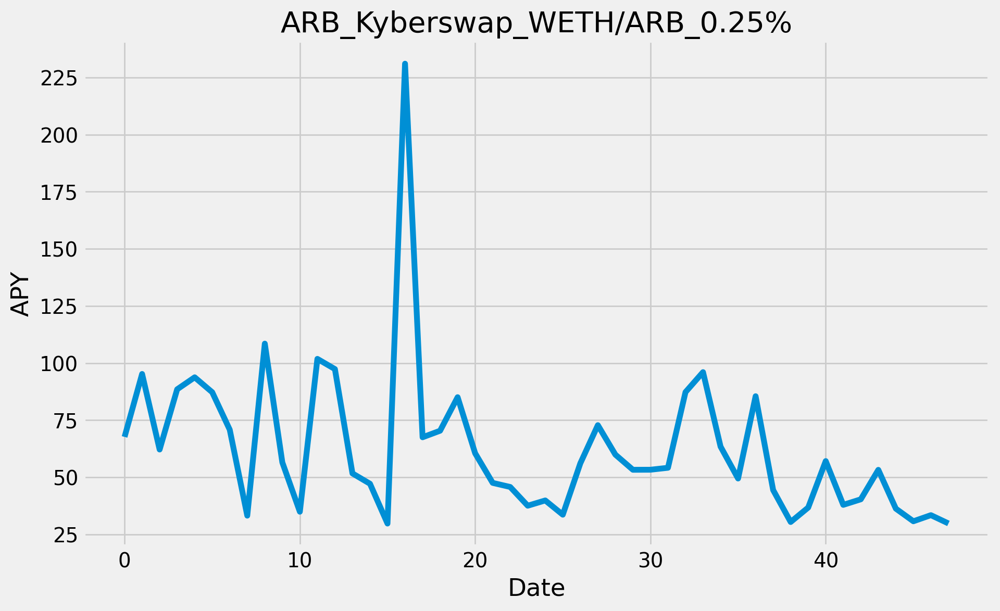

In [2009]:
# Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(ARB_Kyberswap_WETH_ARB_025['apy'])

# Customize the chart
plt.title('ARB_Kyberswap_WETH/ARB_0.25%')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show()

In [2010]:
#ARB_Kyberswap_WETH/ARB_1%
is_true = ((df.project == 'kyberswap-elastic') &
           df.symbol.isin(['WETH-ARB']) &
           df.chain.isin(['Arbitrum']))
cols = ['chain', 'project', 'symbol', 'pool', 'tvlUsd', 'apyBase', 'apy', 'apyPct7D', 'apyPct30D', 'apyBase7d', 'apyMean30d', 'volumeUsd7d',
        'mu', 'sigma']
df.loc[is_true, cols].sort_values('apy', ascending=False)

,chain,project,symbol,pool,tvlUsd,apyBase,apy,apyPct7D,apyPct30D,apyBase7d,apyMean30d,volumeUsd7d,mu,sigma
1493,Arbitrum,kyberswap-elastic,WETH-ARB,fc3d8376-b76f-45d1-95e7-d89dd5defa10,1640973,14.9300,29.8194%,-8.5470,-203.1455,NaN,56.7419,NaN,59.4868,0.9161
2046,Arbitrum,kyberswap-elastic,WETH-ARB,5979937e-7c1a-4d2c-8d7f-d0e6827f2207,971446,13.4189,27.36333%,12.9838,-293.0427,NaN,55.7291,NaN,62.7456,1.3273
3354,Arbitrum,kyberswap-elastic,WETH-ARB,92e7ee74-2cbb-4a81-99a5-b7218a643b44,399077,0.0000,27.13526%,8.0164,"-1,508.3960",NaN,134.6835,NaN,83.1145,3.3444
2629,Arbitrum,kyberswap-elastic,WETH-ARB,96afe487-4be1-48e3-9b08-333f385b45bf,633702,0.0000,21.37664%,6.4093,-467.4434,NaN,59.0854,NaN,64.3710,1.8178


In [2011]:
#get historical data
ARB_Kyberswap_WETH_ARB_1=obj.get_pool_hist_apy('5979937e-7c1a-4d2c-8d7f-d0e6827f2207')
ARB_Kyberswap_WETH_ARB_1.reset_index(inplace=True)
ARB_Kyberswap_WETH_ARB_1['date'] = pd.to_datetime(ARB_Kyberswap_WETH_ARB_1['date']).dt.strftime('%Y-%m-%d')
ARB_Kyberswap_WETH_ARB_1.to_excel(writer, sheet_name='ARB_Kyberswap_WETH_ARB_1%', index=False)

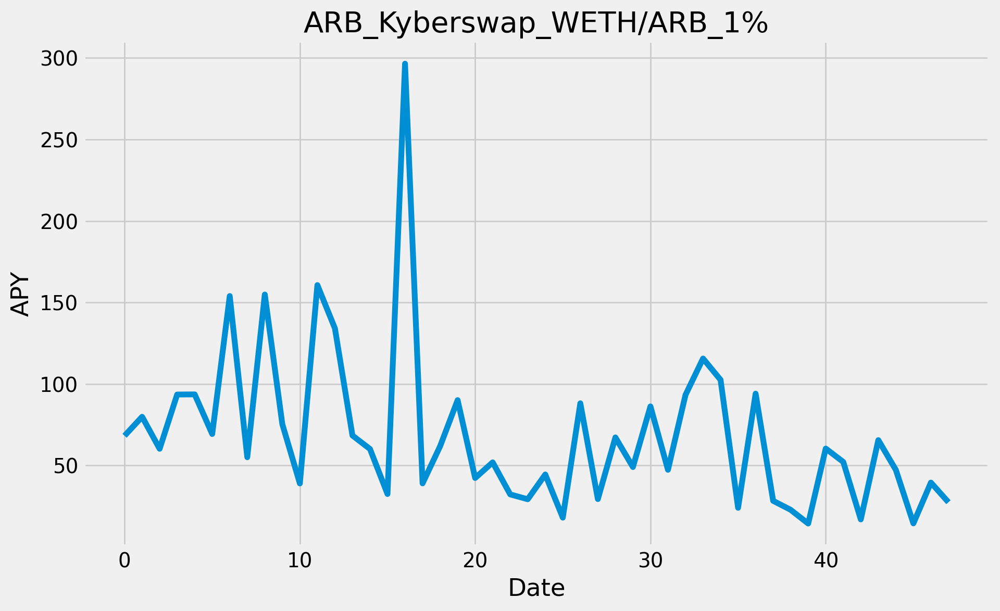

In [2012]:
# Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(ARB_Kyberswap_WETH_ARB_1['apy'])

# Customize the chart
plt.title('ARB_Kyberswap_WETH/ARB_1%')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show()

In [2013]:
#ARB_Kyberswap_WETH/ARB_2%
is_true = ((df.project == 'kyberswap-elastic') &
           df.symbol.isin(['WETH-ARB']) &
           df.chain.isin(['Arbitrum']))
cols = ['chain', 'project', 'symbol', 'pool', 'tvlUsd', 'apyBase', 'apy', 'apyPct7D', 'apyPct30D', 'apyBase7d', 'apyMean30d', 'volumeUsd7d',
        'mu', 'sigma']
df.loc[is_true, cols].sort_values('apy', ascending=False)

,chain,project,symbol,pool,tvlUsd,apyBase,apy,apyPct7D,apyPct30D,apyBase7d,apyMean30d,volumeUsd7d,mu,sigma
1493,Arbitrum,kyberswap-elastic,WETH-ARB,fc3d8376-b76f-45d1-95e7-d89dd5defa10,1640973,14.9300,29.8194%,-8.5470,-203.1455,NaN,56.7419,NaN,59.4868,0.9161
2046,Arbitrum,kyberswap-elastic,WETH-ARB,5979937e-7c1a-4d2c-8d7f-d0e6827f2207,971446,13.4189,27.36333%,12.9838,-293.0427,NaN,55.7291,NaN,62.7456,1.3273
3354,Arbitrum,kyberswap-elastic,WETH-ARB,92e7ee74-2cbb-4a81-99a5-b7218a643b44,399077,0.0000,27.13526%,8.0164,"-1,508.3960",NaN,134.6835,NaN,83.1145,3.3444
2629,Arbitrum,kyberswap-elastic,WETH-ARB,96afe487-4be1-48e3-9b08-333f385b45bf,633702,0.0000,21.37664%,6.4093,-467.4434,NaN,59.0854,NaN,64.3710,1.8178


In [2014]:
#get historical data
ARB_Kyberswap_WETH_ARB_2=obj.get_pool_hist_apy('96afe487-4be1-48e3-9b08-333f385b45bf')
ARB_Kyberswap_WETH_ARB_2.reset_index(inplace=True)
ARB_Kyberswap_WETH_ARB_2['date'] = pd.to_datetime(ARB_Kyberswap_WETH_ARB_2['date']).dt.strftime('%Y-%m-%d')
ARB_Kyberswap_WETH_ARB_2.to_excel(writer, sheet_name='ARB_Kyberswap_WETH_ARB_2%', index=False)

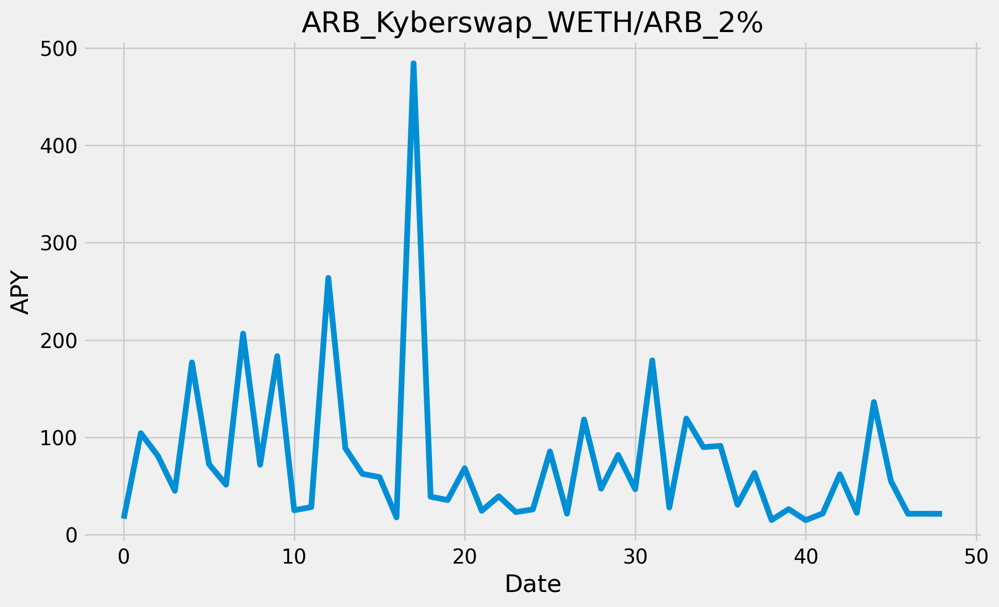

In [2015]:
# Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(ARB_Kyberswap_WETH_ARB_2['apy'])

# Customize the chart
plt.title('ARB_Kyberswap_WETH/ARB_2%')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show()

In [2016]:
#OPT_Uniswapv3_WETH/OP
is_true = ((df.project == 'uniswap-v3') &
           df.symbol.isin(['OP-WETH']) &
           df.chain.isin(['Optimism']))
cols = ['chain', 'project', 'symbol', 'pool', 'tvlUsd', 'apyBase', 'apy', 'apyPct7D', 'apyPct30D', 'apyBase7d', 'apyMean30d', 'volumeUsd7d',
        'mu', 'sigma']
df.loc[is_true, cols].sort_values('apy', ascending=False)

,chain,project,symbol,pool,tvlUsd,apyBase,apy,apyPct7D,apyPct30D,apyBase7d,apyMean30d,volumeUsd7d,mu,sigma


In [2017]:
#OPT_Velodrome_OP/WETH
is_true = ((df.project == 'velodrome') &
           df.symbol.isin(['WETH-OP']) &
           df.chain.isin(['Optimism']))
cols = ['chain', 'project', 'symbol', 'pool', 'tvlUsd', 'apyBase', 'apy', 'apyPct7D', 'apyPct30D', 'apyBase7d', 'apyMean30d', 'volumeUsd7d',
        'mu', 'sigma']
df.loc[is_true, cols].sort_values('apy', ascending=False)

,chain,project,symbol,pool,tvlUsd,apyBase,apy,apyPct7D,apyPct30D,apyBase7d,apyMean30d,volumeUsd7d,mu,sigma
3597,Optimism,velodrome,WETH-OP,977f025a-9d34-40a9-b9e7-c492b7ac88ed,347895,NaN,1.57732%,-2.8141,-16.3682,NaN,11.7903,NaN,25.6760,0.4852


In [2018]:
#get historical data
OPT_Velodrome_OP_WETH=obj.get_pool_hist_apy('977f025a-9d34-40a9-b9e7-c492b7ac88ed')
OPT_Velodrome_OP_WETH.reset_index(inplace=True)
OPT_Velodrome_OP_WETH['date'] = pd.to_datetime(OPT_Velodrome_OP_WETH['date']).dt.strftime('%Y-%m-%d')
OPT_Velodrome_OP_WETH.to_excel(writer, sheet_name='OPT_Velodrome_OP_WETH', index=False)

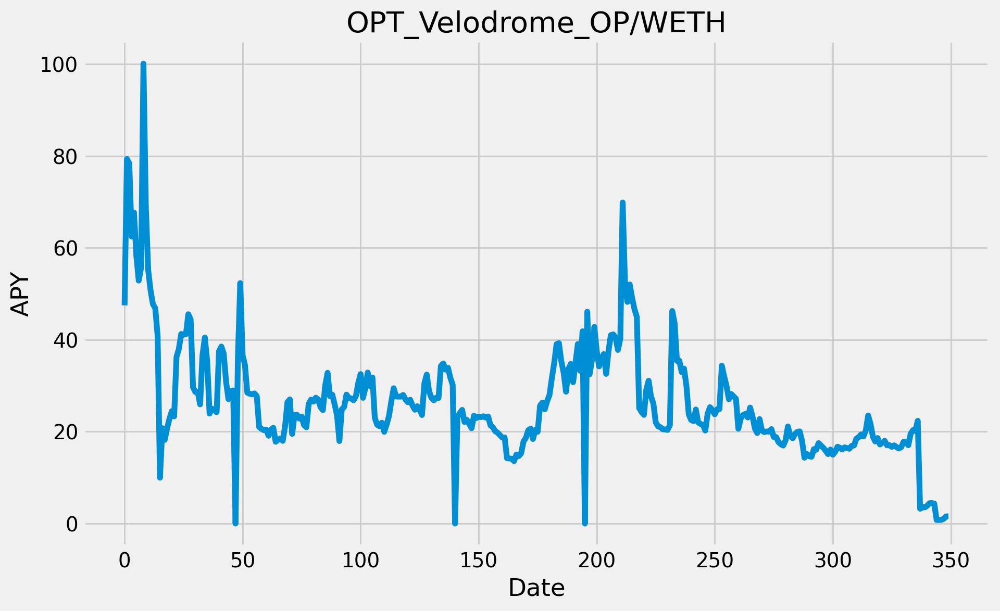

In [2019]:
# Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(OPT_Velodrome_OP_WETH['apy'])

# Customize the chart
plt.title('OPT_Velodrome_OP/WETH')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show()

In [2020]:
#OPT_Velodrome_wstETH/OP
is_true = ((df.project == 'velodrome') &
           df.symbol.isin(['WSTETH-OP']) &
           df.chain.isin(['Optimism']))
cols = ['chain', 'project', 'symbol', 'pool', 'tvlUsd', 'apyBase', 'apy', 'apyPct7D', 'apyPct30D', 'apyBase7d', 'apyMean30d', 'volumeUsd7d',
        'mu', 'sigma']
df.loc[is_true, cols].sort_values('apy', ascending=False)

,chain,project,symbol,pool,tvlUsd,apyBase,apy,apyPct7D,apyPct30D,apyBase7d,apyMean30d,volumeUsd7d,mu,sigma
6801,Optimism,velodrome,WSTETH-OP,81945c18-909d-4403-95b8-affba32cc814,87823,NaN,2.95137%,2.2564,-21.3095,NaN,14.3824,NaN,29.6096,0.6079


In [2021]:
#get historical data
OPT_Velodrome_wstETH_OP=obj.get_pool_hist_apy('81945c18-909d-4403-95b8-affba32cc814')
OPT_Velodrome_wstETH_OP.reset_index(inplace=True)
OPT_Velodrome_wstETH_OP['date'] = pd.to_datetime(OPT_Velodrome_wstETH_OP['date']).dt.strftime('%Y-%m-%d')
OPT_Velodrome_wstETH_OP.to_excel(writer, sheet_name='OPT_Velodrome_wstETH_OP', index=False)

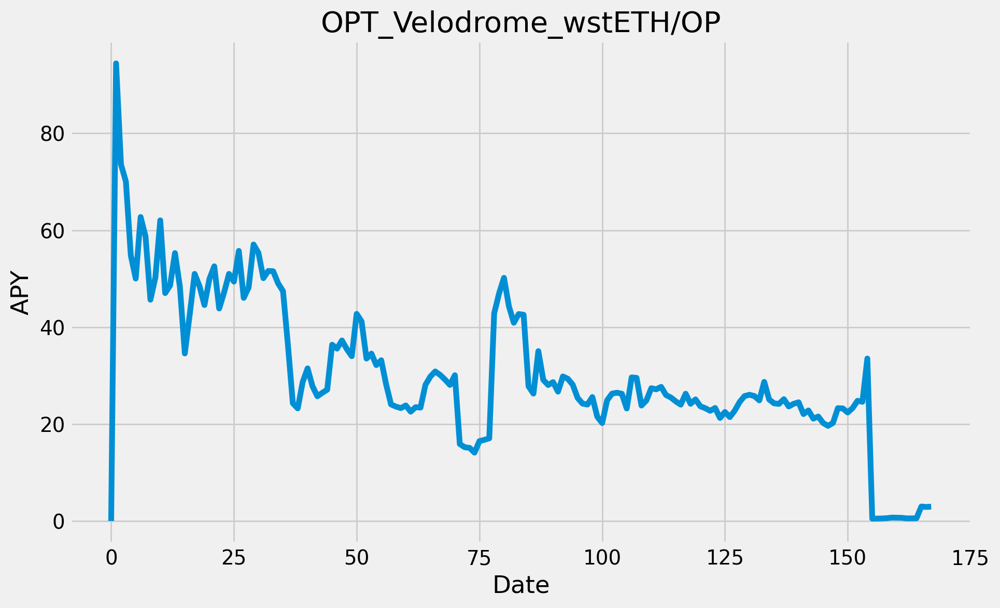

In [2022]:
# Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(OPT_Velodrome_wstETH_OP['apy'])

# Customize the chart
plt.title('OPT_Velodrome_wstETH/OP')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show()

In [2023]:
#OPT_Kyberswap_WETH/OP_2%
is_true = ((df.project == 'kyberswap-elastic') &
           df.symbol.isin(['WETH-OP']) &
           df.chain.isin(['Optimism']))
cols = ['chain', 'project', 'symbol', 'pool', 'tvlUsd', 'apyBase', 'apy', 'apyPct7D', 'apyPct30D', 'apyBase7d', 'apyMean30d', 'volumeUsd7d',
        'mu', 'sigma']
df.loc[is_true, cols].sort_values('apy', ascending=False)

,chain,project,symbol,pool,tvlUsd,apyBase,apy,apyPct7D,apyPct30D,apyBase7d,apyMean30d,volumeUsd7d,mu,sigma
3799,Optimism,kyberswap-elastic,WETH-OP,32a6c88b-246b-4de5-8991-a50e0b77d66b,314350,35.7687,72.1445%,9.4930,-141.3049,NaN,100.3770,NaN,100.4688,1.9773


In [2024]:
#get historical data
OPT_Kyberswap_WETH_OP_2=obj.get_pool_hist_apy('32a6c88b-246b-4de5-8991-a50e0b77d66b')
OPT_Kyberswap_WETH_OP_2.reset_index(inplace=True)
OPT_Kyberswap_WETH_OP_2['date'] = pd.to_datetime(OPT_Kyberswap_WETH_OP_2['date']).dt.strftime('%Y-%m-%d')
OPT_Kyberswap_WETH_OP_2.to_excel(writer, sheet_name='OPT_Kyberswap_WETH_OP_2%', index=False)

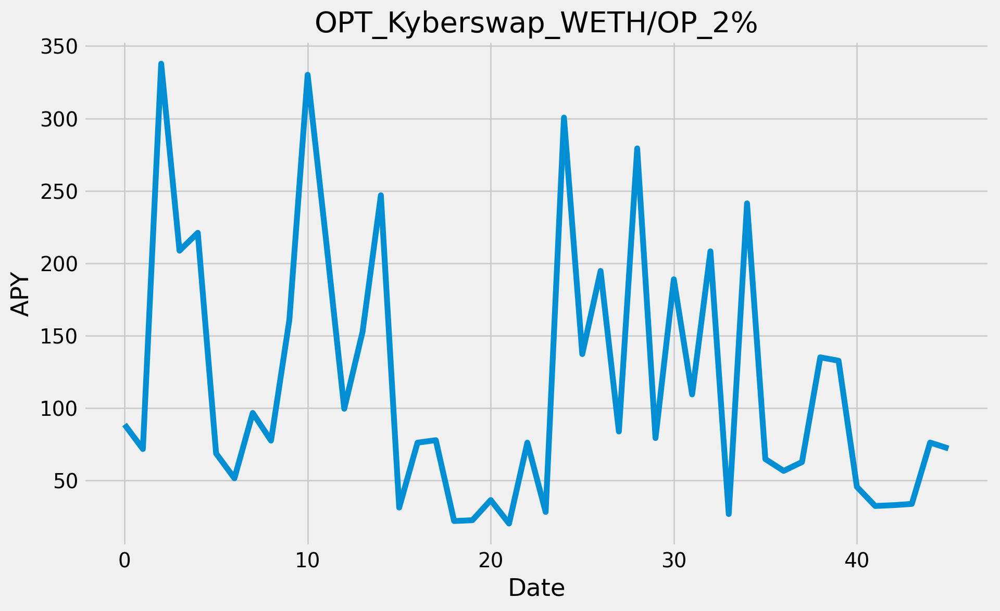

In [2025]:
# Create the time-series plot
plt.figure(figsize=(10, 6))
plt.plot(OPT_Kyberswap_WETH_OP_2['apy'])

# Customize the chart
plt.title('OPT_Kyberswap_WETH/OP_2%')
plt.xlabel('Date')
plt.ylabel('APY')

# Display the chart
plt.show()

In [2026]:
writer.save()

In [2027]:
""" # plot both TVL and APY over time to see their relationships. 
ax1 = df.tvlUsd.plot()
dollar_formatter = FuncFormatter(human_format_dollar_or_num(dollar=True, decimals=0))
ax1.yaxis.set_major_formatter(dollar_formatter)
for tl in ax1.get_yticklabels():
    tl.set_color('#008FD5')
ax1.set_ylabel('TVL ($USD)', color='#008FD5')

ax2 = ax1.twinx()
ax2.plot(df.index, df.apy, color='#77AB43')
ax2.yaxis.set_major_formatter(PercentFormatter(decimals=2))
for tl in ax2.get_yticklabels():
    tl.set_color('#77AB43')
ax2.set_ylabel('APY', color='#77AB43')

fig_tit = ', '.join(meta.values.tolist()[0])
plt.title(fig_tit);     """

" # plot both TVL and APY over time to see their relationships. \nax1 = df.tvlUsd.plot()\ndollar_formatter = FuncFormatter(human_format_dollar_or_num(dollar=True, decimals=0))\nax1.yaxis.set_major_formatter(dollar_formatter)\nfor tl in ax1.get_yticklabels():\n    tl.set_color('#008FD5')\nax1.set_ylabel('TVL ($USD)', color='#008FD5')\n\nax2 = ax1.twinx()\nax2.plot(df.index, df.apy, color='#77AB43')\nax2.yaxis.set_major_formatter(PercentFormatter(decimals=2))\nfor tl in ax2.get_yticklabels():\n    tl.set_color('#77AB43')\nax2.set_ylabel('APY', color='#77AB43')\n\nfig_tit = ', '.join(meta.values.tolist()[0])\nplt.title(fig_tit);     "